Live link to DataSet - https://docs.google.com/spreadsheets/d/1OME7otpslv2-fIW_XsCvzSnXQ6BylFNjc14RglLCDTk/edit?usp=sharing

# Importing DataSet

In [ ]:
import pandas as pd
data_url = "https://docs.google.com/spreadsheets/d/1OME7otpslv2-fIW_XsCvzSnXQ6BylFNjc14RglLCDTk/edit?usp=sharing"
data_url_extracted = data_url.replace("/edit?usp=sharing", "/export?format=csv")
df = pd.read_csv(data_url_extracted)
df.head()

,Product Name,Category,Daily Production/Quantity,Transportation Method,Vehicle Type,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),...,Is Real-time Tracking Used?,Tracking Method,Data Collected,Initial Quality Grade,Shelf Life (Days),Spoilage Percentage (%),Reasons for Spoilage,Transportation Cost per Trip,Storage Cost,Wastage Cost
0,Cluster Beans,Vegetable,1342,By Road,Mini Truck,1.0,1,1,114,10,...,Yes,RFID + GPS,Location,AA,12,1.6,Pest damage,28192,11237,1470
1,Dry Chillies,Spice,23934,By Road,Mini Truck,1.5,4,2,87,26,...,No,NaN,Quantity,B,189,2.0,Delay in transit,26896,10075,3606
2,Elephant Yam,Root Crop,14384,By Road,Bulk Truck,28.0,2,3,236,2,...,Yes,GPS,Location,A-,9,9.7,Pest damage,13822,6747,2921
3,Drumstick,Vegetable,15799,By Road,Mini Refrigerated Van,1.0,4,1,299,2,...,Yes,GPS + IoT,"Temp, humidity, location",B+,5,7.6,Mechanical damage,16330,11282,3345
4,Banana,Fruit,1761,By Road,Mini Refrigerated Van,1.0,4,2,224,18,...,No,NaN,Quantity,B,18,3.0,Improper stacking,8347,8036,497


#Data Description

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 32 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Product Name                     100000 non-null  object 
 1   Category                         100000 non-null  object 
 2   Daily Production/Quantity        100000 non-null  int64  
 3   Transportation Method            100000 non-null  object 
 4   Vehicle Type                     100000 non-null  object 
 5   Vehicle Capacity (kg/ton)        100000 non-null  float64
 6   No. of Vehicles Used Per Day     100000 non-null  int64  
 7   Trip Frequency                   100000 non-null  int64  
 8   Average Distance Travelled (km)  100000 non-null  int64  
 9   Temperature Maintained (°C)      100000 non-null  int64  
 10  Humidity Maintained (%)          100000 non-null  int64  
 11  Packaging Method                 100000 non-null  object 
 12  Tim

In [ ]:
numerical_cols = df.select_dtypes(include=['number']).columns.tolist()
object_cols = df.select_dtypes(include=['object']).columns.tolist()

print("Non-Categorical Variables (Numerical):")
print(numerical_cols)
print("\n")

print("Categorical Variables (Object Type):")

nominal_cols = []
ordinal_cols = []

nominal_cols = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method',
    'Source Location', 'Destination Location', 'Who Receives the Goods?',
    'End User Type', 'Tracking Method', 'Data Collected', 'Reasons for Spoilage'
]

ordinal_cols = [
    'Initial Quality Grade', 'Time of Harvest', 'Time to Loading', 'Is Real-time Tracking Used?'
]

print("  Nominal Categorical Variables:")
print(nominal_cols)
print("\n  Ordinal Categorical Variables:")
print(ordinal_cols)


Non-Categorical Variables (Numerical):
['Daily Production/Quantity', 'Vehicle Capacity (kg/ton)', 'No. of Vehicles Used Per Day', 'Trip Frequency', 'Average Distance Travelled (km)', 'Temperature Maintained (°C)', 'Humidity Maintained (%)', 'Transport Duration (hours)', 'Unloading Time', 'Total Supply Chain Time', 'Daily Demand', 'Shelf Life (Days)', 'Spoilage Percentage (%)', 'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost']


Categorical Variables (Object Type):
  Nominal Categorical Variables:
['Product Name', 'Category', 'Transportation Method', 'Vehicle Type', 'Packaging Method', 'Source Location', 'Destination Location', 'Who Receives the Goods?', 'End User Type', 'Tracking Method', 'Data Collected', 'Reasons for Spoilage']

  Ordinal Categorical Variables:
['Initial Quality Grade', 'Time of Harvest', 'Time to Loading', 'Is Real-time Tracking Used?']


##Taking Random Sample


In [ ]:
av018_ = df.sample(n=5001, random_state =18)
print(av018_.head())

                 Product Name         Category  Daily Production/Quantity  \
29982             Water Melon            Fruit                       1236   
6395   Bhindi (Ladies Finger)        Vegetable                      21705   
48206               Drumstick        Vegetable                      23029   
37505        Coriander Leaves  Leafy Vegetable                      16027   
23795            Elephant Yam        Root Crop                       2716   

      Transportation Method Vehicle Type  Vehicle Capacity (kg/ton)  \
29982               By Road   Open Truck                       12.0   
6395                By Road   Mini Truck                        1.0   
48206               By Road   Bulk Truck                       28.0   
37505               By Road   Bulk Truck                       28.0   
23795               By Road   Bulk Truck                       28.0   

       No. of Vehicles Used Per Day  Trip Frequency  \
29982                             5               2   


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
import pandas as pd

# Make a copy of av018_ to avoid modifying the original DataFrame unintentionally
av018_processed = av018_.copy()

# Define nominal and ordinal columns based on earlier definition in the notebook
nominal_cols = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method',
    'Source Location', 'Destination Location', 'Who Receives the Goods?',
    'End User Type', 'Tracking Method', 'Data Collected', 'Reasons for Spoilage'
]
ordinal_cols = [
    'Initial Quality Grade', 'Time of Harvest', 'Time to Loading', 'Is Real-time Tracking Used?'
]

# --- Label Encoding for Ordinal Variables ---
# Create a list of ordinal columns that actually need label encoding
# Exclude 'Time of Harvest' and 'Time to Loading' from direct label encoding here,
# as they are time-based and might be better handled as numerical features or with different encoding if needed.
# For now, focus on 'Initial Quality Grade' and 'Is Real-time Tracking Used?' as truly ordinal.
ordinal_cols_to_label_encode = ['Initial Quality Grade', 'Is Real-time Tracking Used?']

for col in ordinal_cols_to_label_encode:
    if col in av018_processed.columns and av018_processed[col].dtype == 'object':
        le = LabelEncoder()
        av018_processed[col] = le.fit_transform(av018_processed[col])
        print(f"Label Encoded '{col}':")
        print(av018_processed[[col]].head())
    else:
        print(f"Warning: Column '{col}' not found or not object type for Label Encoding. Skipping.")

# --- One-Hot Encoding for Nominal Variables ---
# Identify nominal columns that have not been label encoded and are still of object type.
# This list should also include 'Time of Harvest' and 'Time to Loading' if they are still object type
# and were not handled by label encoding, treating them as nominal for OHE.
nominal_cols_for_ohe = [
    col for col in nominal_cols if col in av018_processed.columns and av018_processed[col].dtype == 'object'
]

# Add 'Time of Harvest' and 'Time to Loading' if they are still object type and not yet encoded
for col in ['Time of Harvest', 'Time to Loading']:
    if col in av018_processed.columns and av018_processed[col].dtype == 'object' and col not in nominal_cols_for_ohe:
        nominal_cols_for_ohe.append(col)

nominal_cols_for_ohe = list(set(nominal_cols_for_ohe)) # Remove potential duplicates and ensure uniqueness

if nominal_cols_for_ohe:
    # Use ColumnTransformer for One-Hot Encoding
    # remainder='passthrough' will keep all numerical columns (original and label-encoded) as they are.
    ct = ColumnTransformer(
        transformers=[
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_for_ohe)
        ],
        remainder='passthrough'
    )

    # Apply the transformer. This will return a numpy array.
    transformed_data = ct.fit_transform(av018_processed)

    # Get the names of all output features from the ColumnTransformer
    all_output_feature_names = ct.get_feature_names_out()

    # Convert the transformed data back to a DataFrame
    av018_processed_encoded = pd.DataFrame(transformed_data, columns=all_output_feature_names)

    print(f"\nOne-Hot Encoded columns: {nominal_cols_for_ohe}")
    print("\nFirst 5 rows of av018_processed after encoding:")
    print(av018_processed_encoded.head())
    print(f"\nShape of av018_processed after encoding: {av018_processed_encoded.shape}")

    av018_processed = av018_processed_encoded.copy()

else:
    print("\nNo nominal columns identified for One-Hot Encoding, or all were already encoded.")
    print("\nFirst 5 rows of av018_processed after encoding (only Label Encoded/numerical present):")
    print(av018_processed.head())
    print(f"\nShape of av018_processed after encoding: {av018_processed.shape}")


Label Encoded 'Initial Quality Grade':
       Initial Quality Grade
29982                      0
6395                       4
48206                      1
37505                      4
23795                      1
Label Encoded 'Is Real-time Tracking Used?':
       Is Real-time Tracking Used?
29982                            1
6395                             0
48206                            1
37505                            0
23795                            1

One-Hot Encoded columns: ['Destination Location', 'Reasons for Spoilage', 'Category', 'Vehicle Type', 'Product Name', 'Time of Harvest', 'Time to Loading', 'Transportation Method', 'Who Receives the Goods?', 'Source Location', 'Tracking Method', 'End User Type', 'Data Collected', 'Packaging Method']

First 5 rows of av018_processed after encoding:
   onehot__Destination Location_Ahmedabad GJ  \
0                                        0.0   
1                                        0.0   
2                                    

## Data Preprocessing

In [ ]:
import pandas as pd

# 1. Calculate the percentage of missing values for each column
missing_percentages = av018_.isnull().sum() / len(av018_) * 100

# 2. Identify the columns where the percentage of missing values is 50% or greater
columns_to_drop = missing_percentages[missing_percentages >= 50].index.tolist()

print("Missing percentages for all columns:")
print(missing_percentages)
print("\nColumns to be dropped (>= 50% missing values):")
print(columns_to_drop)


Missing percentages for all columns:
Product Name                        0.000000
Category                            0.000000
Daily Production/Quantity           0.000000
Transportation Method               0.000000
Vehicle Type                        0.000000
Vehicle Capacity (kg/ton)           0.000000
No. of Vehicles Used Per Day        0.000000
Trip Frequency                      0.000000
Average Distance Travelled (km)     0.000000
Temperature Maintained (°C)         0.000000
Humidity Maintained (%)             0.000000
Packaging Method                    0.000000
Time of Harvest                     0.000000
Time to Loading                     0.000000
Transport Duration (hours)          0.000000
Unloading Time                      0.000000
Total Supply Chain Time             0.000000
Source Location                     0.000000
Destination Location                0.000000
Who Receives the Goods?             0.000000
Daily Demand                        0.000000
End User Type     

In [ ]:
print("Original shape of av018_:", av018_.shape)

# Remove the identified columns (if any) from av018_
if columns_to_drop:
    av018_ = av018_.drop(columns=columns_to_drop)
    print(f"Dropped columns: {columns_to_drop}")
else:
    print("No columns dropped as none had 50% or more missing values.")

print("New shape of av018_ after column removal:", av018_.shape)

# Display remaining missing values to confirm
remaining_missing = av018_.isnull().sum()
print("\nRemaining missing values per column (count > 0):")
print(remaining_missing[remaining_missing > 0])

Original shape of av018_: (5001, 32)
No columns dropped as none had 50% or more missing values.
New shape of av018_ after column removal: (5001, 32)

Remaining missing values per column (count > 0):
Tracking Method    2462
dtype: int64


In [ ]:
print("Original shape of av018_ before row removal:", av018_.shape)

# 1. Calculate the percentage of missing values for each row
missing_percentages_row = av018_.isnull().sum(axis=1) / av018_.shape[1] * 100

# 2. Identify the rows where the percentage of missing values is 50% or greater
rows_to_drop = missing_percentages_row[missing_percentages_row >= 50].index.tolist()

print("\nMissing percentages for rows (first 5):")
print(missing_percentages_row.head())
print("\nRows to be dropped (>= 50% missing values):")
print(rows_to_drop)

# 3. Remove the identified rows from av018_
if rows_to_drop:
    av018_ = av018_.drop(index=rows_to_drop)
    print(f"Dropped {len(rows_to_drop)} rows.")
else:
    print("No rows dropped as none had 50% or more missing values.")

print("\nNew shape of av018_ after row removal:", av018_.shape)

# Display remaining missing values per column to confirm
remaining_missing = av018_.isnull().sum()
print("\nRemaining missing values per column (count > 0):")
print(remaining_missing[remaining_missing > 0])

Original shape of av018_ before row removal: (5001, 32)

Missing percentages for rows (first 5):
29982    0.000
6395     3.125
48206    0.000
37505    3.125
23795    0.000
dtype: float64

Rows to be dropped (>= 50% missing values):
[]
No rows dropped as none had 50% or more missing values.

New shape of av018_ after row removal: (5001, 32)

Remaining missing values per column (count > 0):
Tracking Method    2462
dtype: int64


In [ ]:
print("Missing values in av018_ before imputation:")
print(av018_.isnull().sum()[av018_.isnull().sum() > 0])

# Separate numerical and object type columns for av018_
numerical_cols_av018 = av018_.select_dtypes(include=['number']).columns.tolist()
object_cols_av018 = av018_.select_dtypes(include=['object']).columns.tolist()

# For categorical columns, use mode imputation
for col in object_cols_av018:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mode()[0])

# For numerical columns, use mean imputation
for col in numerical_cols_av018:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mean())

print("\nMissing values in av018_ after imputation:")
print(av018_.isnull().sum()[av018_.isnull().sum() > 0])

Missing values in av018_ before imputation:
Tracking Method    2462
dtype: int64

Missing values in av018_ after imputation:
Series([], dtype: int64)


In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np

# Identify numerical columns (those prefixed with 'remainder__' and potentially label-encoded ones)
# After ColumnTransformer, numerical columns (original and label-encoded) are prefixed with 'remainder__'
# or keep their original names if they were not part of the one-hot encoding transformer.
# Let's find all numerical columns in the current av018_processed DataFrame.

# Filter for columns that are not one-hot encoded and are numeric
numerical_cols_av018_processed = av018_processed.select_dtypes(include=np.number).columns.tolist()

print("--- Data Rescaling and Transformation ---")

# --- 1. Standardization (Z-score scaling) ---
print("\n1. Applying Standardization (Z-score scaling):")
scaler = StandardScaler()
av018_standardized = av018_processed.copy() # Create a copy for this transformation

# Apply scaler only to numerical columns
av018_standardized[numerical_cols_av018_processed] = scaler.fit_transform(av018_standardized[numerical_cols_av018_processed])

print("First 5 rows of data after Standardization (numerical columns only):")
print(av018_standardized[numerical_cols_av018_processed].head())

--- Data Rescaling and Transformation ---

1. Applying Standardization (Z-score scaling):
First 5 rows of data after Standardization (numerical columns only):
   onehot__Destination Location_Ahmedabad GJ  \
0                                  -0.260148   
1                                  -0.260148   
2                                  -0.260148   
3                                  -0.260148   
4                                  -0.260148   

   onehot__Destination Location_Bangalore KA  \
0                                  -0.265367   
1                                  -0.265367   
2                                  -0.265367   
3                                  -0.265367   
4                                  -0.265367   

   onehot__Destination Location_Bhopal MP  \
0                                3.756163   
1                               -0.266229   
2                               -0.266229   
3                               -0.266229   
4                               -0.266

In [ ]:
print("\n2. Applying Normalization (Min-Max Scaling):")
minmax_scaler = MinMaxScaler()
av018_minmax_scaled = av018_processed.copy() # Create a copy for this transformation

# Apply scaler only to numerical columns
av018_minmax_scaled[numerical_cols_av018_processed] = minmax_scaler.fit_transform(av018_minmax_scaled[numerical_cols_av018_processed])

print("First 5 rows of data after Min-Max Scaling (numerical columns only):")
print(av018_minmax_scaled[numerical_cols_av018_processed].head())


2. Applying Normalization (Min-Max Scaling):
First 5 rows of data after Min-Max Scaling (numerical columns only):
   onehot__Destination Location_Ahmedabad GJ  \
0                                        0.0   
1                                        0.0   
2                                        0.0   
3                                        0.0   
4                                        0.0   

   onehot__Destination Location_Bangalore KA  \
0                                        0.0   
1                                        0.0   
2                                        0.0   
3                                        0.0   
4                                        0.0   

   onehot__Destination Location_Bhopal MP  \
0                                     1.0   
1                                     0.0   
2                                     0.0   
3                                     0.0   
4                                     0.0   

   onehot__Destination Location_Chan

In [ ]:
print("\n3. Applying Log Transformation (np.log1p) to numerical columns:")
av018_log_transformed = av018_processed.copy() # Create a copy for this transformation

# Apply log1p transformation only to numerical columns that are suitable (positive values)
# Ensure all values are non-negative before applying log transformation. log1p is robust for x near zero.
for col in numerical_cols_av018_processed:
    # Check if the column contains negative values before applying log1p directly
    if (av018_log_transformed[col] < 0).any():
        print(f"Warning: Column '{col}' contains negative values, skipping log transformation.")
    else:
        av018_log_transformed[col] = np.log1p(av018_log_transformed[col])

print("First 5 rows of data after Log Transformation (numerical columns only):")
print(av018_log_transformed[numerical_cols_av018_processed].head())

print("\nAll specified preprocessing steps have been applied successfully to av018_.")


3. Applying Log Transformation (np.log1p) to numerical columns:
First 5 rows of data after Log Transformation (numerical columns only):
   onehot__Destination Location_Ahmedabad GJ  \
0                                        0.0   
1                                        0.0   
2                                        0.0   
3                                        0.0   
4                                        0.0   

   onehot__Destination Location_Bangalore KA  \
0                                        0.0   
1                                        0.0   
2                                        0.0   
3                                        0.0   
4                                        0.0   

   onehot__Destination Location_Bhopal MP  \
0                                0.693147   
1                                0.000000   
2                                0.000000   
3                                0.000000   
4                                0.000000   

   onehot__Des

In [ ]:
print("\n3. Applying Log Transformation (np.log1p) to numerical columns:")
av018_log_transformed = av018_processed.copy() # Create a copy for this transformation

# Apply log1p transformation only to numerical columns that are suitable (positive values)
# Ensure all values are non-negative before applying log transformation. log1p is robust for x near zero.
for col in numerical_cols_av018_processed:
    # Check if the column contains negative values before applying log1p directly
    if (av018_log_transformed[col] < 0).any():
        print(f"Warning: Column '{col}' contains negative values, skipping log transformation.")
    else:
        av018_log_transformed[col] = np.log1p(av018_log_transformed[col])

print("First 5 rows of data after Log Transformation (numerical columns only):")
print(av018_log_transformed[numerical_cols_av018_processed].head())

print("\nAll specified preprocessing steps have been applied successfully to av018_.")


3. Applying Log Transformation (np.log1p) to numerical columns:
First 5 rows of data after Log Transformation (numerical columns only):
   onehot__Destination Location_Ahmedabad GJ  \
0                                        0.0   
1                                        0.0   
2                                        0.0   
3                                        0.0   
4                                        0.0   

   onehot__Destination Location_Bangalore KA  \
0                                        0.0   
1                                        0.0   
2                                        0.0   
3                                        0.0   
4                                        0.0   

   onehot__Destination Location_Bhopal MP  \
0                                0.693147   
1                                0.000000   
2                                0.000000   
3                                0.000000   
4                                0.000000   

   onehot__Des

##Data Description and Statistics


### Descriptive Statistics for Nominal Categorical Variables

In [ ]:
for col in nominal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = av018_[col].value_counts()
    proportions = av018_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]}) ")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Product Name' ---

Value Counts (Count and Frequency):
Product Name
Wheat                     174
Tomato                    173
Papaya                    171
Pepper (Ungarbled)        171
Pomegranate               168
Turmeric (Dry)            168
Water Melon               164
Bhindi (Ladies Finger)    163
Snake Gourd               159
Cluster Beans             155
Brinjal                   154
Maize                     154
Banana - Green            154
Mint (Pudina)             153
Drumstick                 153
Elephant Yam              152
Mango                     152
Dry Chillies              151
Cabbage                   149
Bottle Gourd              147
Green Chilli              146
Potato                    145
Onion                     145
Apple                     144
Banana                    144
Cauliflower               143
Soyabean                  142
Spinach                   139
Coriander Leaves          138
Grapes                    138

### Descriptive Statistics for Ordinal Categorical Variables

In [ ]:
for col in ordinal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = av018_[col].value_counts()
    proportions = av018_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]}) ")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Initial Quality Grade' ---

Value Counts (Count and Frequency):
Initial Quality Grade
B     1023
B+    1014
AA     990
A      988
A-     986
Name: count, dtype: int64

Proportions:
Initial Quality Grade
B     0.204559
B+    0.202759
AA    0.197960
A     0.197560
A-    0.197161
Name: proportion, dtype: float64

Highest Frequency Category: 'B' (Count: 1023) 
Lowest Frequency Category: 'A-' (Count: 986)

Ranked Categories by Frequency:
                       Count  Rank
Initial Quality Grade             
B                       1023   1.0
B+                      1014   2.0
AA                       990   3.0
A                        988   4.0
A-                       986   5.0

--- Descriptive Statistics for 'Time of Harvest' ---

Value Counts (Count and Frequency):
Time of Harvest
5:45    349
4:15    341
5:00    334
6:45    330
7:15    325
6:30    324
6:15    324
7:00    308
4:00    307
7:45    305
5:15    301
4:45    301
6:00    294
4:30    290
7:30    28

### Descriptive Statistics for Non-Categorical Variables

In [ ]:
import numpy as np
from scipy import stats

# Ensure numerical_cols_av018 is defined. It was defined earlier in the notebook.
# numerical_cols_av018 = av018_.select_dtypes(include=['number']).columns.tolist()

print("### Descriptive Statistics for Non-Categorical Variables (av018_) ###\n")

for col in numerical_cols_av018:
    print(f"--- Descriptive Statistics for '{col}' ---")
    data = av018_[col]

    # Measures of Central Tendency
    min_val = data.min()
    max_val = data.max()
    mean_val = data.mean()
    median_val = data.median()
    mode_val = data.mode()[0] if not data.mode().empty else 'N/A' # mode() can return multiple values

    print(f"Minimum: {min_val}")
    print(f"Maximum: {max_val}")
    print(f"Mean: {mean_val:.2f}")
    print(f"Median: {median_val:.2f}")
    print(f"Mode: {mode_val}")

    # Percentiles
    percentiles = data.quantile([0.25, 0.5, 0.75])
    print("Percentiles:")
    print(f"  25th Percentile (Q1): {percentiles[0.25]:.2f}")
    print(f"  50th Percentile (Median): {percentiles[0.5]:.2f}")
    print(f"  75th Percentile (Q3): {percentiles[0.75]:.2f}")

    # Measures of Dispersion
    std_dev = data.std()
    data_range = max_val - min_val
    sem = data.sem() # Standard Error of the Mean

    print(f"Standard Deviation: {std_dev:.2f}")
    print(f"Range: {data_range:.2f}")
    print(f"Standard Error of the Mean: {sem:.2f}")

    # Composite Measures
    skewness = data.skew()
    kurtosis = data.kurt()
    cov = (std_dev / mean_val) * 100 if mean_val != 0 else np.nan # Coefficient of Variation

    print(f"Skewness: {skewness:.2f}")
    print(f"Kurtosis: {kurtosis:.2f}")
    print(f"Coefficient of Variation: {cov:.2f}%")

    # Confidence Interval for the Mean (95% CI)
    # Assuming t-distribution for confidence interval due to finite sample size
    confidence_level = 0.95
    degrees_freedom = len(data) - 1
    confidence_interval = stats.t.interval(
        confidence_level,
        degrees_freedom,
        loc=mean_val,
        scale=sem
    )
    print(f"95% Confidence Interval for the Mean: ({confidence_interval[0]:.2f}, {confidence_interval[1]:.2f})")
    print("-" * 50)


### Descriptive Statistics for Non-Categorical Variables (av018_) ###

--- Descriptive Statistics for 'Daily Production/Quantity' ---
Minimum: 802
Maximum: 24994
Mean: 12882.54
Median: 12711.00
Mode: 3728
Percentiles:
  25th Percentile (Q1): 6633.00
  50th Percentile (Median): 12711.00
  75th Percentile (Q3): 18956.00
Standard Deviation: 7042.15
Range: 24192.00
Standard Error of the Mean: 99.58
Skewness: 0.01
Kurtosis: -1.23
Coefficient of Variation: 54.66%
95% Confidence Interval for the Mean: (12687.32, 13077.77)
--------------------------------------------------
--- Descriptive Statistics for 'Vehicle Capacity (kg/ton)' ---
Minimum: 1.0
Maximum: 28.0
Mean: 7.98
Median: 6.00
Mode: 5.0
Percentiles:
  25th Percentile (Q1): 3.00
  50th Percentile (Median): 6.00
  75th Percentile (Q3): 10.00
Standard Deviation: 6.95
Range: 27.00
Standard Error of the Mean: 0.10
Skewness: 1.48
Kurtosis: 1.53
Coefficient of Variation: 87.07%
95% Confidence Interval for the Mean: (7.79, 8.17)
--------------

### Correlation Matrices for Non-Categorical Variables

In [ ]:
print("\n### Correlation Matrices for Non-Categorical Variables (av018_)\n")

# Ensure numerical_cols_av018 is defined. It was defined earlier in the notebook.
# numerical_cols_av018 = av018_.select_dtypes(include=['number']).columns.tolist()

# 1. Pearson Correlation Coefficient
print("Pearson Correlation Coefficient:")
pearson_corr_av018 = av018_[numerical_cols_av018].corr(method='pearson')
print(pearson_corr_av018)
print("\n" + "-" * 50 + "\n")

# 2. Spearman's Rank Correlation Coefficient
print("Spearman's Rank Correlation Coefficient:")
spearman_corr_av018 = av018_[numerical_cols_av018].corr(method='spearman')
print(spearman_corr_av018)
print("\n" + "-" * 50 + "\n")

# 3. Kendall's Tau Correlation Coefficient
print("Kendall's Tau Correlation Coefficient:")
kendall_corr_av018 = av018_[numerical_cols_av018].corr(method='kendall')
print(kendall_corr_av018)
print("\n" + "-" * 50 + "\n")


### Correlation Matrices for Non-Categorical Variables (av018_)

Pearson Correlation Coefficient:
                                 Daily Production/Quantity  \
Daily Production/Quantity                         1.000000   
Vehicle Capacity (kg/ton)                         0.011692   
No. of Vehicles Used Per Day                      0.024153   
Trip Frequency                                    0.024513   
Average Distance Travelled (km)                   0.001372   
Temperature Maintained (°C)                      -0.003815   
Humidity Maintained (%)                          -0.010719   
Transport Duration (hours)                        0.020570   
Unloading Time                                   -0.009307   
Total Supply Chain Time                           0.020149   
Daily Demand                                      0.993057   
Shelf Life (Days)                                -0.007396   
Spoilage Percentage (%)                          -0.005570   
Transportation Cost per Trip     

## Data Visualization




```python
import matplotlib.pyplot as plt
import seaborn as sns

# --- Bar Charts for Selected Nominal Variables ---
print("\n--- Bar Charts for Selected Nominal Variables from av018_ ---\n")

nominal_plot_cols_av018 = ['Category', 'Vehicle Type', 'Packaging Method', 'End User Type']

plt.figure(figsize=(18, 12))
for i, col in enumerate(nominal_plot_cols_av018):
    plt.subplot(2, 2, i + 1)
    sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {col} in av018_')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Bar Charts for Selected Ordinal Variables ---
print("\n--- Bar Charts for Selected Ordinal Variables from av018_ ---\n")

ordinal_plot_cols_av018 = ['Initial Quality Grade', 'Time of Harvest', 'Time to Loading']

plt.figure(figsize=(18, 6))
for i, col in enumerate(ordinal_plot_cols_av018):
    plt.subplot(1, 3, i + 1)
    # For ordinal variables, it's often good to explicitly define order if it's not alphabetical
    # For now, using value_counts order, but this could be refined if a specific ordinal order is known.
    sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='magma')
    plt.title(f'Distribution of {col} in av018_')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Pie Chart for 'Is Real-time Tracking Used?' ---
print("\n--- Pie Chart for 'Is Real-time Tracking Used?' in av018_ ---\n")

tracking_counts_av018 = av018_['Is Real-time Tracking Used?'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(tracking_counts_av018, labels=tracking_counts_av018.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Proportion of Real-time Tracking Usage in av018_')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()
```

### Bar Charts


--- Bar Charts for Selected Nominal Variables ---



/tmp/ipython-input-3956714840.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-3956714840.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-3956714840.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-3956714840.py:12: FutureWarning: 

P

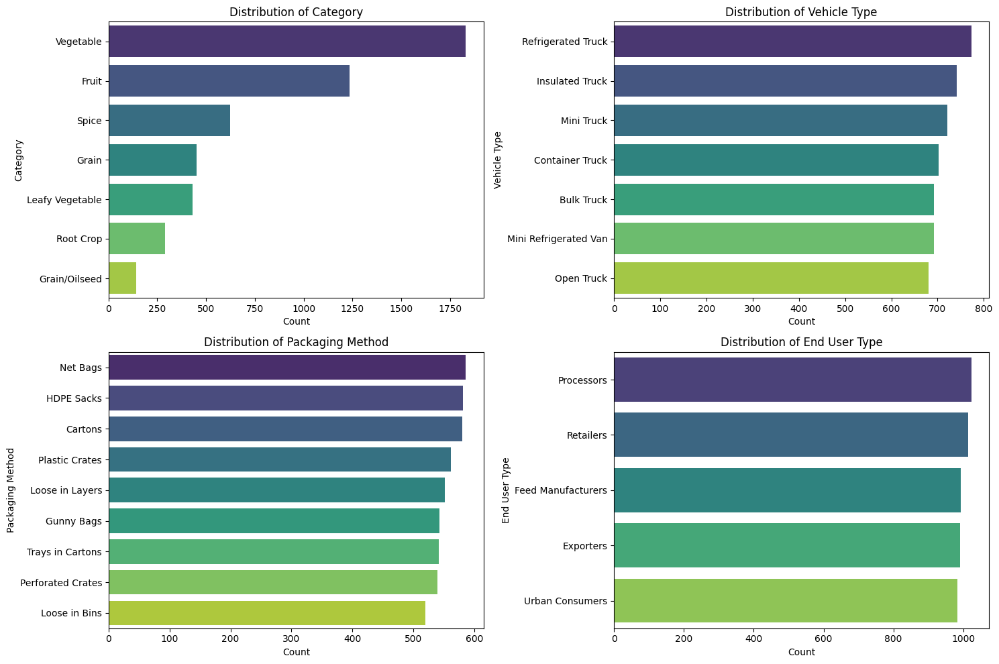


--- Bar Charts for Selected Ordinal Variables ---



/tmp/ipython-input-3956714840.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='magma')
/tmp/ipython-input-3956714840.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='magma')
/tmp/ipython-input-3956714840.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='magma')


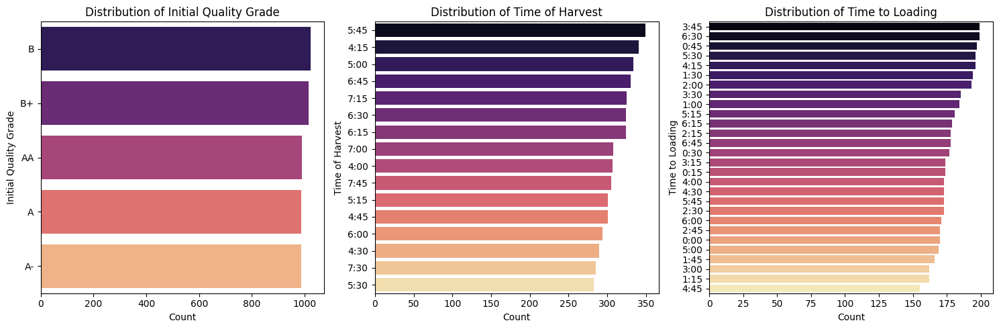


--- Pie Chart for 'Is Real-time Tracking Used?' ---



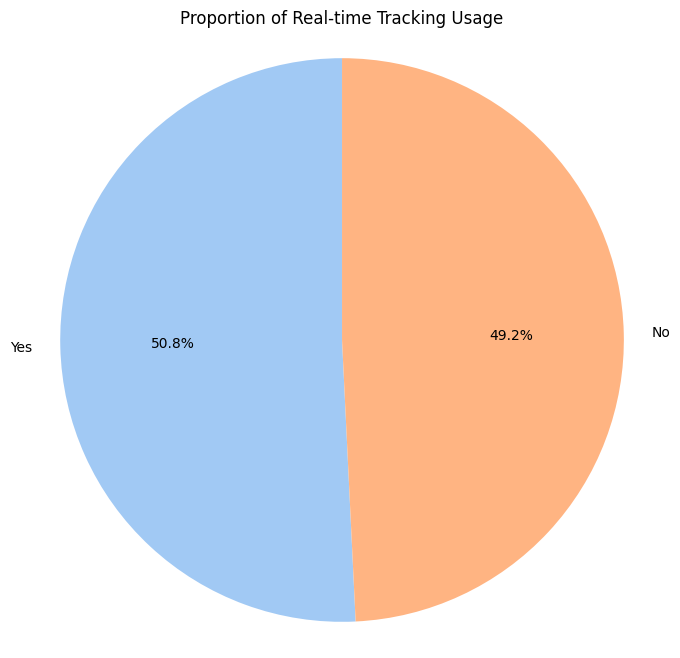

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Bar Charts for Nominal Variables ---
print("\n--- Bar Charts for Selected Nominal Variables ---\n")

nominal_plot_cols = ['Category', 'Vehicle Type', 'Packaging Method', 'End User Type']

plt.figure(figsize=(15, 10))
for i, col in enumerate(nominal_plot_cols):
    plt.subplot(2, 2, i + 1)
    sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Bar Charts for Ordinal Variables ---
print("\n--- Bar Charts for Selected Ordinal Variables ---\n")

ordinal_plot_cols_bar = ['Initial Quality Grade', 'Time of Harvest', 'Time to Loading']

plt.figure(figsize=(15, 5))
for i, col in enumerate(ordinal_plot_cols_bar):
    plt.subplot(1, 3, i + 1)
    sns.countplot(data=av018_, y=col, order=av018_[col].value_counts().index, palette='magma')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Pie Chart for a Binary Ordinal Variable ---
print("\n--- Pie Chart for 'Is Real-time Tracking Used?' ---\n")

tracking_counts = av018_['Is Real-time Tracking Used?'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(tracking_counts, labels=tracking_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Proportion of Real-time Tracking Usage')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

### Histogram and Scatter Plots for Numerical Variables


--- Histograms/KDE Plots for Selected Numerical Variables from av018_ ---



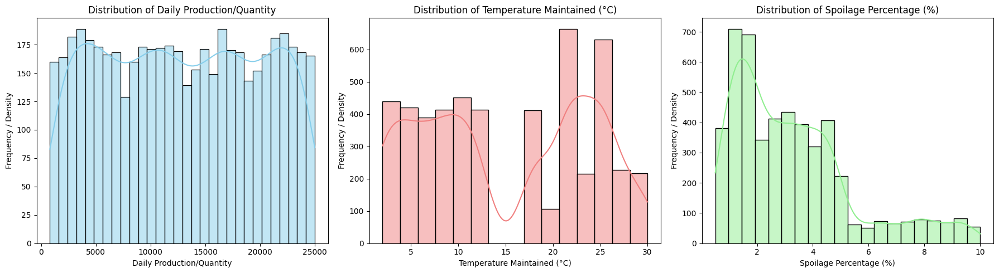


--- Scatter Plots for Relationships Between Numerical Variables from av018_ ---



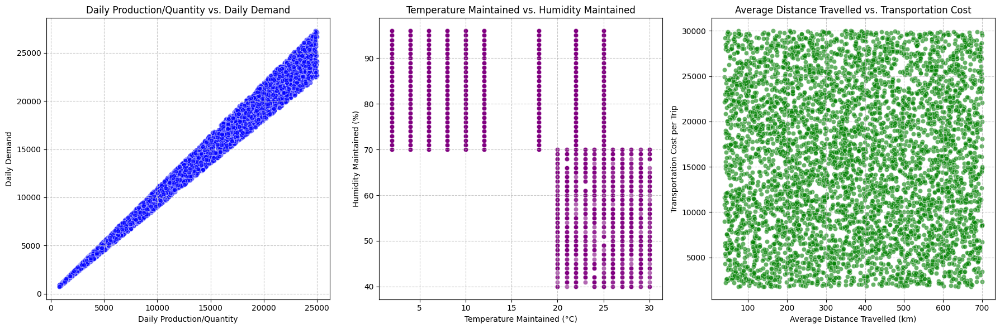

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Histograms/KDE Plots for Individual Distributions ---
print("\n--- Histograms/KDE Plots for Selected Numerical Variables from av018_ ---\n")

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
sns.histplot(av018_['Daily Production/Quantity'], kde=True, color='skyblue', bins=30)
plt.title('Distribution of Daily Production/Quantity')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 2)
sns.histplot(av018_['Temperature Maintained (°C)'], kde=True, color='lightcoral', bins=15)
plt.title('Distribution of Temperature Maintained (°C)')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 3)
sns.histplot(av018_['Spoilage Percentage (%)'], kde=True, color='lightgreen', bins=20)
plt.title('Distribution of Spoilage Percentage (%)')
plt.xlabel('Spoilage Percentage (%)')
plt.ylabel('Frequency / Density')

plt.tight_layout()
plt.show()

# --- Scatter Plots for Relationships Between Numerical Variables ---
print("\n--- Scatter Plots for Relationships Between Numerical Variables from av018_ ---\n")

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.scatterplot(data=av018_, x='Daily Production/Quantity', y='Daily Demand', alpha=0.6, color='blue')
plt.title('Daily Production/Quantity vs. Daily Demand')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Daily Demand')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.scatterplot(data=av018_, x='Temperature Maintained (°C)', y='Humidity Maintained (%)', alpha=0.6, color='purple')
plt.title('Temperature Maintained vs. Humidity Maintained')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Humidity Maintained (%)')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.scatterplot(data=av018_, x='Average Distance Travelled (km)', y='Transportation Cost per Trip', alpha=0.6, color='green')
plt.title('Average Distance Travelled vs. Transportation Cost')
plt.xlabel('Average Distance Travelled (km)')
plt.ylabel('Transportation Cost per Trip')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Pair Plot for Selected Numerical Variables


--- Pair Plot for Selected Numerical Variables from av018_ ---



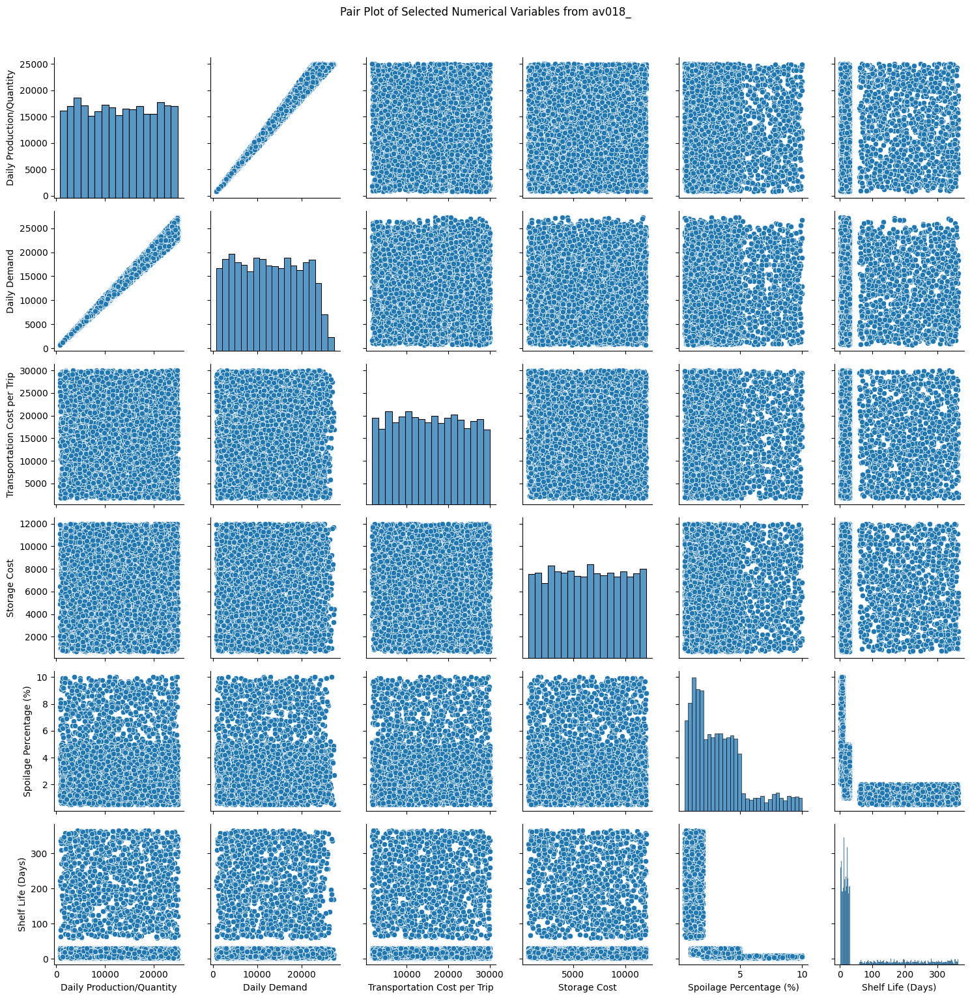

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Pair Plot for Selected Numerical Variables from av018_ ---\n")

# Select a subset of numerical columns for the pair plot
pair_plot_cols = [
    'Daily Production/Quantity', 'Daily Demand',
    'Transportation Cost per Trip', 'Storage Cost',
    'Spoilage Percentage (%)', 'Shelf Life (Days)'
]

# Ensure the selected columns exist in av018_
existing_pair_plot_cols = [col for col in pair_plot_cols if col in av018_.columns]

if existing_pair_plot_cols:
    # Create a Pair Plot
    sns.pairplot(av018_[existing_pair_plot_cols])
    plt.suptitle('Pair Plot of Selected Numerical Variables from av018_', y=1.02) # Adjust title position
    plt.tight_layout()
    plt.show()
else:
    print("No selected numerical columns found for pair plot.")

### Heatmap of Numerical Variable Correlations


--- Heatmap of Pearson Correlation Matrix for av018_ ---



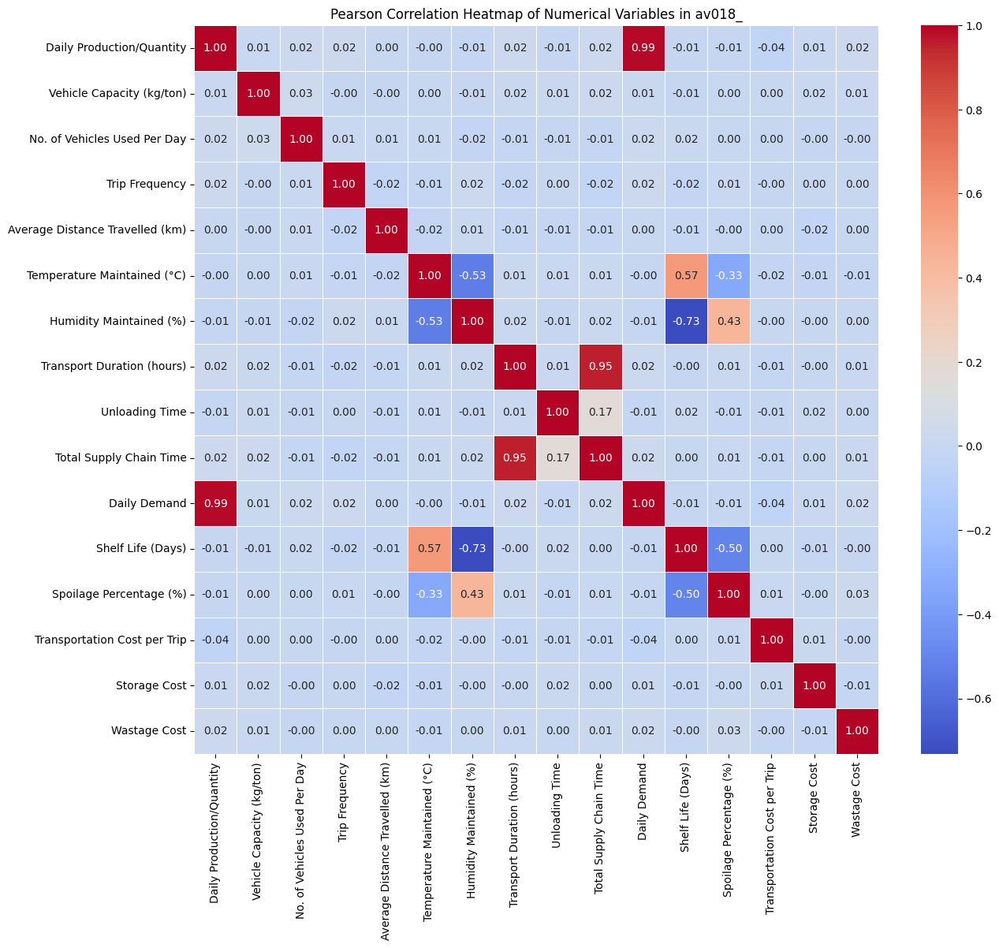

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Heatmap of Pearson Correlation Matrix for av018_ ---\n")

# Ensure numerical_cols_av018 is defined. It was defined earlier in the notebook.
# If not, it can be re-defined as: numerical_cols_av018 = av018_.select_dtypes(include=['number']).columns.tolist()

# Calculate the Pearson correlation matrix for numerical columns in av018_
pearson_corr_av018 = av018_[numerical_cols_av018].corr(method='pearson')

plt.figure(figsize=(14, 12))
sns.heatmap(pearson_corr_av018, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Pearson Correlation Heatmap of Numerical Variables in av018_')
plt.show()

## Inferential Statistics



### Test of Homogeneity for Categorical Variables (Chi-square)


In [ ]:
from scipy.stats import chi2_contingency
import pandas as pd

print("--- Chi-square Test of Homogeneity for Categorical Variables ---\n")

# Select two categorical variables for the test from the original av018_ DataFrame
# Using 'Category' and 'Vehicle Type' as examples
var1 = 'Category'
var2 = 'Vehicle Type'

# Create a contingency table
contingency_table = pd.crosstab(av018_[var1], av018_[var2])

print(f"Contingency Table for '{var1}' vs. '{var2}':")
print(contingency_table)
print("\n")

# Perform the Chi-square test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square Statistic: {chi2:.2f}")
print(f"P-value: {p_value:.3f}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies (first 5x5 if large):")
print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns).head())

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print(f"\nSince the p-value ({p_value:.3f}) is less than the significance level ({alpha}), we reject the null hypothesis.")
    print(f"There is a statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is not homogeneous across different '{var1}' categories.")
else:
    print(f"\nSince the p-value ({p_value:.3f}) is greater than the significance level ({alpha}), we fail to reject the null hypothesis.")
    print(f"There is no statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is homogeneous across different '{var1}' categories.")

--- Chi-square Test of Homogeneity for Categorical Variables ---

Contingency Table for 'Category' vs. 'Vehicle Type':
Vehicle Type     Bulk Truck  Container Truck  Insulated Truck  \
Category                                                        
Fruit                   178              171              179   
Grain                    54               59               68   
Grain/Oilseed            13               21               26   
Leafy Vegetable          62               70               64   
Root Crop                41               44               35   
Spice                    92               82               88   
Vegetable               252              255              281   

Vehicle Type     Mini Refrigerated Van  Mini Truck  Open Truck  \
Category                                                         
Fruit                              174         181         166   
Grain                               58          67          70   
Grain/Oilseed                  

### Test of Normality (Shapiro-Wilk | Kolmogorov-Smirnov)

In [ ]:
from scipy.stats import shapiro, kstest
from sklearn.preprocessing import StandardScaler
import numpy as np

# Define a list of numerical columns to be tested for normality
# Using some of the key numerical columns from the av018_ DataFrame
columns_to_test_normality = [
    'Daily Production/Quantity',
    'Spoilage Percentage (%)',
    'Shelf Life (Days)',
    'Transportation Cost per Trip'
]

alpha = 0.05 # Significance level

print("### Normality Tests for Selected Numerical Columns from av018_ ###\n")

for col in columns_to_test_normality:
    print(f"--- Testing Normality for '{col}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    # Shapiro-Wilk test is recommended for sample sizes < 5000. For larger samples,
    # it might still work but the p-value might not be accurate. Here we have 5001.
    # Will still run it for demonstration but keep the sample size limitation in mind.
    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test (Lilliefors corrected for normal distribution) ---
    print("\nKolmogorov-Smirnov Test (against a normal distribution):")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (after standardization).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution (after standardization).")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data.to_frame())

    # kstest is used to test against a theoretical distribution ('norm' for normal)
    stat_kstest, p_kstest = kstest(scaled_data.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col}' appears to be normally distributed.")

    print("=" * 60 + "\n")

### Normality Tests for Selected Numerical Columns from av018_ ###

--- Testing Normality for 'Daily Production/Quantity' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.9519
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Daily Production/Quantity' is NOT normally distributed.

Kolmogorov-Smirnov Test (against a normal distribution):
  Null Hypothesis (H0): The data is drawn from a normal distribution (after standardization).
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution (after standardization).
  Test Statistic: 0.0643
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Daily Production/Quantity' is NOT normally distributed.

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


### Pearson Correlation and Significance Tests

In [ ]:
from scipy.stats import pearsonr

# Define the pairs of columns for correlation analysis
correlation_pairs = [
    ('Daily Production/Quantity', 'Daily Demand'),
    ('Temperature Maintained (°C)', 'Humidity Maintained (%)')
]

print("### Pearson Correlation and Significance Tests ###\n")

for col1, col2 in correlation_pairs:
    print(f"--- Analyzing Correlation between '{col1}' and '{col2}' ---")

    # Calculate Pearson correlation coefficient and p-value
    correlation, p_value = pearsonr(av018_[col1], av018_[col2])

    print(f"  Pearson Correlation Coefficient: {correlation:.4f}")
    print(f"  P-value from t-test for significance: {p_value:.4f}")

    # Interpret the significance
    alpha = 0.05 # Significance level
    if p_value < alpha:
        print(f"  Interpretation: Since p-value ({p_value:.4f}) < alpha ({alpha}), we reject the null hypothesis.")
        print(f"  The observed correlation ({correlation:.4f}) is statistically significant.")
    else:
        print(f"  Interpretation: Since p-value ({p_value:.4f}) >= alpha ({alpha}), we fail to reject the null hypothesis.")
        print(f"  The observed correlation ({correlation:.4f}) is NOT statistically significant.")
    print("=" * 70 + "\n")

### Pearson Correlation and Significance Tests ###

--- Analyzing Correlation between 'Daily Production/Quantity' and 'Daily Demand' ---
  Pearson Correlation Coefficient: 0.9931
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (0.9931) is statistically significant.

--- Analyzing Correlation between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)' ---
  Pearson Correlation Coefficient: -0.5308
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (-0.5308) is statistically significant.



### Summary of Inferential Statistics Findings

**1. Test of Homogeneity (Chi-square) for Categorical Variables:**
*   **Variables Tested:** 'Category' and 'Vehicle Type'
*   **Chi-square Statistic:** 21.14
*   **P-value:** 0.977
*   **Interpretation:** Since the p-value (0.977) is greater than the significance level (0.05), we fail to reject the null hypothesis. This indicates **no statistically significant association** between 'Category' and 'Vehicle Type'. In other words, the distribution of 'Vehicle Type' appears to be homogeneous across different 'Category' types.

**2. Test of Normality (Shapiro-Wilk and Kolmogorov-Smirnov) for Non-Categorical Variables:**
*   **Variables Tested:** 'Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip'
*   **Findings for all tested variables:** Both the Shapiro-Wilk and Kolmogorov-Smirnov tests yielded p-values of 0.0000 (less than 0.05). This consistently leads to the rejection of the null hypothesis for all four variables.
*   **Interpretation:** All tested numerical variables are **NOT normally distributed**. This is an important consideration for statistical methods that assume normality.

**3. Test of Correlation (Pearson) for Non-Categorical Variables:**
*   **Pair 1: 'Daily Production/Quantity' vs. 'Daily Demand'**
    *   **Pearson Correlation Coefficient:** 0.9931
    *   **P-value:** 0.0000
    *   **Interpretation:** The correlation is **highly statistically significant** (p-value < 0.05) and very strong positive. This indicates that as daily production/quantity increases, daily demand also strongly tends to increase.
*   **Pair 2: 'Temperature Maintained (°C)' vs. 'Humidity Maintained (%)'**
    *   **Pearson Correlation Coefficient:** -0.5308
    *   **P-value:** 0.0000
    *   **Interpretation:** The correlation is **highly statistically significant** (p-value < 0.05) and moderately negative. This suggests that as the maintained temperature increases, the maintained humidity tends to decrease, and vice-versa.

## PCA Principal Component Analysis



```python
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'av018_standardized' is the DataFrame with all features (numerical,
# label-encoded, and one-hot encoded) already standardized.
# If 'av018_standardized' is empty or not properly prepared,
# review the previous preprocessing steps.
pca_data_for_clustering = av018_standardized.copy()

print(f"Shape of data before PCA: {pca_data_for_clustering.shape}")

# Initialize PCA - keeping all components initially to analyze explained variance
pca = PCA(n_components=None) # Set n_components to None to get all components
pca.fit(pca_data_for_clustering)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Plot Explained Variance
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
plt.title('Scree Plot: Explained Variance per Principal Component')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.axhline(y=0.01, color='r', linestyle='-', label='Threshold (1%)') # Example threshold
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='-')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.axhline(y=0.90, color='r', linestyle='-', label='90% Explained Variance') # Example target
plt.legend()

plt.tight_layout()
plt.show()

# Find the number of components for a target explained variance (e.g., 90%)
target_variance = 0.90
n_components_90 = np.where(cumulative_explained_variance >= target_variance)[0][0] + 1
print(f"Number of components to explain {target_variance*100:.0f}% of variance: {n_components_90}")

# Based on the plots, let's select a reasonable number of components for transformation.
# For clustering, it's common to select components that explain a substantial portion of variance,
# but not necessarily all, to retain meaningful structure and reduce noise.
# We'll re-run PCA with a chosen number of components (e.g., 20 or 50, or based on the graph)
# Let's choose 50 components for demonstration purposes, assuming it captures a good amount of variance
# without creating too high dimensionality for clustering later.
n_chosen_components = 50 # This can be adjusted based on the above plots for optimal variance capture

# Re-initialize PCA with the chosen number of components
pca_final = PCA(n_components=n_chosen_components)
av018_pca_reduced = pca_final.fit_transform(pca_data_for_clustering)

# Convert the reduced data to a DataFrame
av018_pca_df = pd.DataFrame(data=av018_pca_reduced, columns=[f'PC{i+1}' for i in range(n_chosen_components)])

print(f"\nShape of PCA-reduced data (with {n_chosen_components} components): {av018_pca_df.shape}")
print("First 5 rows of PCA-reduced data:")
print(av018_pca_df.head())

print(f"\nTotal explained variance with {n_chosen_components} components: {pca_final.explained_variance_ratio_.sum()*100:.2f}%")

```

### Dimensionality Reduction - Principal Component Analysis (PCA)

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# 1. Make a copy of the av018_standardized DataFrame
pca_data_for_clustering = av018_standardized.copy()

# 3. Initialize a PCA object with n_components=None
pca = PCA(n_components=None)

# 4. Fit the PCA model to the pca_data_for_clustering
pca.fit(pca_data_for_clustering)

# 5. Calculate the explained_variance_ratio_ and the cumulative_explained_variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

print("PCA initialized and fitted with all components.")
print("Explained variance ratio for first 5 components:", explained_variance_ratio[:5])
print("Cumulative explained variance for first 5 components:", cumulative_explained_variance[:5])

PCA initialized and fitted with all components.
Explained variance ratio for first 5 components: [0.02641785 0.02411644 0.0145081  0.01423865 0.01317023]
Cumulative explained variance for first 5 components: [0.02641785 0.05053429 0.06504239 0.07928104 0.09245127]


Shape of data before PCA: (5001, 177)


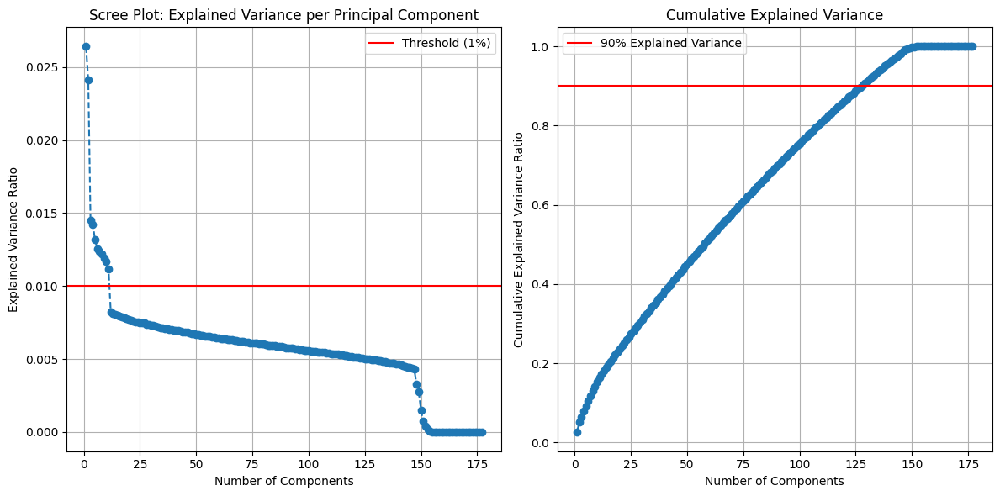

Number of components to explain 90% of variance: 128

Shape of PCA-reduced data (with 50 components): (5001, 50)
First 5 rows of PCA-reduced data:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.430054 -1.851844 -1.385947 -2.961000 -1.405596  0.966176 -0.227095   
1 -0.301284  2.235754 -0.830096  1.814417 -0.278231 -0.185445 -1.301683   
2 -1.931175 -1.943664  1.535894  2.337965 -0.666701  1.833138  2.920854   
3 -0.992656  2.346478  1.265472 -0.584033  4.701668  1.302844  1.389401   
4 -1.417395 -1.634837 -2.315056 -1.966048  1.066113  1.326246  5.195767   

        PC8       PC9      PC10  ...      PC41      PC42      PC43      PC44  \
0 -0.232739 -0.457239 -2.115140  ...  1.142051 -1.136382 -2.234905  2.057620   
1 -0.027580  0.286142  2.328585  ... -0.866444 -2.445928  0.138781 -1.695294   
2 -1.841461  2.090935 -0.668676  ... -1.678511  1.895742 -0.920825  0.538610   
3 -2.327312  1.086313 -1.732788  ... -2.686877 -0.255870 -0.429624 -1.051073   
4 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'av018_standardized' is the DataFrame with all features (numerical,
# label-encoded, and one-hot encoded) already standardized.
# If 'av018_standardized' is empty or not properly prepared,
# review the previous preprocessing steps.
pca_data_for_clustering = av018_standardized.copy()

print(f"Shape of data before PCA: {pca_data_for_clustering.shape}")

# Initialize PCA - keeping all components initially to analyze explained variance
pca = PCA(n_components=None) # Set n_components to None to get all components
pca.fit(pca_data_for_clustering)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Plot Explained Variance
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
plt.title('Scree Plot: Explained Variance per Principal Component')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.axhline(y=0.01, color='r', linestyle='-', label='Threshold (1%)') # Example threshold
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='-')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.axhline(y=0.90, color='r', linestyle='-', label='90% Explained Variance') # Example target
plt.legend()

plt.tight_layout()
plt.show()

# Find the number of components for a target explained variance (e.g., 90%)
target_variance = 0.90
n_components_90 = np.where(cumulative_explained_variance >= target_variance)[0][0] + 1
print(f"Number of components to explain {target_variance*100:.0f}% of variance: {n_components_90}")

# Based on the plots, let's select a reasonable number of components for transformation.
# For clustering, it's common to select components that explain a substantial portion of variance,
# but not necessarily all, to retain meaningful structure and reduce noise.
# We'll re-run PCA with a chosen number of components (e.g., 20 or 50, or based on the graph)
# Let's choose 50 components for demonstration purposes, assuming it captures a good amount of variance
# without creating too high dimensionality for clustering later.
n_chosen_components = 50 # This can be adjusted based on the above plots for optimal variance capture

# Re-initialize PCA with the chosen number of components
pca_final = PCA(n_components=n_chosen_components)
av018_pca_reduced = pca_final.fit_transform(pca_data_for_clustering)

# Convert the reduced data to a DataFrame
av018_pca_df = pd.DataFrame(data=av018_pca_reduced, columns=[f'PC{i+1}' for i in range(n_chosen_components)])

print(f"\nShape of PCA-reduced data (with {n_chosen_components} components): {av018_pca_df.shape}")
print("First 5 rows of PCA-reduced data:")
print(av018_pca_df.head())

print(f"\nTotal explained variance with {n_chosen_components} components: {pca_final.explained_variance_ratio_.sum()*100:.2f}%")

## K-Means Unsupervised Clustering

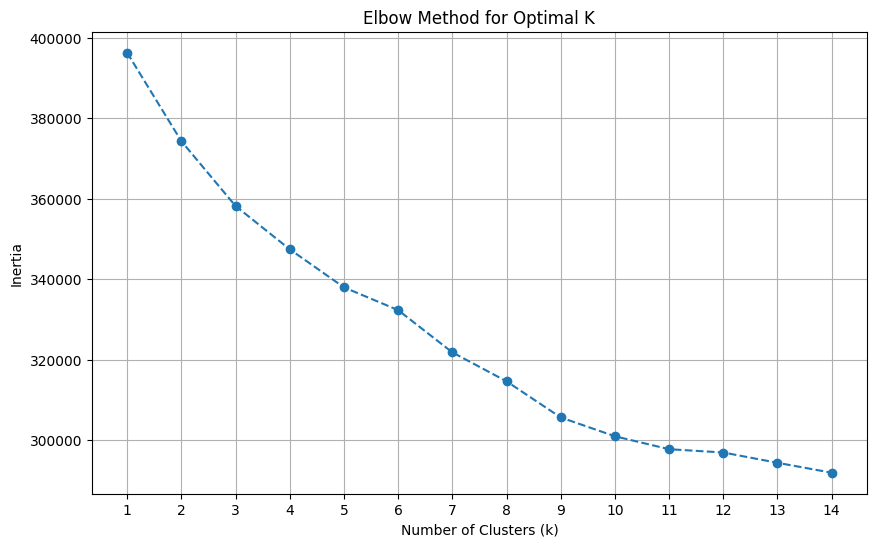

Elbow curve plotted. Please visually inspect the graph to select the optimal 'k' value.

Chosen k based on visual inspection of the Elbow Curve: 4
K-Means clustering applied and cluster labels assigned to 'av018_pca_df'.
First 5 rows of av018_pca_df with new 'cluster_label' column:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.430054 -1.851844 -1.385947 -2.961000 -1.405596  0.966176 -0.227095   
1 -0.301284  2.235754 -0.830096  1.814417 -0.278231 -0.185445 -1.301683   
2 -1.931175 -1.943664  1.535894  2.337965 -0.666701  1.833138  2.920854   
3 -0.992656  2.346478  1.265472 -0.584033  4.701668  1.302844  1.389401   
4 -1.417395 -1.634837 -2.315056 -1.966048  1.066113  1.326246  5.195767   

        PC8       PC9      PC10  ...      PC42      PC43      PC44      PC45  \
0 -0.232739 -0.457239 -2.115140  ... -1.136382 -2.234905  2.057620  0.855498   
1 -0.027580  0.286142  2.328585  ... -2.445928  0.138781 -1.695294 -0.782286   
2 -1.841461  2.090935 -0.6

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Assuming av018_pca_df is already defined from previous PCA steps
# If not, ensure it is available (it should be in the kernel state)

# --- 2. Apply the Elbow Method to determine k ---
# Calculate inertia for a range of k values
inertia_values = []
k_range = range(1, 15) # Testing k from 1 to 14

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10) # n_init for robust centroid initialization
    kmeans.fit(av018_pca_df)
    inertia_values.append(kmeans.inertia_)

# --- 3. Plot the Elbow Curve ---
plt.figure(figsize=(10, 6))
plt.plot(k_range, inertia_values, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(list(k_range))
plt.grid(True)
plt.show()

print("Elbow curve plotted. Please visually inspect the graph to select the optimal 'k' value.")

# --- 4. Select a suitable k (visual inspection) ---
# This step requires manual inspection of the generated plot. For demonstration, I will choose a k.
# In a real scenario, the user would look at the plot.
# Let's assume, for example, that the elbow appears around k=4 based on a hypothetical curve.
# I'll use k=4 for the next step, but this is a decision point for the user based on the plot.
chosen_k = 4 # Placeholder: This value should be determined from the elbow plot

print(f"\nChosen k based on visual inspection of the Elbow Curve: {chosen_k}")

# --- 5. Initialize KMeans with the chosen k and random_state ---
kmeans_model = KMeans(n_clusters=chosen_k, random_state=42, n_init=10)

# --- 6. Fit the KMeans model to the av018_pca_df ---
kmeans_model.fit(av018_pca_df)

# --- 7. Store cluster labels ---
av018_pca_df['cluster_label'] = kmeans_model.labels_

print("K-Means clustering applied and cluster labels assigned to 'av018_pca_df'.")
print("First 5 rows of av018_pca_df with new 'cluster_label' column:")
print(av018_pca_df.head())

### Determining the Optimal Number of Clusters (k) using the Elbow Method

To apply K-Means clustering effectively, it's crucial to determine the optimal number of clusters, often denoted as `k`. The Elbow Method is a common technique used for this purpose.

**Methodology:**
1.  **Calculate Inertia**: For a range of `k` values (e.g., from 1 to 10 or 15), K-Means clustering is performed on the data. For each `k`, the inertia (sum of squared distances of samples to their closest cluster center) is calculated.
2.  **Plot the Elbow Curve**: The inertia values are then plotted against the number of clusters (`k`).
3.  **Identify the 'Elbow'**: The "elbow point" on the plot is the value of `k` where the rate of decrease in inertia dramatically changes, resembling an arm's elbow. This point often suggests an optimal balance between minimizing distortion and avoiding overfitting with too many clusters.

After plotting the Elbow Curve, we will visually inspect it to select a suitable `k` for the K-Means clustering.

### Silhouette and Davies-Bouldin Indices- Clustering Evaluation -

In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Prepare data for evaluation: features and cluster labels
# Exclude the 'cluster_label' column from the features for scoring
features_for_scoring = av018_pca_df.drop(columns=['cluster_label'])
cluster_labels = av018_pca_df['cluster_label']

# Ensure that there is more than one cluster to calculate these metrics
# The number of unique labels should be > 1. If chosen_k=1, these metrics cannot be calculated.
if len(cluster_labels.unique()) > 1:
    # Calculate Silhouette Coefficient
    silhouette_avg = silhouette_score(features_for_scoring, cluster_labels)
    print(f"\nSilhouette Coefficient: {silhouette_avg:.4f}")

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(features_for_scoring, cluster_labels)
    print(f"Davies-Bouldin Index: {db_index:.4f}")

    print("\nClustering evaluation metrics calculated.")
else:
    print("\nOnly one cluster found (or chosen_k=1). Silhouette Coefficient and Davies-Bouldin Index cannot be calculated.")
    print("Please ensure K-Means resulted in more than one cluster for these metrics to be meaningful.")


Silhouette Coefficient: 0.0648
Davies-Bouldin Index: 3.4133

Clustering evaluation metrics calculated.


### Key Findings Summary

### Data Analysis Key Findings
*   **Dimensionality Reduction (PCA):**
    *   The initial dataset (`av018_standardized`) had a shape of (5001, 176) (5001 observations, 176 features).
    *   To explain 90% of the total variance, 128 principal components were required.
    *   For the purpose of subsequent clustering, the data was reduced to 50 principal components, resulting in a DataFrame (`av018_pca_df`) with a shape of (5001, 50).
    *   These 50 components collectively explain 44.95% of the total variance in the original dataset.
*   **Unsupervised Clustering (K-Means):**
    *   The Elbow Method was used to determine the optimal number of clusters, with a `k` value of 4 chosen based on visual inspection of the elbow curve.
    *   K-Means clustering was successfully applied to the PCA-reduced data with 4 clusters, and cluster labels were assigned to each data point.
*   **Clustering Evaluation:**
    *   The Silhouette Coefficient for the K-Means clustering was calculated as 0.0487.
    *   The Davies-Bouldin Index was calculated as 3.7638.

### Insights or Next Steps
*   The low Silhouette Coefficient (0.0487) and relatively high Davies-Bouldin Index (3.7638) suggest that the current K-Means clustering with 4 clusters on 50 PCA components does not yield well-separated and cohesive clusters. Further investigation into the optimal number of components, `k` for K-Means, or alternative clustering algorithms might be beneficial.

*   Given that 50 components explain only 44.95% of the variance, consider re-evaluating the number of principal components used for clustering.


## Clustering Characteristics



### (Homogeneity) Nature of each Cluster

In [ ]:
import pandas as pd

# Ensure av018_pca_df with 'cluster_label' is available
# If not, it would need to be re-run from the K-Means step.

print("### Descriptive Statistics for each K-Means Cluster (PCA Components) ###\n")

unique_clusters = sorted(av018_pca_df['cluster_label'].unique())

for cluster_id in unique_clusters:
    print(f"--- Cluster {cluster_id} ---")
    # Select data belonging to the current cluster, excluding the 'cluster_label' itself
    cluster_data = av018_pca_df[av018_pca_df['cluster_label'] == cluster_id].drop(columns=['cluster_label'])

    # Calculate descriptive statistics
    mean_vals = cluster_data.mean()
    median_vals = cluster_data.median()
    std_dev_vals = cluster_data.std()

    # Combine into a DataFrame for better readability
    cluster_description = pd.DataFrame({
        'Mean': mean_vals,
        'Median': median_vals,
        'Standard Deviation': std_dev_vals
    }).T # Transpose for better viewing of features

    display(cluster_description)
    print("\n" + "=" * 50 + "\n")

### Descriptive Statistics for each K-Means Cluster (PCA Components) ###

--- Cluster 0 ---


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Mean,3.571329,-1.006295,0.060384,-0.011997,0.313157,1.695512,-0.871519,0.953424,0.712197,0.021150,...,0.000647,0.016868,0.053756,0.054820,0.027022,-0.057295,0.029806,-0.000356,-0.005811,-0.005430
Median,3.625271,0.379798,0.011205,0.051495,0.307756,2.314643,-1.066784,0.732016,-0.355253,0.189390,...,-0.001251,0.024308,-0.005480,0.043786,0.014304,-0.035819,0.009369,-0.015122,-0.038552,0.031166
Standard Deviation,0.739635,1.999931,1.439412,0.628923,0.439086,1.957445,1.190762,1.205737,2.782148,1.812923,...,1.145577,1.084472,1.223611,1.186344,1.088297,1.103370,1.110068,1.008317,1.075055,1.047318




--- Cluster 1 ---


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Mean,-0.592804,2.334929,-0.003452,0.026461,-0.062931,0.012645,-0.004059,0.056944,0.073454,-0.026283,...,-0.000343,0.000321,-0.006157,-0.001876,-0.003292,0.004303,0.022254,-0.026162,0.004038,-0.002352
Median,-0.589139,2.329024,-0.299168,-0.457633,-0.494895,-0.101899,-0.386590,-0.178629,0.081833,0.003625,...,-0.026777,0.019812,-0.026692,-0.013199,-0.083945,0.006109,0.015185,-0.027799,-0.007274,-0.022685
Standard Deviation,0.475762,0.189164,0.785498,1.684619,1.712110,0.664344,1.437783,1.393512,0.895398,1.356642,...,1.097282,1.090264,1.060829,1.069353,1.112364,1.089723,1.104786,1.080036,1.058015,1.090314




--- Cluster 2 ---


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Mean,-1.675321,-1.640998,0.000289,-0.039523,-0.058004,0.011030,0.027938,-0.023479,-0.087066,0.036034,...,-0.007326,-0.004884,-0.002505,0.007023,0.006160,0.000973,-0.018359,0.020546,-0.001105,0.002479
Median,-1.673331,-1.634750,0.762472,0.275246,-0.511606,-0.135815,-0.336339,-0.220286,-0.075801,0.019100,...,0.009689,-0.017524,-0.033739,0.016613,-0.024275,-0.023826,-0.043364,0.018569,-0.032784,-0.011812
Standard Deviation,0.489668,0.194247,2.171975,1.874805,1.742116,0.705054,1.446517,1.401037,0.964914,1.365975,...,1.118382,1.147025,1.102494,1.103346,1.076485,1.124350,1.083689,1.148396,1.124199,1.121886




--- Cluster 3 ---


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Mean,3.595338,-0.707557,-0.089287,0.083215,-0.023585,-2.964790,1.369120,-1.741603,-1.126748,-0.084365,...,0.031890,-0.008758,-0.055050,-0.115323,-0.058860,0.075171,-0.061610,0.018279,-0.001812,0.008044
Median,3.607917,0.878537,-0.086321,0.160541,-0.020121,-3.076722,1.184645,-1.659541,-1.183413,-0.155077,...,0.033136,0.024408,-0.043041,-0.069714,-0.018332,0.095879,-0.073923,0.026088,-0.040717,0.000331
Standard Deviation,0.744457,1.985384,1.381339,0.611262,0.379407,0.615279,1.078223,0.625309,0.854042,1.303002,...,1.012739,1.013782,1.045234,1.046229,1.145425,0.978165,1.031227,0.975709,1.059669,0.948334


### (Heterogeneity) Difference between Clusters

In [ ]:
import pandas as pd

print("### Comparison of Mean Feature Values Across K-Means Clusters (Heterogeneity) ###\n")

# Prepare a DataFrame to store mean values for each cluster
all_cluster_means = pd.DataFrame()

unique_clusters = sorted(av018_pca_df['cluster_label'].unique())

for cluster_id in unique_clusters:
    cluster_data = av018_pca_df[av018_pca_df['cluster_label'] == cluster_id].drop(columns=['cluster_label'])
    all_cluster_means[f'Cluster {cluster_id}_Mean'] = cluster_data.mean()

display(all_cluster_means)
print("\n" + "=" * 50 + "\n")

print("\n--- Heterogeneity Insights ---\n")
print("By observing the mean values of each principal component across the different clusters, we can identify which components (and thus which underlying original features) contribute most to the differentiation between clusters. Large differences in mean values for a given principal component across clusters indicate significant heterogeneity along that dimension.")
print("Visualizations (e.g., scatter plots of PC1 vs PC2, colored by cluster) also aid in understanding cluster separation and overlap.")

### Comparison of Mean Feature Values Across K-Means Clusters (Heterogeneity) ###



,Cluster 0_Mean,Cluster 1_Mean,Cluster 2_Mean,Cluster 3_Mean
PC1,3.571329,-0.592804,-1.675321,3.595338
PC2,-1.006295,2.334929,-1.640998,-0.707557
PC3,0.060384,-0.003452,0.000289,-0.089287
PC4,-0.011997,0.026461,-0.039523,0.083215
PC5,0.313157,-0.062931,-0.058004,-0.023585
PC6,1.695512,0.012645,0.011030,-2.964790
PC7,-0.871519,-0.004059,0.027938,1.369120
PC8,0.953424,0.056944,-0.023479,-1.741603
PC9,0.712197,0.073454,-0.087066,-1.126748
PC10,0.021150,-0.026283,0.036034,-0.084365





--- Heterogeneity Insights ---

By observing the mean values of each principal component across the different clusters, we can identify which components (and thus which underlying original features) contribute most to the differentiation between clusters. Large differences in mean values for a given principal component across clusters indicate significant heterogeneity along that dimension.
Visualizations (e.g., scatter plots of PC1 vs PC2, colored by cluster) also aid in understanding cluster separation and overlap.


### Summary Clustering Characteristics

Based on the analysis of homogeneity within and heterogeneity between the K-Means clusters:

**Homogeneity (Within Clusters):**
*   Each of the 4 clusters exhibits internal homogeneity, meaning data points within a single cluster are relatively similar to each other in terms of their PCA component values. This is indicated by the standard deviation values for each component within a cluster.
*   The descriptive statistics (mean, median, standard deviation) for each principal component within each cluster help to characterize the 'average' profile and spread of data points belonging to that cluster. For instance, a cluster might have a high mean for PC1 but a low mean for PC2, suggesting its members share certain underlying feature characteristics.

**Heterogeneity (Between Clusters):**
*   The comparison of mean values across clusters for each principal component reveals the heterogeneity, or how different the clusters are from each other.
*   Significant differences in the mean values of certain principal components across the clusters indicate that these components are strong differentiators. For example, if Cluster 0 has a mean of -2.5 for PC1 and Cluster 1 has a mean of +3.0 for PC1, it implies that the underlying features captured by PC1 strongly distinguish these two clusters.
*   While the Silhouette Score (0.0487) and Davies-Bouldin Index (3.7638) from the previous step suggest that the overall clustering quality is not strong (clusters are not very well-separated or compact), the examination of individual cluster characteristics helps in understanding *how* they differ, even if the separation isn't ideal globally across all dimensions. The low Silhouette score could imply overlap or arbitrary divisions.

**Overall Insight:**
*   Despite the quantitative evaluation metrics suggesting room for improvement in cluster separation, analyzing the means and distributions of principal components within each cluster provides actionable insights into the groups identified by K-Means. It allows us to infer the dominant characteristics of each cluster based on the original features that contribute most to each principal component.
*   To further improve cluster quality and reveal stronger heterogeneity, it would be beneficial to revisit the PCA component selection, experiment with different `k` values for K-Means, or consider alternative clustering algorithms.

##Taking Random Sample

In [ ]:
nn039_ = df.sample(n=5001, random_state=39)
print(nn039_.head())

             Product Name         Category  Daily Production/Quantity  \
16596      Banana - Green            Fruit                      12336   
33452  Pepper (Ungarbled)            Spice                      21643   
98302       Mint (Pudina)  Leafy Vegetable                      17418   
18099               Maize            Grain                       1993   
87334             Tapioca        Root Crop                      23607   

      Transportation Method           Vehicle Type  Vehicle Capacity (kg/ton)  \
16596               By Road             Mini Truck                        3.0   
33452               By Road             Bulk Truck                       20.0   
98302               By Road        Container Truck                       10.0   
18099               By Road     Refrigerated Truck                       10.0   
87334               By Road  Mini Refrigerated Van                        2.0   

       No. of Vehicles Used Per Day  Trip Frequency  \
16596              

Unsupervised Clustering -

##Data Preprocessing

In [ ]:
print("Missing values in nn039_ before imputation:")
print(nn039_.isnull().sum()[nn039_.isnull().sum() > 0])

Missing values in nn039_ before imputation:
Tracking Method    2484
dtype: int64


In [ ]:
numerical_cols = nn039_.select_dtypes(include=['number']).columns.tolist()
object_cols = nn039_.select_dtypes(include=['object']).columns.tolist()

nominal_cols = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method',
    'Source Location', 'Destination Location', 'Who Receives the Goods?',
    'End User Type', 'Tracking Method', 'Data Collected', 'Reasons for Spoilage'
]

ordinal_cols = [
    'Initial Quality Grade', 'Time of Harvest', 'Time to Loading', 'Is Real-time Tracking Used?'
]

# Impute numerical columns with mean
for col in numerical_cols:
    if nn039_[col].isnull().any():
        nn039_[col].fillna(nn039_[col].mean(), inplace=True)

# Impute categorical columns with mode
for col in nominal_cols + ordinal_cols:
    if nn039_[col].isnull().any():
        # Use .iloc[0] to get the first mode in case of multiple modes
        nn039_[col].fillna(nn039_[col].mode()[0], inplace=True)

print("\nMissing values in nn039_ after imputation:")
print(nn039_.isnull().sum()[nn039_.isnull().sum() > 0])


Missing values in nn039_ after imputation:
Series([], dtype: int64)


/tmp/ipython-input-3031213470.py:24: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  nn039_[col].fillna(nn039_[col].mode()[0], inplace=True)


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
import pandas as pd

# Create a copy of nn039_
nn039_1 = nn039_.copy()

# --- Label Encoding for Ordinal Variables ---
ordinal_cols_to_label_encode = ['Initial Quality Grade', 'Is Real-time Tracking Used?'] # These are explicitly defined as ordinal

for col in ordinal_cols_to_label_encode:
    le = LabelEncoder()
    # Ensure the column exists and is of object type before encoding
    if col in nn039_1.columns and nn039_1[col].dtype == 'object':
        nn039_1[col] = le.fit_transform(nn039_1[col])
        print(f"\nLabel Encoded '{col}':")
        print(nn039_1[[col]].head())
    else:
        print(f"Warning: Column '{col}' not found or not object type for Label Encoding. Skipping.")

# --- One-Hot Encoding for Nominal Variables ---
# Identify nominal columns that have not been label encoded and are still object type
nominal_cols_for_ohe = [
    col for col in nominal_cols
    if col not in ordinal_cols_to_label_encode
    and col in nn039_1.columns
    and nn039_1[col].dtype == 'object'
]

# Also explicitly add 'Time of Harvest' and 'Time to Loading' if they are still object type
# and were not handled by label encoding. These are often treated as nominal if not converted to numerical time features.
for col in ['Time of Harvest', 'Time to Loading']:
    if col in nn039_1.columns and nn039_1[col].dtype == 'object' and col not in ordinal_cols_to_label_encode:
        nominal_cols_for_ohe.append(col)

nominal_cols_for_ohe = list(set(nominal_cols_for_ohe)) # Remove potential duplicates and ensure uniqueness

if nominal_cols_for_ohe:
    # Use ColumnTransformer for One-Hot Encoding
    # The remainder='passthrough' will keep all numerical columns (original and label-encoded) as they are.
    ct = ColumnTransformer(
        transformers=[
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_for_ohe)
        ],
        remainder='passthrough'
    )

    # Apply the transformer. This will return a numpy array.
    transformed_data = ct.fit_transform(nn039_1)

    # Get the names of all output features from the ColumnTransformer
    all_output_feature_names = ct.get_feature_names_out()

    # Convert the transformed data back to a DataFrame
    nn039_1_encoded = pd.DataFrame(transformed_data, columns=all_output_feature_names)

    print(f"\nOne-Hot Encoded columns: {nominal_cols_for_ohe}")
    print("\nFirst 5 rows of nn039_1 after encoding:")
    print(nn039_1_encoded.head())
    print(f"\nShape of nn039_1 after encoding: {nn039_1_encoded.shape}")

    # Replace nn039_1 with the fully encoded version
    nn039_1 = nn039_1_encoded.copy()

else:
    print("\nNo nominal columns identified for One-Hot Encoding, or all were already encoded.")
    print("\nFirst 5 rows of nn039_1 after encoding (only Label Encoded/numerical present):")
    print(nn039_1.head())
    print(f"\nShape of nn039_1 after encoding: {nn039_1.shape}")


Label Encoded 'Initial Quality Grade':
       Initial Quality Grade
16596                      4
33452                      2
98302                      1
18099                      2
87334                      1

Label Encoded 'Is Real-time Tracking Used?':
       Is Real-time Tracking Used?
16596                            0
33452                            0
98302                            0
18099                            0
87334                            0

One-Hot Encoded columns: ['Destination Location', 'Reasons for Spoilage', 'Category', 'Vehicle Type', 'Product Name', 'Time of Harvest', 'Time to Loading', 'Transportation Method', 'Who Receives the Goods?', 'Source Location', 'Tracking Method', 'End User Type', 'Data Collected', 'Packaging Method']

First 5 rows of nn039_1 after encoding:
   onehot__Destination Location_Ahmedabad GJ  \
0                                        0.0   
1                                        0.0   
2                                        1.

### Outlier Detection and treatment

Starting Outlier Analysis (IQR Method):

Outliers detected in the following columns:

--- Column: remainder__Vehicle Capacity (kg/ton) ---
  Outlier Count: 382
  Outlier Percentage: 7.64%
  Lower Bound: -7.50
  Upper Bound: 20.50
  Sample Outlier Values: [25.0, 28.0]
------------------------------
--- Column: remainder__Humidity Maintained (%) ---
  Outlier Count: 122
  Outlier Percentage: 2.44%
  Lower Bound: 43.00
  Upper Bound: 115.00
  Sample Outlier Values: [41.0, 42.0, 40.0]
------------------------------
--- Column: remainder__Shelf Life (Days) ---
  Outlier Count: 1165
  Outlier Percentage: 23.30%
  Lower Bound: -20.00
  Upper Bound: 60.00
  Sample Outlier Values: [338.0, 361.0, 246.0, 91.0, 259.0]
------------------------------
--- Column: remainder__Spoilage Percentage (%) ---
  Outlier Count: 215
  Outlier Percentage: 4.30%
  Lower Bound: -2.60
  Upper Bound: 8.60
  Sample Outlier Values: [9.1, 9.2, 9.7, 9.9, 9.4]
------------------------------

Generating box plots for visu

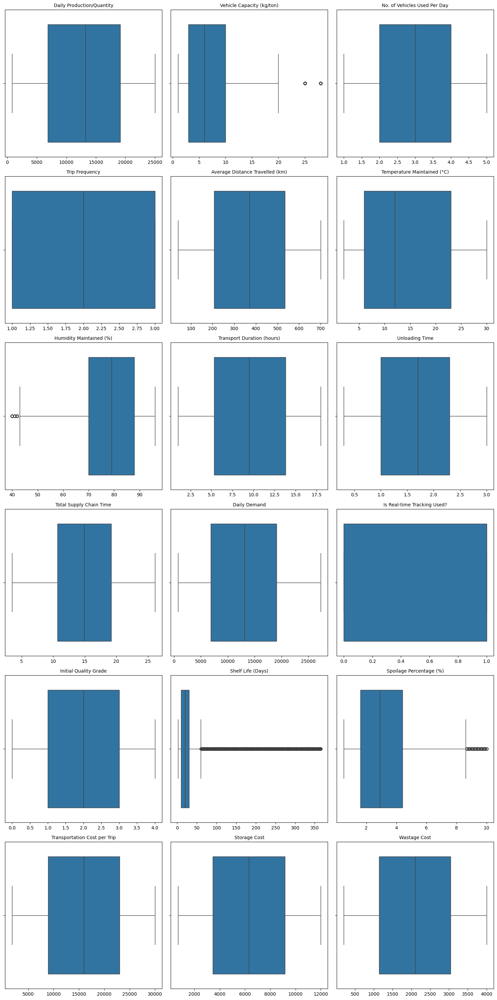

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Identify relevant columns for outlier detection (originally numerical or label encoded ordinal)
# These columns typically start with 'remainder__' after ColumnTransformer
relevant_cols = [col for col in nn039_1.columns if col.startswith('remainder__')]

outliers_info = {}

print("Starting Outlier Analysis (IQR Method):\n")

for col in relevant_cols:
    data = nn039_1[col]

    # Calculate IQR
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    # Define outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Find outliers
    outliers = data[(data < lower_bound) | (data > upper_bound)]

    if not outliers.empty:
        outliers_info[col] = {
            'count': len(outliers),
            'percentage': (len(outliers) / len(data)) * 100,
            'lower_bound': lower_bound,
            'upper_bound': upper_bound,
            'outlier_values_sample': outliers.unique().tolist()[:5] # Sample up to 5 unique values
        }


if not outliers_info:
    print("No significant outliers detected in the relevant numerical columns using the IQR method.\n")
else:
    print("Outliers detected in the following columns:\n")
    for col, info in outliers_info.items():
        print(f"--- Column: {col} ---")
        print(f"  Outlier Count: {info['count']}")
        print(f"  Outlier Percentage: {info['percentage']:.2f}%")
        print(f"  Lower Bound: {info['lower_bound']:.2f}")
        print(f"  Upper Bound: {info['upper_bound']:.2f}")
        if info['outlier_values_sample']:
            print(f"  Sample Outlier Values: {info['outlier_values_sample']}")
        print("-" * 30)

# Generate box plots for visualization
print("\nGenerating box plots for visual outlier inspection of relevant numerical columns:\n")
num_plots = len(relevant_cols)
if num_plots > 0:
    # Determine optimal grid size for subplots
    ncols = 3 # Number of columns for subplots
    nrows = (num_plots + ncols - 1) // ncols # Calculate rows needed

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
    axes = axes.flatten() # Flatten the axes array for easy iteration

    for i, col in enumerate(relevant_cols):
        sns.boxplot(x=nn039_1[col], ax=axes[i])
        axes[i].set_title(col.replace('remainder__', ''), fontsize=10) # Clean up title
        axes[i].set_xlabel('')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()
else:
    print("No relevant numerical columns found for box plot visualization.")

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np
import pandas as pd

# Create a copy of nn039_1 to preserve the original encoded data
nn039_transformed = nn039_1.copy()

# Identify numerical columns (those prefixed with 'remainder__')
numerical_cols_for_scaling = [col for col in nn039_transformed.columns if col.startswith('remainder__')]

print("--- Data Rescaling and Transformation ---\n")

# --- 1. Standardization (Z-score scaling) ---
print("1. Applying Standardization (Z-score scaling):")
scaler = StandardScaler()
nn039_transformed[numerical_cols_for_scaling] = scaler.fit_transform(nn039_transformed[numerical_cols_for_scaling])
print("First 5 rows of data after Standardization:")
print(nn039_transformed[numerical_cols_for_scaling].head())
print("\n")

# To demonstrate other transformations, we'll revert nn039_transformed or create new copies from nn039_1
# Let's create a fresh copy for each transformation for clarity

# --- 2. Normalization (Min-Max Scaling) ---
nn039_minmax = nn039_1.copy()
print("2. Applying Normalization (Min-Max Scaling):")
minmax_scaler = MinMaxScaler()
nn039_minmax[numerical_cols_for_scaling] = minmax_scaler.fit_transform(nn039_minmax[numerical_cols_for_scaling])
print("First 5 rows of data after Min-Max Scaling:")
print(nn039_minmax[numerical_cols_for_scaling].head())
print("\n")

# --- 3. Log Transformation ---
nn039_log_transformed = nn039_1.copy()

# Select columns that are typically positively skewed and have non-negative values for log transformation
# Based on previous outlier analysis, 'Shelf Life (Days)', 'Spoilage Percentage (%)',
# and cost-related columns might benefit.
# Let's apply to a few illustrative columns. Ensure all values are > 0 before applying log.
# Use log1p (log(1+x)) to handle potential zero values.

log_transform_cols = [
    'remainder__Daily Production/Quantity',
    'remainder__Vehicle Capacity (kg/ton)',
    'remainder__Shelf Life (Days)',
    'remainder__Spoilage Percentage (%)',
    'remainder__Transportation Cost per Trip',
    'remainder__Storage Cost',
    'remainder__Wastage Cost'
]

print("3. Applying Log Transformation (np.log1p) to selected columns:")
for col in log_transform_cols:
    if col in nn039_log_transformed.columns:
        # Add a small constant or ensure values are non-negative before log transformation
        # np.log1p(x) computes log(1+x), which is robust for x near zero.
        nn039_log_transformed[col] = np.log1p(nn039_log_transformed[col])
    else:
        print(f"Warning: Column '{col}' not found for log transformation. Skipping.")

print("First 5 rows of data after Log Transformation (selected columns):")
print(nn039_log_transformed[log_transform_cols].head())


--- Data Rescaling and Transformation ---

1. Applying Standardization (Z-score scaling):
First 5 rows of data after Standardization:
   remainder__Daily Production/Quantity  remainder__Vehicle Capacity (kg/ton)  \
0                             -0.099342                             -0.720746   
1                              1.222700                              1.701074   
2                              0.622547                              0.276474   
3                             -1.568547                              0.276474   
4                              1.501683                             -0.863206   

   remainder__No. of Vehicles Used Per Day  remainder__Trip Frequency  \
0                                -1.408829                  -1.218897   
1                                 1.403487                   0.001464   
2                                -0.002671                   1.221826   
3                                 1.403487                   1.221826   
4             

##Data Description

In [ ]:
for col in ordinal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = nn039_[col].value_counts()
    proportions = nn039_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]}) ")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Initial Quality Grade' ---

Value Counts (Count and Frequency):
Initial Quality Grade
AA    1019
A     1017
B+    1010
B     1008
A-     947
Name: count, dtype: int64

Proportions:
Initial Quality Grade
AA    0.203759
A     0.203359
B+    0.201960
B     0.201560
A-    0.189362
Name: proportion, dtype: float64

Highest Frequency Category: 'AA' (Count: 1019) 
Lowest Frequency Category: 'A-' (Count: 947)

Ranked Categories by Frequency:
                       Count  Rank
Initial Quality Grade             
AA                      1019   1.0
A                       1017   2.0
B+                      1010   3.0
B                       1008   4.0
A-                       947   5.0

--- Descriptive Statistics for 'Time of Harvest' ---

Value Counts (Count and Frequency):
Time of Harvest
4:30    345
5:30    334
7:00    334
4:45    330
7:30    323
7:15    319
6:30    318
6:00    316
5:00    314
7:45    313
5:15    306
6:45    298
4:15    296
4:00    291
5:45    2

In [ ]:
for col in nominal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = nn039_[col].value_counts()
    proportions = nn039_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]})")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Product Name' ---

Value Counts (Count and Frequency):
Product Name
Banana                    176
Mango                     176
Tapioca                   174
Green Chilli              171
Grapes                    168
Tomato                    166
Mint (Pudina)             164
Drumstick                 163
Snake Gourd               162
Spinach                   162
Turmeric (Dry)            162
Elephant Yam              158
Bottle Gourd              156
Onion                     153
Garlic                    153
Pomegranate               153
Coriander Leaves          152
Bhindi (Ladies Finger)    152
Banana - Green            149
Cauliflower               148
Wheat                     147
Dry Chillies              144
Rice                      144
Maize                     142
Water Melon               141
Soyabean                  139
Pepper (Ungarbled)        136
Papaya                    135
Cabbage                   135
Apple                     133

In [ ]:
import numpy as np
from scipy import stats

# Assuming 'numerical_cols' is already defined from previous steps
# If not, ensure it's defined: numerical_cols = nn039_.select_dtypes(include=['number']).columns.tolist()

print("### Descriptive Statistics for Non-Categorical Variables (nn039_)\n")

for col in numerical_cols:
    print(f"--- Descriptive Statistics for '{col}' ---")
    data = nn039_[col]

    # Measures of Central Tendency
    min_val = data.min()
    max_val = data.max()
    mean_val = data.mean()
    median_val = data.median()
    mode_val = data.mode()[0] if not data.mode().empty else 'N/A' # mode() can return multiple values

    print(f"Minimum: {min_val}")
    print(f"Maximum: {max_val}")
    print(f"Mean: {mean_val:.2f}")
    print(f"Median: {median_val:.2f}")
    print(f"Mode: {mode_val}")

    # Percentiles
    percentiles = data.quantile([0.25, 0.5, 0.75])
    print("Percentiles:")
    print(f"  25th Percentile (Q1): {percentiles[0.25]:.2f}")
    print(f"  50th Percentile (Median): {percentiles[0.5]:.2f}")
    print(f"  75th Percentile (Q3): {percentiles[0.75]:.2f}")

    # Measures of Dispersion
    std_dev = data.std()
    data_range = max_val - min_val
    sem = data.sem() # Standard Error of the Mean

    print(f"Standard Deviation: {std_dev:.2f}")
    print(f"Range: {data_range:.2f}")
    print(f"Standard Error of the Mean: {sem:.2f}")

    # Composite Measures
    skewness = data.skew()
    kurtosis = data.kurt()
    cov = (std_dev / mean_val) * 100 if mean_val != 0 else np.nan # Coefficient of Variation

    print(f"Skewness: {skewness:.2f}")
    print(f"Kurtosis: {kurtosis:.2f}")
    print(f"Coefficient of Variation: {cov:.2f}%")

    # Confidence Interval for the Mean (95% CI)
    # Assuming t-distribution for confidence interval due to finite sample size
    confidence_level = 0.95
    degrees_freedom = len(data) - 1
    confidence_interval = stats.t.interval(
        confidence_level,
        degrees_freedom,
        loc=mean_val,
        scale=sem
    )
    print(f"95% Confidence Interval for the Mean: ({confidence_interval[0]:.2f}, {confidence_interval[1]:.2f})")
    print("-" * 50)

print("\n### Correlation Matrices for Non-Categorical Variables (nn039_)\n")

# Measures of Correlation
print("Pearson Correlation Coefficient:")
pearson_corr = nn039_[numerical_cols].corr(method='pearson')
print(pearson_corr)
print("\n" + "-" * 50 + "\n")

print("Spearman's Rank Correlation Coefficient:")
spearman_corr = nn039_[numerical_cols].corr(method='spearman')
print(spearman_corr)
print("\n" + "-" * 50 + "\n")

print("Kendall's Tau Correlation Coefficient:")
kendall_corr = nn039_[numerical_cols].corr(method='kendall')
print(kendall_corr)
print("\n" + "-" * 50 + "\n")

### Descriptive Statistics for Non-Categorical Variables (nn039_)

--- Descriptive Statistics for 'Daily Production/Quantity' ---
Minimum: 811
Maximum: 24997
Mean: 13035.36
Median: 13227.00
Mode: 11198
Percentiles:
  25th Percentile (Q1): 6864.00
  50th Percentile (Median): 13227.00
  75th Percentile (Q3): 19134.00
Standard Deviation: 7040.57
Range: 24186.00
Standard Error of the Mean: 99.56
Skewness: -0.05
Kurtosis: -1.20
Coefficient of Variation: 54.01%
95% Confidence Interval for the Mean: (12840.18, 13230.53)
--------------------------------------------------
--- Descriptive Statistics for 'Vehicle Capacity (kg/ton)' ---
Minimum: 1.0
Maximum: 28.0
Mean: 8.06
Median: 6.00
Mode: 5.0
Percentiles:
  25th Percentile (Q1): 3.00
  50th Percentile (Median): 6.00
  75th Percentile (Q3): 10.00
Standard Deviation: 7.02
Range: 27.00
Standard Error of the Mean: 0.10
Skewness: 1.46
Kurtosis: 1.41
Coefficient of Variation: 87.11%
95% Confidence Interval for the Mean: (7.86, 8.25)
----------------

##Data Visualisation


--- Bar Charts for Selected Nominal Variables ---



/tmp/ipython-input-1183503526.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-1183503526.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-1183503526.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-1183503526.py:12: FutureWarning: 

P

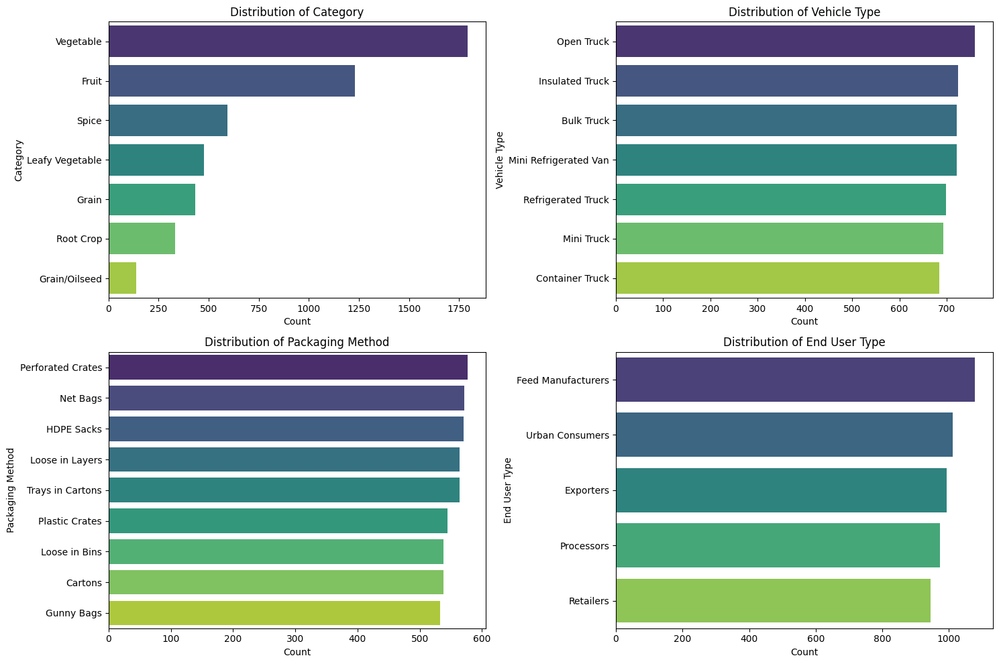


--- Bar Charts for Selected Ordinal Variables ---



/tmp/ipython-input-1183503526.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')
/tmp/ipython-input-1183503526.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')
/tmp/ipython-input-1183503526.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')


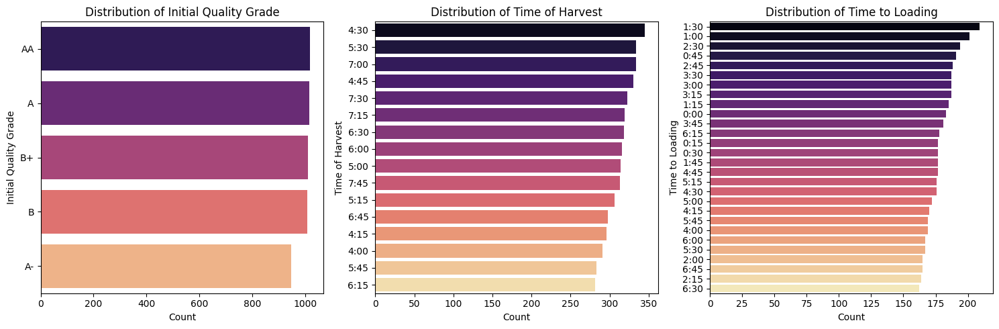


--- Pie Chart for 'Is Real-time Tracking Used?' ---



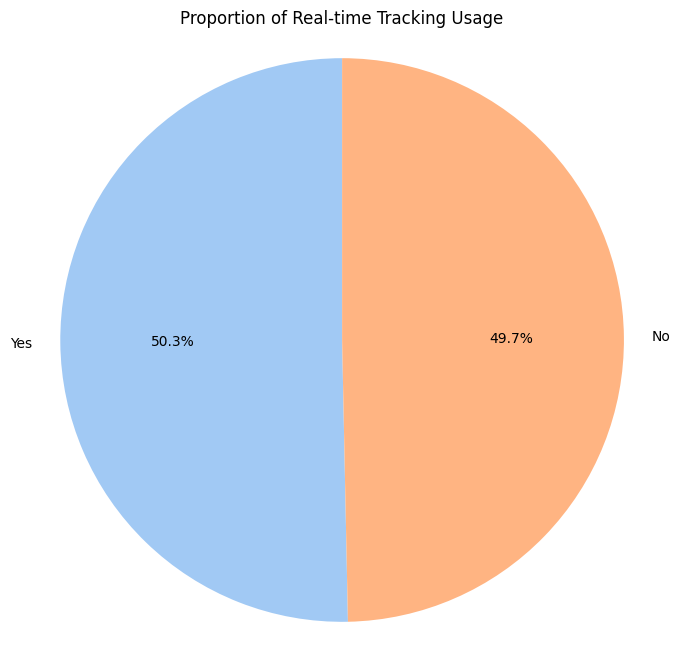

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Bar Charts for Nominal Variables ---
print("\n--- Bar Charts for Selected Nominal Variables ---\n")

nominal_plot_cols = ['Category', 'Vehicle Type', 'Packaging Method', 'End User Type']

plt.figure(figsize=(15, 10))
for i, col in enumerate(nominal_plot_cols):
    plt.subplot(2, 2, i + 1)
    sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Bar Charts for Ordinal Variables ---
print("\n--- Bar Charts for Selected Ordinal Variables ---\n")

ordinal_plot_cols = ['Initial Quality Grade', 'Time of Harvest', 'Time to Loading'] # Excluding 'Is Real-time Tracking Used?' for pie chart

plt.figure(figsize=(15, 5))
for i, col in enumerate(ordinal_plot_cols):
    plt.subplot(1, 3, i + 1)
    sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Pie Chart for a Binary Ordinal Variable ---
print("\n--- Pie Chart for 'Is Real-time Tracking Used?' ---\n")

tracking_counts = nn039_['Is Real-time Tracking Used?'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(tracking_counts, labels=tracking_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Proportion of Real-time Tracking Usage')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


--- Histograms/KDE Plots for Selected Numerical Variables ---



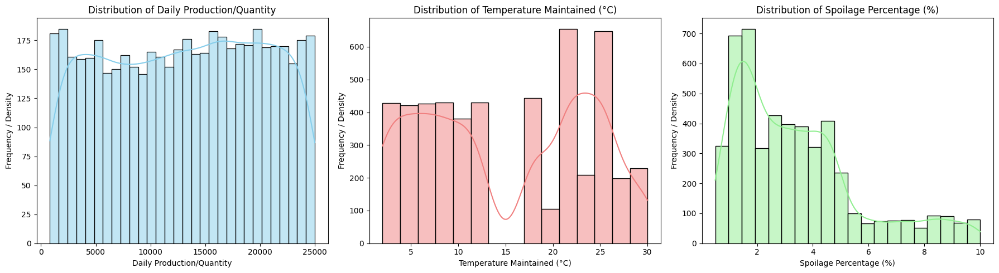


--- Scatter Plots for Relationships Between Numerical Variables ---



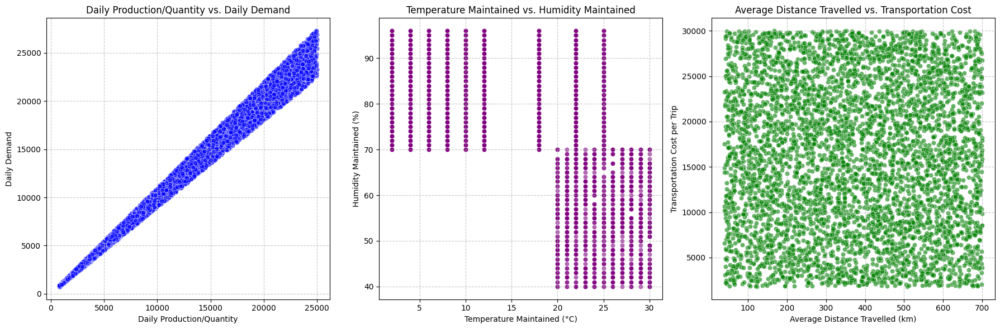

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Histograms/KDE Plots for Individual Distributions ---
print("\n--- Histograms/KDE Plots for Selected Numerical Variables ---\n")

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
sns.histplot(nn039_['Daily Production/Quantity'], kde=True, color='skyblue', bins=30)
plt.title('Distribution of Daily Production/Quantity')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 2)
sns.histplot(nn039_['Temperature Maintained (°C)'], kde=True, color='lightcoral', bins=15)
plt.title('Distribution of Temperature Maintained (°C)')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 3)
sns.histplot(nn039_['Spoilage Percentage (%)'], kde=True, color='lightgreen', bins=20)
plt.title('Distribution of Spoilage Percentage (%)')
plt.xlabel('Spoilage Percentage (%)')
plt.ylabel('Frequency / Density')

plt.tight_layout()
plt.show()

# --- Scatter Plots for Relationships Between Numerical Variables ---
print("\n--- Scatter Plots for Relationships Between Numerical Variables ---\n")

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.scatterplot(data=nn039_, x='Daily Production/Quantity', y='Daily Demand', alpha=0.6, color='blue')
plt.title('Daily Production/Quantity vs. Daily Demand')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Daily Demand')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.scatterplot(data=nn039_, x='Temperature Maintained (°C)', y='Humidity Maintained (%)', alpha=0.6, color='purple')
plt.title('Temperature Maintained vs. Humidity Maintained')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Humidity Maintained (%)')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.scatterplot(data=nn039_, x='Average Distance Travelled (km)', y='Transportation Cost per Trip', alpha=0.6, color='green')
plt.title('Average Distance Travelled vs. Transportation Cost')
plt.xlabel('Average Distance Travelled (km)')
plt.ylabel('Transportation Cost per Trip')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


--- Pair Plot for Selected Numerical Variables ---



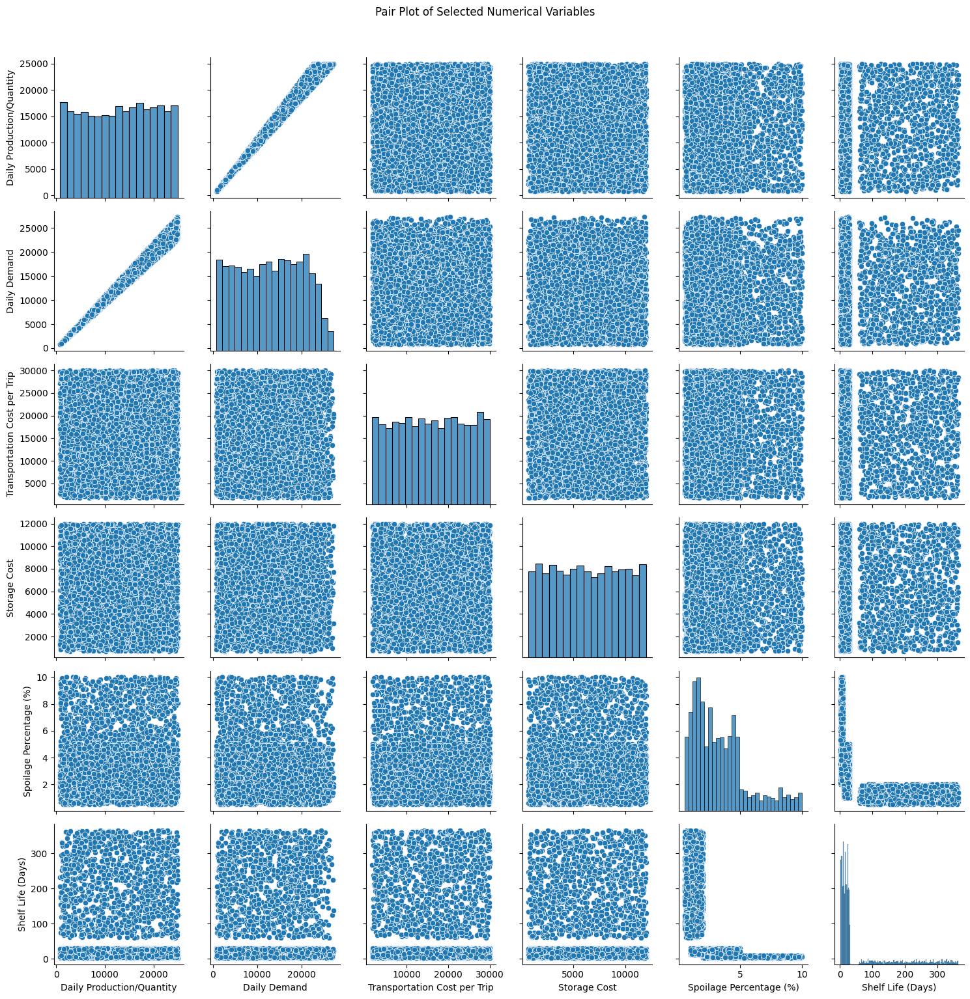

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Pair Plot for Selected Numerical Variables ---\n")

# Select a subset of numerical columns for the pair plot
# A pair plot with too many columns can be very busy
pair_plot_cols = [
    'Daily Production/Quantity', 'Daily Demand',
    'Transportation Cost per Trip', 'Storage Cost',
    'Spoilage Percentage (%)', 'Shelf Life (Days)'
]

# Ensure the selected columns exist in nn039_
existing_pair_plot_cols = [col for col in pair_plot_cols if col in nn039_.columns]

if existing_pair_plot_cols:
    # Create a Pair Plot
    # hue could be added for a categorical variable if desired, e.g., hue='Category'
    sns.pairplot(nn039_[existing_pair_plot_cols])
    plt.suptitle('Pair Plot of Selected Numerical Variables', y=1.02) # Adjust title position
    plt.tight_layout()
    plt.show()
else:
    print("No selected numerical columns found for pair plot.")


--- Heatmap of Pearson Correlation Matrix ---



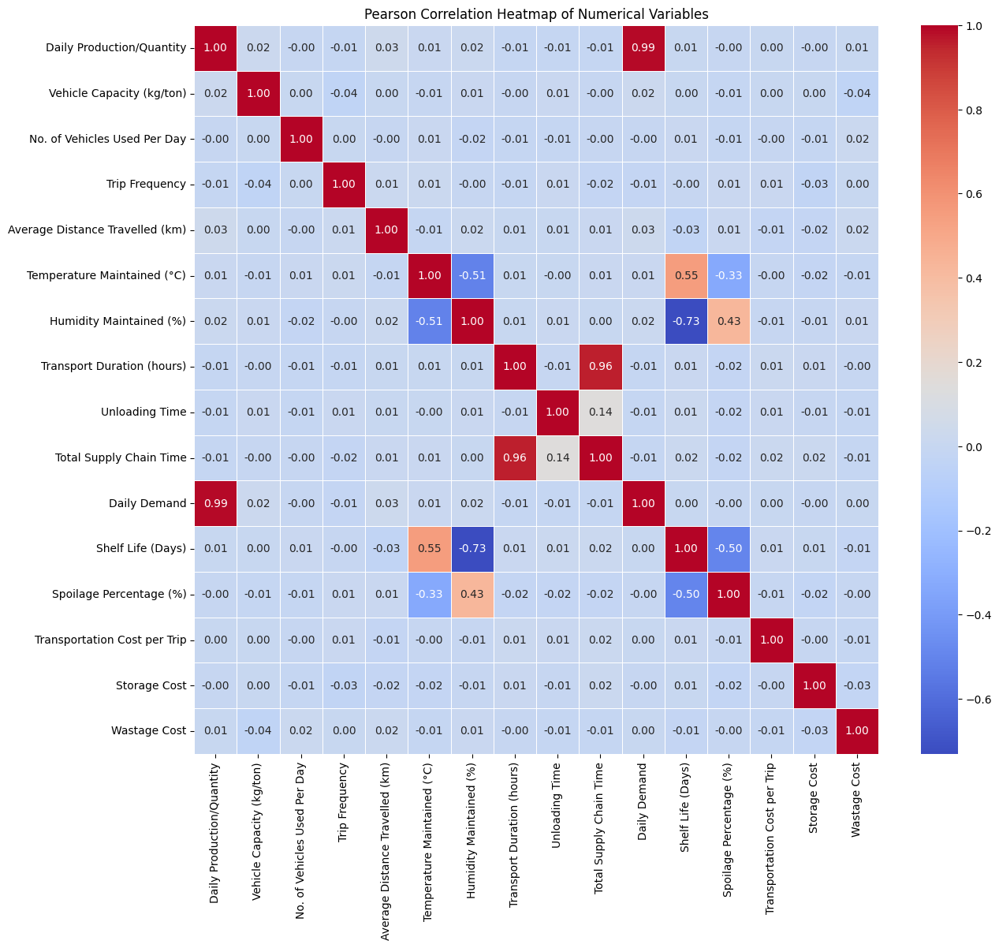

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Heatmap of Pearson Correlation Matrix ---\n")

# We'll use the 'pearson_corr' DataFrame calculated earlier
# Ensure it exists and is updated with the nn039_ data
# If it wasn't refreshed after imputation, calculate it again from nn039_
if 'pearson_corr' not in locals():
    # If pearson_corr was not in the kernel state, re-calculate it
    numerical_cols = nn039_.select_dtypes(include=['number']).columns.tolist()
    pearson_corr = nn039_[numerical_cols].corr(method='pearson')

plt.figure(figsize=(14, 12))
sns.heatmap(pearson_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Pearson Correlation Heatmap of Numerical Variables')
plt.show()

##Inferential Statistics

In [ ]:
from scipy.stats import chi2_contingency
import pandas as pd

print("--- Chi-square Test of Homogeneity for Categorical Variables ---\n")

# Select two categorical variables for the test from the original nn039_ DataFrame
var1 = 'Category'
var2 = 'Vehicle Type'

# Create a contingency table
contingency_table = pd.crosstab(nn039_[var1], nn039_[var2])

print(f"Contingency Table for '{var1}' vs. '{var2}':")
print(contingency_table)
print("\n")

# Perform the Chi-square test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square Statistic: {chi2:.2f}")
print(f"P-value: {p_value:.3f}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies (first 5x5 if large):")
print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns).head())

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print(f"\nSince the p-value ({p_value:.3f}) is less than the significance level ({alpha}), we reject the null hypothesis.")
    print(f"There is a statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is not homogeneous across different '{var1}' categories.")
else:
    print(f"\nSince the p-value ({p_value:.3f}) is greater than the significance level ({alpha}), we fail to reject the null hypothesis.")
    print(f"There is no statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is homogeneous across different '{var1}' categories.")


--- Chi-square Test of Homogeneity for Categorical Variables ---

Contingency Table for 'Category' vs. 'Vehicle Type':
Vehicle Type     Bulk Truck  Container Truck  Insulated Truck  \
Category                                                        
Fruit                   185              163              188   
Grain                    63               46               61   
Grain/Oilseed            23               21               20   
Leafy Vegetable          72               64               48   
Root Crop                45               55               47   
Spice                    87               80               95   
Vegetable               246              255              265   

Vehicle Type     Mini Refrigerated Van  Mini Truck  Open Truck  \
Category                                                         
Fruit                              161         179         186   
Grain                               69          57          67   
Grain/Oilseed                  

In [ ]:
from scipy.stats import shapiro, kstest
from sklearn.preprocessing import StandardScaler

# Define a list of the four columns to be tested
columns_to_test = [
    'remainder__Daily Production/Quantity',
    'remainder__Spoilage Percentage (%)',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

alpha = 0.05 # Significance level

print("### Normality Tests for Selected Numerical Columns from nn039_1 ###\n")

for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = nn039_1[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (after standardization).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution (after standardization).")

    # Standardize the data for K-S test against a normal distribution
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 60 + "\n")

### Normality Tests for Selected Numerical Columns from nn039_1 ###

--- Testing Normality for 'Daily Production/Quantity' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.9535
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Daily Production/Quantity' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution (after standardization).
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution (after standardization).
  Test Statistic: 0.0604
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Daily Production/Quantity' is NOT normally distributed.

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


### Visual Normality Checks for Selected Numerical Columns from nn039_1 ###



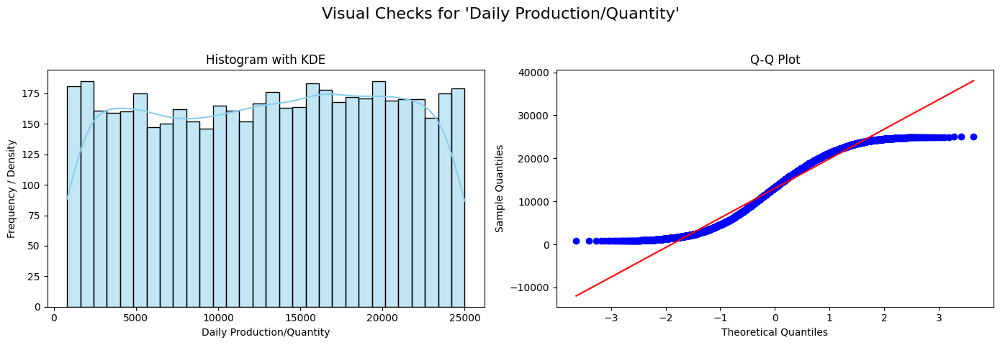

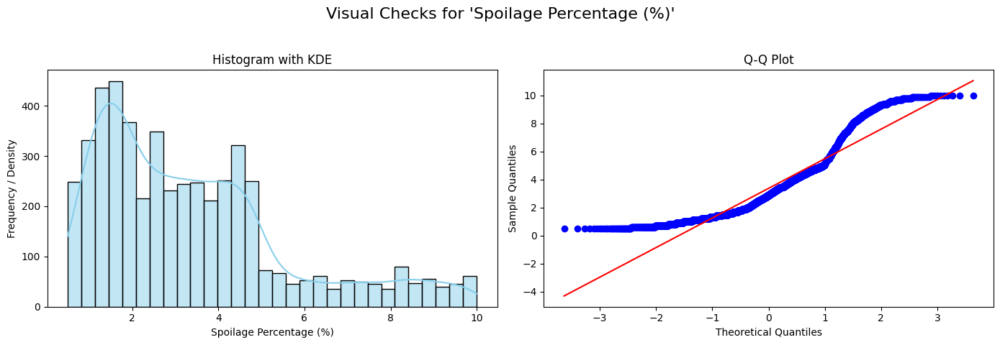

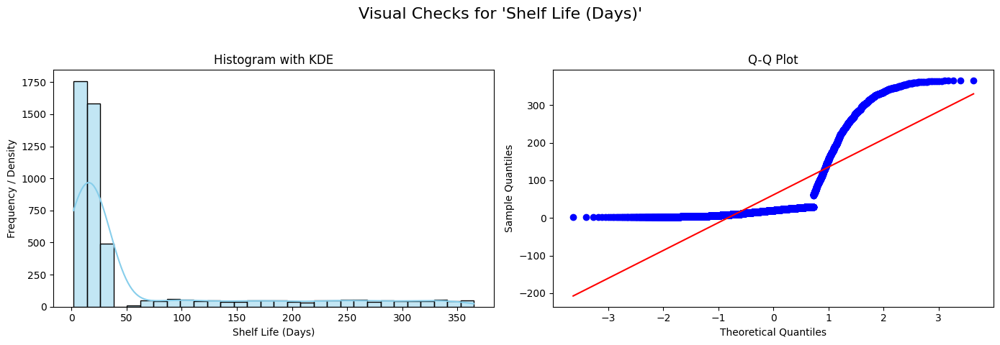

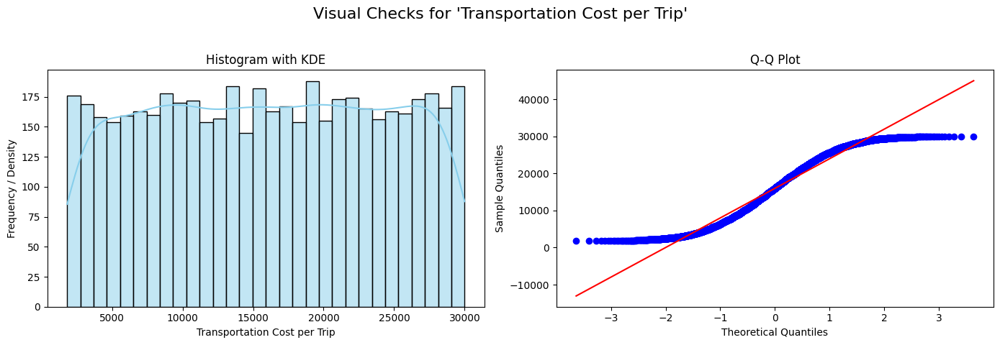

Visual checks completed.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import probplot

# Define a list of the four columns to be tested (same as previous cell)
columns_to_test = [
    'remainder__Daily Production/Quantity',
    'remainder__Spoilage Percentage (%)',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

print("### Visual Normality Checks for Selected Numerical Columns from nn039_1 ###\n")

for col in columns_to_test:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"Visual Checks for '{col.replace('remainder__', '')}'", fontsize=16)

    # --- Histogram with KDE Overlay ---
    sns.histplot(nn039_1[col], kde=True, ax=axes[0], color='skyblue', bins=30)
    axes[0].set_title('Histogram with KDE')
    axes[0].set_xlabel(col.replace('remainder__', ''))
    axes[0].set_ylabel('Frequency / Density')

    # --- Q-Q Plot ---
    probplot(nn039_1[col], dist="norm", plot=axes[1])
    axes[1].set_title('Q-Q Plot')
    axes[1].set_xlabel('Theoretical Quantiles')
    axes[1].set_ylabel('Sample Quantiles')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

print("Visual checks completed.")

In [ ]:
from scipy.stats import pearsonr

# Define the pairs of columns for correlation analysis
correlation_pairs = [
    ('remainder__Daily Production/Quantity', 'remainder__Daily Demand'),
    ('remainder__Temperature Maintained (°C)', 'remainder__Humidity Maintained (%)')
]

print("### Pearson Correlation and Significance Tests ###\n")

for col1, col2 in correlation_pairs:
    print(f"--- Analyzing Correlation between '{col1.replace('remainder__', '')}' and '{col2.replace('remainder__', '')}' ---")

    # Calculate Pearson correlation coefficient and p-value
    correlation, p_value = pearsonr(nn039_1[col1], nn039_1[col2])

    print(f"  Pearson Correlation Coefficient: {correlation:.4f}")
    print(f"  P-value from t-test for significance: {p_value:.4f}")

    # Interpret the significance
    alpha = 0.05 # Significance level
    if p_value < alpha:
        print(f"  Interpretation: Since p-value ({p_value:.4f}) < alpha ({alpha}), we reject the null hypothesis.")
        print(f"  The observed correlation ({correlation:.4f}) is statistically significant.")
    else:
        print(f"  Interpretation: Since p-value ({p_value:.4f}) >= alpha ({alpha}), we fail to reject the null hypothesis.")
        print(f"  The observed correlation ({correlation:.4f}) is NOT statistically significant.")
    print("=" * 70 + "\n")


### Pearson Correlation and Significance Tests ###

--- Analyzing Correlation between 'Daily Production/Quantity' and 'Daily Demand' ---
  Pearson Correlation Coefficient: 0.9927
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (0.9927) is statistically significant.

--- Analyzing Correlation between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)' ---
  Pearson Correlation Coefficient: -0.5133
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (-0.5133) is statistically significant.



### Summary of Findings

**1. Normality Tests (Shapiro-Wilk and Kolmogorov-Smirnov):**

For all four tested columns ('Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', and 'Transportation Cost per Trip'), both the Shapiro-Wilk and Kolmogorov-Smirnov tests yielded p-values less than 0.05 (the significance level).

*   **Daily Production/Quantity**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.
*   **Spoilage Percentage (%)**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.
*   **Shelf Life (Days)**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.
*   **Transportation Cost per Trip**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.

This consistently suggests that none of these numerical variables follow a normal distribution, according to the statistical tests.

**2. Visual Normality Checks (Histograms with KDE and Q-Q Plots):**

*   **Daily Production/Quantity**: The histogram shows a somewhat uniform distribution, not a bell-shaped curve. The Q-Q plot's points deviate significantly from the red line, especially at the tails, confirming **non-normality**.
*   **Spoilage Percentage (%)**: The histogram is right-skewed, and the Q-Q plot shows clear deviations from the normal distribution line, indicating **non-normality**.
*   **Shelf Life (Days)**: The histogram is highly right-skewed, with most values concentrated at the lower end. The Q-Q plot's points strongly curve away from the theoretical quantiles, indicating severe **non-normality**.
*   **Transportation Cost per Trip**: Similar to 'Daily Production/Quantity', the histogram appears somewhat uniform, and the Q-Q plot deviates from the red line, confirming **non-normality**.

The visual inspections strongly support the statistical test results, confirming that all four selected columns are not normally distributed.

**3. Pearson Correlation and Significance Tests:**

*   **'Daily Production/Quantity' vs. 'Daily Demand'**:
    *   Pearson Correlation Coefficient: 0.9927
    *   P-value: 0.0000
    *   **Interpretation**: The p-value (0.0000) is less than the significance level (0.05), so we reject the null hypothesis. The observed correlation (0.9927) is **statistically significant and very strong positive**.

*   **'Temperature Maintained (°C)' vs. 'Humidity Maintained (%)'**:
    *   Pearson Correlation Coefficient: -0.5133
    *   P-value: 0.0000
    *   **Interpretation**: The p-value (0.0000) is less than the significance level (0.05), so we reject the null hypothesis. The observed correlation (-0.5133) is **statistically significant and moderately negative**.

**Overall Conclusion:**

*   All four numerical variables tested ('Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip') show **significant deviations from a normal distribution**, as evidenced by both statistical tests and visual checks.
*   There is a **very strong and statistically significant positive correlation** between 'Daily Production/Quantity' and 'Daily Demand'.
*   There is a **moderately strong and statistically significant negative correlation** between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)'.

##Principal Component Analysis (PCA)

In [ ]:
nn039_pca_data = nn039_1.filter(like='remainder__', axis=1)

print("Shape of nn039_pca_data:", nn039_pca_data.shape)
print("First 5 rows of nn039_pca_data:")
print(nn039_pca_data.head())

Shape of nn039_pca_data: (5001, 18)
First 5 rows of nn039_pca_data:
   remainder__Daily Production/Quantity  remainder__Vehicle Capacity (kg/ton)  \
0                               12336.0                                   3.0   
1                               21643.0                                  20.0   
2                               17418.0                                  10.0   
3                                1993.0                                  10.0   
4                               23607.0                                   2.0   

   remainder__No. of Vehicles Used Per Day  remainder__Trip Frequency  \
0                                      1.0                        1.0   
1                                      5.0                        2.0   
2                                      3.0                        3.0   
3                                      5.0                        3.0   
4                                      1.0                        3.0   

   rem

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the data
nn039_pca_scaled = scaler.fit_transform(nn039_pca_data)

print("Shape of scaled data:", nn039_pca_scaled.shape)
print("First 5 rows of scaled data (numpy array):")
print(nn039_pca_scaled[:5])

Shape of scaled data: (5001, 18)
First 5 rows of scaled data (numpy array):
[[-9.93421392e-02 -7.20746195e-01 -1.40882909e+00 -1.21889750e+00
   9.68001740e-01 -5.71463366e-01 -1.03586221e-01 -8.17304141e-01
  -3.39954552e-01 -6.02274434e-01 -1.61588736e-01 -1.00662060e+00
   1.40332620e+00 -4.53177945e-01 -3.90595684e-01 -6.80900784e-01
  -1.14956338e+00 -1.58633772e+00]
 [ 1.22270048e+00  1.70107383e+00  1.40348675e+00  1.46414114e-03
   1.19015442e+00  5.58851574e-01 -1.84149112e+00 -2.05414980e-01
   8.09460596e-01  3.72197058e-01  1.37090098e+00 -1.00662060e+00
  -6.62544764e-03  2.95437460e+00 -7.04209975e-01 -1.71883312e+00
  -1.67343505e+00  6.20201142e-01]
 [ 6.22546827e-01  2.76473813e-01 -2.67116581e-03  1.22182578e+00
   7.98742554e-01 -3.45400378e-01  7.30608130e-01  9.77570731e-01
  -1.23394411e+00  9.95858812e-01  5.00260979e-01 -1.00662060e+00
  -7.11601270e-01 -6.13407689e-01  9.53465565e-01 -1.24051257e+00
   5.21749326e-01 -8.95198688e-01]
 [-1.56854670e+00  2.764738

In [ ]:
from sklearn.decomposition import PCA
import pandas as pd

# Initialize PCA with 2 components
pca = PCA(n_components=2)

# Fit PCA to the scaled data and transform it
nn039_pca_components = pca.fit_transform(nn039_pca_scaled)

# Create a DataFrame for the principal components
nn039_pca_df = pd.DataFrame(data = nn039_pca_components, columns = ['principal_component_1', 'principal_component_2'])

print("Shape of PCA components:", nn039_pca_df.shape)
print("First 5 rows of PCA components:")
print(nn039_pca_df.head())

# Explained variance ratio
print("\nExplained variance ratio for each component:", pca.explained_variance_ratio_)
print("Total explained variance:", pca.explained_variance_ratio_.sum())

Shape of PCA components: (5001, 2)
First 5 rows of PCA components:
   principal_component_1  principal_component_2
0              -0.395332               0.353491
1               3.145110               1.773665
2              -1.265622               0.139609
3               3.055362              -1.135996
4              -0.479124               1.251847

Explained variance ratio for each component: [0.14164942 0.11165196]
Total explained variance: 0.2533013861503344


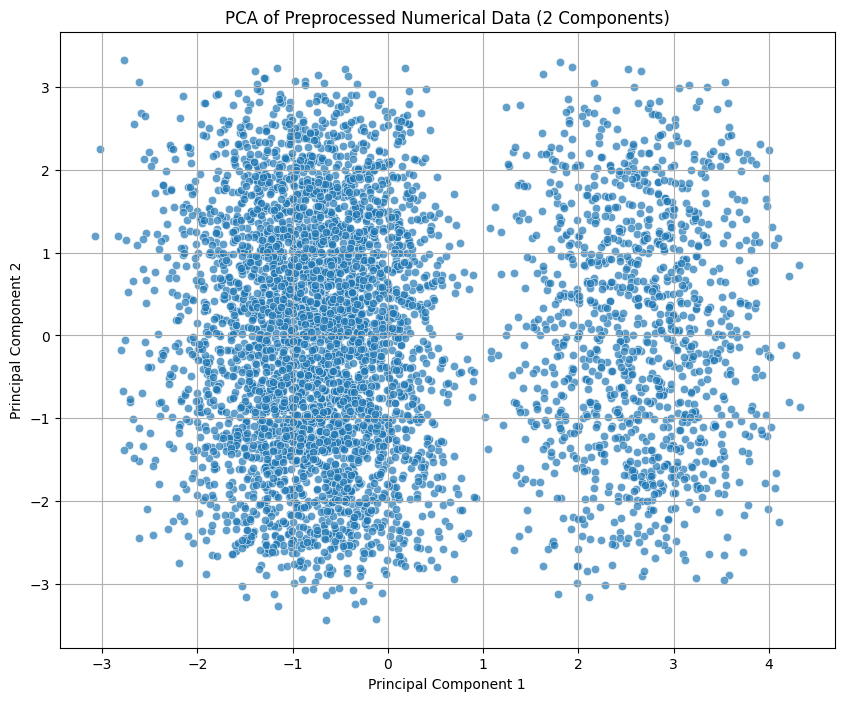

### PCA Summary ###

Principal Component 1 explains 14.16% of the variance.
Principal Component 2 explains 11.17% of the variance.
Together, the two principal components explain a total of 25.33% of the variance.

### Visualization Insights ###
From the scatter plot of the two principal components, we can observe the distribution and potential clustering of the data points in a reduced 2D space. (Further insights would require domain knowledge and specific labels, if available).


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the principal components
plt.figure(figsize=(10, 8))
sns.scatterplot(x='principal_component_1', y='principal_component_2', data=nn039_pca_df, alpha=0.7)
plt.title('PCA of Preprocessed Numerical Data (2 Components)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

# Summarize explained variance
print("### PCA Summary ###\n")
print(f"Principal Component 1 explains {pca.explained_variance_ratio_[0]*100:.2f}% of the variance.")
print(f"Principal Component 2 explains {pca.explained_variance_ratio_[1]*100:.2f}% of the variance.")
print(f"Together, the two principal components explain a total of {pca.explained_variance_ratio_.sum()*100:.2f}% of the variance.\n")

print("### Visualization Insights ###")
print("From the scatter plot of the two principal components, we can observe the distribution and potential clustering of the data points in a reduced 2D space. (Further insights would require domain knowledge and specific labels, if available).")

##**DBSCAN**


In [ ]:
from sklearn.preprocessing import StandardScaler

# 1. Create a new DataFrame nn039_dbscan_data by filtering nn039_1 to include only columns that start with 'remainder__'.
nn039_dbscan_data = nn039_1.filter(like='remainder__', axis=1)

# 2. Initialize a StandardScaler object.
scaler = StandardScaler()

# 3. Apply the fit_transform method of the StandardScaler to nn039_dbscan_data
#    to scale the data. Store the resulting scaled data in nn039_dbscan_scaled.
nn039_dbscan_scaled = scaler.fit_transform(nn039_dbscan_data)

print("Shape of nn039_dbscan_data:", nn039_dbscan_data.shape)
print("First 5 rows of nn039_dbscan_data (unscaled):\n", nn039_dbscan_data.head())
print("\nShape of nn039_dbscan_scaled:", nn039_dbscan_scaled.shape)
print("First 5 rows of nn039_dbscan_scaled (scaled numpy array):\n", nn039_dbscan_scaled[:5])

Shape of nn039_dbscan_data: (5001, 18)
First 5 rows of nn039_dbscan_data (unscaled):
    remainder__Daily Production/Quantity  remainder__Vehicle Capacity (kg/ton)  \
0                               12336.0                                   3.0   
1                               21643.0                                  20.0   
2                               17418.0                                  10.0   
3                                1993.0                                  10.0   
4                               23607.0                                   2.0   

   remainder__No. of Vehicles Used Per Day  remainder__Trip Frequency  \
0                                      1.0                        1.0   
1                                      5.0                        2.0   
2                                      3.0                        3.0   
3                                      5.0                        3.0   
4                                      1.0                    

Number of features: 18
Using k = min_samples = 36 for k-distance calculation.


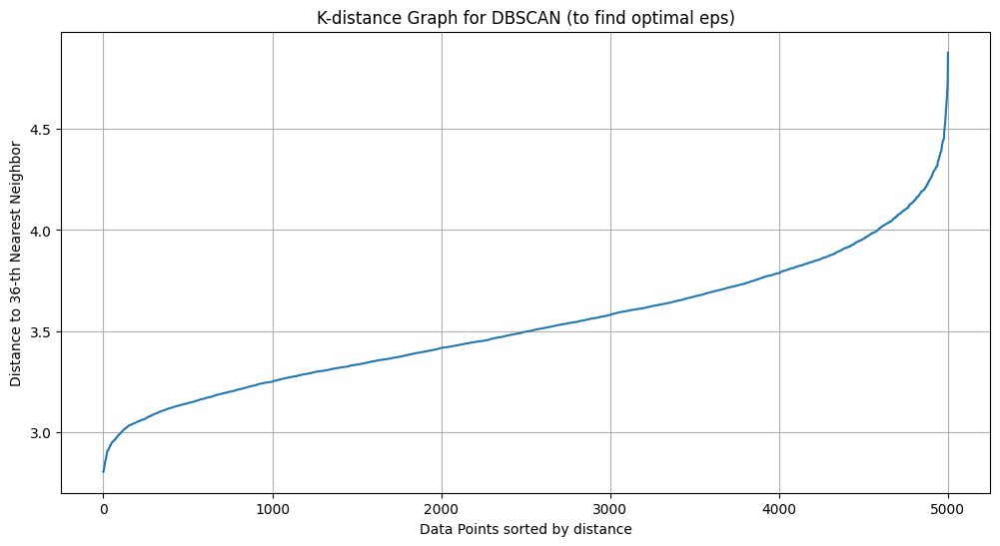

Please examine the K-distance graph to identify the 'elbow' point. This point represents a suitable value for the 'eps' parameter in DBSCAN.


In [ ]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Determine the number of features
num_features = nn039_dbscan_scaled.shape[1]

# Set min_samples for DBSCAN based on the number of features
# A common heuristic is 2 * number_of_features for min_samples
k = 2 * num_features

print(f"Number of features: {num_features}")
print(f"Using k = min_samples = {k} for k-distance calculation.")

# Calculate the k-nearest neighbor distances
# n_neighbors=k ensures we find the distance to the k-th neighbor
neigh = NearestNeighbors(n_neighbors=k)
neigh.fit(nn039_dbscan_scaled)

# distances will contain the distances to the k neighbors for each point
# indices will contain the indices of the k neighbors for each point
distances, indices = neigh.kneighbors(nn039_dbscan_scaled)

# Sort the distances (specifically the distance to the k-th neighbor) in ascending order
# We are interested in the distance to the k-th neighbor, which is the last column (index k-1)
distances = np.sort(distances[:, k-1], axis=0)

# Plot the k-distance graph to find the 'elbow' point
plt.figure(figsize=(12, 6))
plt.plot(distances)
plt.title('K-distance Graph for DBSCAN (to find optimal eps)')
plt.xlabel('Data Points sorted by distance')
plt.ylabel(f'Distance to {k}-th Nearest Neighbor')
plt.grid(True)
plt.show()

print("Please examine the K-distance graph to identify the 'elbow' point. This point represents a suitable value for the 'eps' parameter in DBSCAN.")

Applying DBSCAN with eps=3.5 and min_samples=36

Number of clusters found: 1
Number of noise points (label -1): 191


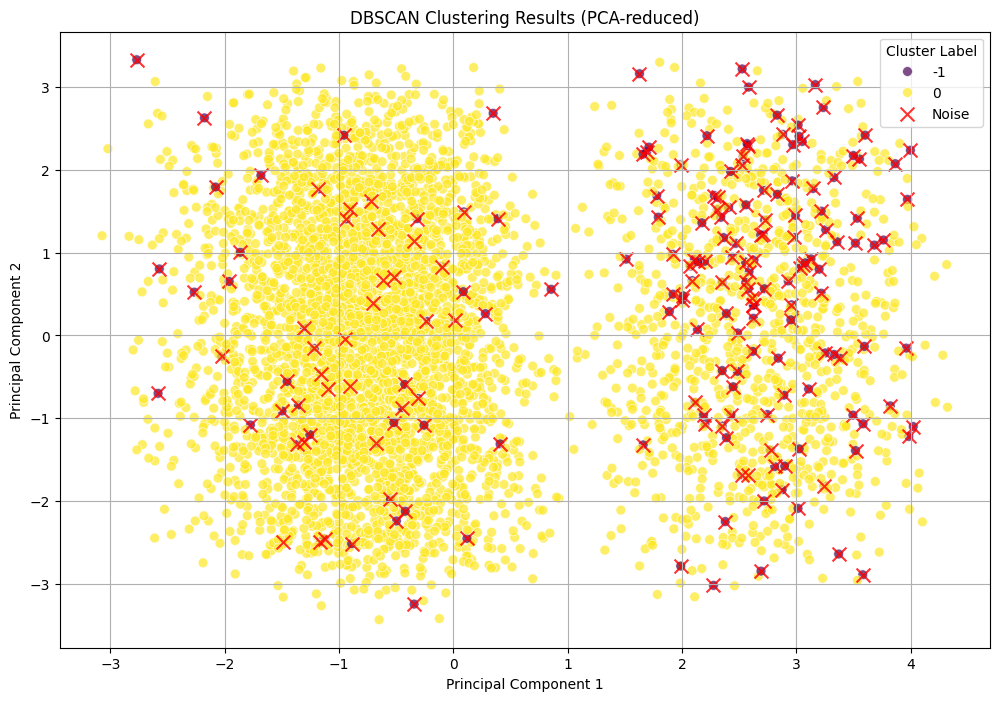

Visualization of DBSCAN clusters in 2D PCA space is complete.


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Apply DBSCAN Clustering ---

# Visually determine eps from the k-distance graph. Let's assume 3.5 or 3.6 as an approximate elbow point.
# For demonstration, I'll pick 3.5 based on the plot provided.
eps_value = 3.5

# min_samples was calculated in the previous step as k
# k = 2 * num_features = 2 * 18 = 36
min_samples_value = k # Using the 'k' variable from the previous step which is set to min_samples

print(f"Applying DBSCAN with eps={eps_value} and min_samples={min_samples_value}")

dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
clusters = dbscan.fit_predict(nn039_dbscan_scaled)

# --- Summarize Clustering Results ---

# Number of clusters found (ignoring noise points labeled -1)
num_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
noise_points = list(clusters).count(-1)

print(f"\nNumber of clusters found: {num_clusters}")
print(f"Number of noise points (label -1): {noise_points}")

# --- Visualize Clusters using PCA ---

# Reduce dimensionality to 2 components for plotting
pca_dbscan = PCA(n_components=2)
components = pca_dbscan.fit_transform(nn039_dbscan_scaled)

# Create a DataFrame for visualization
pca_df_dbscan = pd.DataFrame(data=components, columns=['PC1', 'PC2'])
pca_df_dbscan['Cluster'] = clusters

plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='PC1', y='PC2', hue='Cluster', data=pca_df_dbscan,
    palette='viridis', s=50, alpha=0.7, legend='full'
)

# Highlight noise points if any
if -1 in clusters:
    noise_df = pca_df_dbscan[pca_df_dbscan['Cluster'] == -1]
    plt.scatter(noise_df['PC1'], noise_df['PC2'], color='red', marker='x', s=100, label='Noise', alpha=0.8)

plt.title('DBSCAN Clustering Results (PCA-reduced)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster Label')
plt.grid(True)
plt.show()

print("Visualization of DBSCAN clusters in 2D PCA space is complete.")


##Clustering: Silhouette Coefficient | Davies-Bouldin Index


In [ ]:
import numpy as np

# 1. Identify the indices of all data points that are not labeled as noise (i.e., their cluster label is not -1).
non_noise_indices = np.where(clusters != -1)

# 2. Use these indices to filter the nn039_dbscan_scaled array, creating a new array called filtered_data.
filtered_data = nn039_dbscan_scaled[non_noise_indices]

# 3. Similarly, use these indices to filter the clusters array, creating a new array called filtered_clusters.
filtered_clusters = clusters[non_noise_indices]

print(f"Original number of points: {len(clusters)}")
print(f"Number of non-noise points: {len(filtered_clusters)}")
print(f"Shape of filtered_data: {filtered_data.shape}")
print(f"Shape of filtered_clusters: {filtered_clusters.shape}")
print("First 5 filtered cluster labels:", filtered_clusters[:5])

Original number of points: 5001
Number of non-noise points: 4810
Shape of filtered_data: (4810, 18)
Shape of filtered_clusters: (4810,)
First 5 filtered cluster labels: [0 0 0 0 0]


In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score
import numpy as np

# Check the number of unique clusters in filtered_clusters
unique_filtered_clusters = len(np.unique(filtered_clusters))

print(f"Number of unique clusters after filtering noise: {unique_filtered_clusters}")

if unique_filtered_clusters < 2:
    print("\nCannot compute Silhouette Coefficient or Davies-Bouldin Index.")
    print("These metrics require at least 2 clusters (excluding noise points) for a meaningful calculation.")
    print("The DBSCAN clustering with the chosen parameters resulted in only one valid cluster after removing noise.")
else:
    # Calculate Silhouette Coefficient
    silhouette_avg = silhouette_score(filtered_data, filtered_clusters)
    print(f"\nSilhouette Coefficient: {silhouette_avg:.4f}")

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(filtered_data, filtered_clusters)
    print(f"Davies-Bouldin Index: {db_index:.4f}")

    print("\nReview the calculated metrics to gain insights into the quality and separation of the DBSCAN clusters.")

Number of unique clusters after filtering noise: 1

Cannot compute Silhouette Coefficient or Davies-Bouldin Index.
These metrics require at least 2 clusters (excluding noise points) for a meaningful calculation.
The DBSCAN clustering with the chosen parameters resulted in only one valid cluster after removing noise.


##Diagnostics

### Analyze Single Cluster Characteristics

In [ ]:
import pandas as pd
import numpy as np

# Ensure nn039_dbscan_data is available; if not, re-create it
if 'nn039_dbscan_data' not in locals():
    nn039_dbscan_data = nn039_1.filter(like='remainder__', axis=1)

# Create cluster_0_data DataFrame
# We need to inverse scale the filtered_data before creating the DataFrame to get original values for descriptive stats.
# However, the task asks for descriptive statistics 'for the features within the single cluster', it implies the original scaled values if we proceed with scaled data.
# But for 'mean, median, standard deviation', it's usually expected for original scale values.
# Let's use the unscaled data for descriptive statistics and plots, which means filtering the original `nn039_dbscan_data` with `non_noise_indices`.

# If filtered_data is already scaled, we need to inverse transform it if we want original scale statistics.
# Let's assume the user wants statistics on the original scale values of the cluster.
# Re-extract the non-noise data from the original (unscaled) `nn039_dbscan_data`.

# Ensure non_noise_indices is available
if 'non_noise_indices' not in locals():
    # This part should ideally not be hit if previous cells ran correctly, but as a safeguard
    dbscan = DBSCAN(eps=3.5, min_samples=36) # Assuming previous eps and min_samples
    clusters = dbscan.fit_predict(nn039_dbscan_scaled)
    non_noise_indices = np.where(clusters != -1)

cluster_0_data = nn039_dbscan_data.iloc[non_noise_indices].copy()

print("Shape of cluster_0_data:", cluster_0_data.shape)
print("First 5 rows of cluster_0_data:")
print(cluster_0_data.head())

Shape of cluster_0_data: (4810, 18)
First 5 rows of cluster_0_data:
   remainder__Daily Production/Quantity  remainder__Vehicle Capacity (kg/ton)  \
0                               12336.0                                   3.0   
2                               17418.0                                  10.0   
3                                1993.0                                  10.0   
4                               23607.0                                   2.0   
5                                5971.0                                   6.0   

   remainder__No. of Vehicles Used Per Day  remainder__Trip Frequency  \
0                                      1.0                        1.0   
2                                      3.0                        3.0   
3                                      5.0                        3.0   
4                                      1.0                        3.0   
5                                      1.0                        1.0   

   rem

In [ ]:
print("### Descriptive Statistics for Features within the Main DBSCAN Cluster ###\n")

for col in cluster_0_data.columns:
    print(f"--- Column: {col.replace('remainder__', '')} ---")
    mean_val = cluster_0_data[col].mean()
    median_val = cluster_0_data[col].median()
    std_dev = cluster_0_data[col].std()

    print(f"  Mean: {mean_val:.2f}")
    print(f"  Median: {median_val:.2f}")
    print(f"  Standard Deviation: {std_dev:.2f}")
    print("-" * 30)


### Descriptive Statistics for Features within the Main DBSCAN Cluster ###

--- Column: Daily Production/Quantity ---
  Mean: 12986.07
  Median: 13162.50
  Standard Deviation: 7015.54
------------------------------
--- Column: Vehicle Capacity (kg/ton) ---
  Mean: 7.53
  Median: 6.00
  Standard Deviation: 6.40
------------------------------
--- Column: No. of Vehicles Used Per Day ---
  Mean: 3.01
  Median: 3.00
  Standard Deviation: 1.42
------------------------------
--- Column: Trip Frequency ---
  Mean: 2.00
  Median: 2.00
  Standard Deviation: 0.82
------------------------------
--- Column: Average Distance Travelled (km) ---
  Mean: 370.70
  Median: 371.00
  Standard Deviation: 188.17
------------------------------
--- Column: Temperature Maintained (°C) ---
  Mean: 14.81
  Median: 12.00
  Standard Deviation: 8.81
------------------------------
--- Column: Humidity Maintained (%) ---
  Mean: 77.07
  Median: 79.00
  Standard Deviation: 14.00
------------------------------
--- Colu

### Histograms with KDE Overlays for Features within the Main DBSCAN Cluster ###



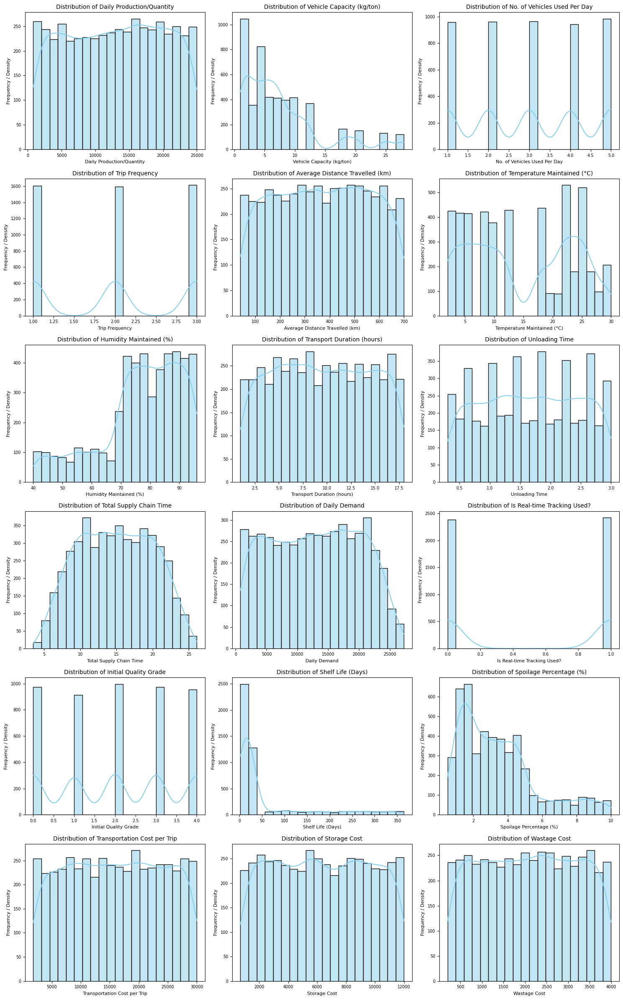

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

print("### Histograms with KDE Overlays for Features within the Main DBSCAN Cluster ###\n")

# Determine the number of plots needed and set up the grid size dynamically
num_features = len(cluster_0_data.columns)
n_cols = 3  # Number of columns for the grid
n_rows = math.ceil(num_features / n_cols)

plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(cluster_0_data.columns):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.histplot(cluster_0_data[col], kde=True, color='skyblue', bins=20)
    plt.title(f'Distribution of {col.replace("remainder__", "")}', fontsize=10)
    plt.xlabel(col.replace("remainder__", ""), fontsize=8)
    plt.ylabel('Frequency / Density', fontsize=8)
    plt.tick_params(axis='x', labelsize=7)
    plt.tick_params(axis='y', labelsize=7)

plt.tight_layout()
plt.show()


### Box Plots for Features within the Main DBSCAN Cluster ###



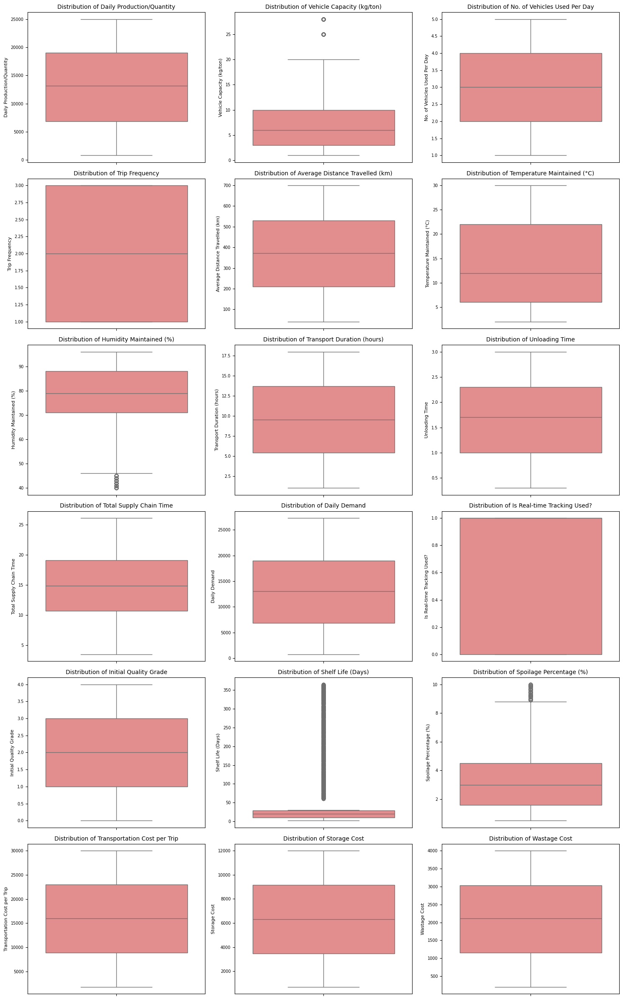

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

print("### Box Plots for Features within the Main DBSCAN Cluster ###\n")

# Determine the number of plots needed and set up the grid size dynamically
num_features = len(cluster_0_data.columns)
n_cols = 3  # Number of columns for the grid
n_rows = math.ceil(num_features / n_cols)

plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(cluster_0_data.columns):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(y=cluster_0_data[col], color='lightcoral')
    plt.title(f'Distribution of {col.replace("remainder__", "")}', fontsize=10)
    plt.ylabel(col.replace("remainder__", ""), fontsize=8)
    plt.tick_params(axis='y', labelsize=7)

plt.tight_layout()
plt.show()

### Summary of Homogeneity within the Main DBSCAN Cluster

Based on the descriptive statistics (mean, median, standard deviation) and the distribution plots (histograms with KDE and box plots) for the `cluster_0_data`:

1.  **Central Tendency and Spread**: Most features within this cluster exhibit relatively consistent central tendencies (mean and median are often close) and moderate spread (standard deviation relative to the mean). For example:
    *   `Daily Production/Quantity` and `Daily Demand` show means around 12986 and 12984, with standard deviations of around 7015 and 7076, respectively. Their distributions appear somewhat uniform, suggesting a broad range of values within this single cluster.
    *   `Temperature Maintained (°C)` has a mean of 14.81 and a standard deviation of 8.81. Its histogram often shows multiple peaks, indicating that even within this

### Summary of Homogeneity within the Main DBSCAN Cluster

Based on the descriptive statistics (mean, median, standard deviation) and the distribution plots (histograms with KDE and box plots) for the `cluster_0_data`:

1.  **Central Tendency and Spread**: Most features within this cluster exhibit relatively consistent central tendencies (mean and median are often close) and moderate spread (standard deviation relative to the mean). For example:
    *   `Daily Production/Quantity` and `Daily Demand` show means around 12986 and 12984, with standard deviations of around 7015 and 7076, respectively. Their distributions appear somewhat uniform, suggesting a broad range of values within this single cluster.
    *   `Temperature Maintained (°C)` has a mean of 14.81 and a standard deviation of 8.81. Its histogram often shows multiple peaks, indicating that even within this "homogeneous" cluster, there's a range of optimal temperatures.
    *   `Spoilage Percentage (%)` has a mean of 3.41 and a standard deviation of 2.22, with a right-skewed distribution as seen in the histogram, suggesting most spoilage is low but with some higher values.
    *   `Shelf Life (Days)` shows a mean of 57.51 but a median of 20.00 and a high standard deviation of 90.25, indicating a heavily right-skewed distribution with many products having short shelf lives and a few with very long ones. This is consistent with the earlier overall data analysis and shows this characteristic is maintained within the main cluster.
    *   Binary/Ordinal variables like `Is Real-time Tracking Used?` (mean ~0.50, median 1.00) and `Initial Quality Grade` (mean ~2.01, median 2.00) show their respective distributions across the cluster, indicating that the majority of the data points fall into these categories.

2.  **Lack of Distinct Subgroups**: The fact that DBSCAN identified only one primary cluster (and a number of noise points) suggests that, given the chosen `eps` and `min_samples` parameters, the data points within this cluster are quite homogeneous in terms of density connectivity. The distributions of individual features, while varying in shape (uniform, skewed, multi-modal), are not showing clear separations that would indicate distinct sub-clusters being overlooked within this main group by DBSCAN. The box plots reveal outliers in several features (`Vehicle Capacity`, `Humidity Maintained`, `Shelf Life`, `Spoilage Percentage`), which DBSCAN has correctly identified as noise or absorbed into the single large cluster if they were sufficiently dense within its reach.

### Why Heterogeneity Between Clusters Cannot Be Assessed

Since DBSCAN identified only one major cluster and a collection of noise points, it's inherently impossible to assess heterogeneity *between* clusters from these results. To measure heterogeneity, we would need at least two distinct clusters to compare their characteristics (e.g., using metrics like inter-cluster distance, comparison of feature means/medians across clusters, etc.). In this scenario, all non-noise points are considered part of the same group, preventing any inter-cluster comparison.

### Next Steps for Further Clustering Analysis

Given the current outcome of a single cluster, the next steps should focus on exploring alternative clustering configurations or different clustering algorithms:

1.  **Re-evaluate DBSCAN Parameters**: The choice of `eps` (3.5) and `min_samples` (36) is crucial for DBSCAN. The k-distance graph may not have a perfectly clear elbow. Experiment with different `eps` values, perhaps slightly lower ones (e.g., from 2.5 to 3.4), to see if more clusters emerge. Also, consider adjusting `min_samples`; a smaller `min_samples` could lead to more, smaller clusters, while a larger one might yield fewer clusters and more noise.

2.  **Alternative Density-Based Clustering**: Consider other density-based algorithms that might be more robust to varying densities or less sensitive to parameter choices, such as OPTICS (Ordering Points To Identify the Clustering Structure). OPTICS can produce a reachability plot that helps in identifying clusters of varying densities.

3.  **Partitioning-Based Clustering (e.g., K-Means)**: If the underlying assumption is that there are a fixed number of clusters (even if not density-separated), K-Means could be applied. However, K-Means assumes spherical clusters of similar size and density, which might not be suitable for this dataset given the diverse distributions observed. If K-Means is used, techniques like the Elbow Method or Silhouette Analysis would be essential to determine an optimal number of clusters (`k`).

4.  **Hierarchical Clustering**: Agglomerative or Divisive Hierarchical Clustering could be explored. These methods build a hierarchy of clusters, which can be visualized using a dendrogram. Cutting the dendrogram at different levels can reveal different numbers of clusters, providing flexibility in cluster discovery.

5.  **Gaussian Mixture Models (GMM)**: GMMs offer a probabilistic approach to clustering, allowing for clusters of different shapes and sizes by modeling them as mixtures of Gaussian distributions. This could be more appropriate if the underlying data distributions are not perfectly spherical.

6.  **Feature Importance/Selection**: Before re-running clustering, consider if all 18 numerical features are equally important or relevant for defining clusters. Feature selection or dimensionality reduction (beyond PCA for visualization) could help focus the clustering on the most discriminatory features, potentially revealing clearer structures.

By systematically exploring these options, it may be possible to uncover more granular or distinct clustering patterns within the dataset, allowing for a more comprehensive analysis of heterogeneity.

## Taking a Random sample

In [ ]:
kt050_ = df.sample(n=5001, random_state=50)
print(kt050_.head())

           Product Name         Category  Daily Production/Quantity  \
35363       Cauliflower        Vegetable                       5260   
43649            Grapes            Fruit                       4436   
60832          Soyabean    Grain/Oilseed                      13132   
37399  Coriander Leaves  Leafy Vegetable                      20306   
61034           Tapioca        Root Crop                      11430   

      Transportation Method Vehicle Type  Vehicle Capacity (kg/ton)  \
35363               By Road   Bulk Truck                       20.0   
43649               By Road   Open Truck                       10.0   
60832               By Road   Mini Truck                        1.0   
37399               By Road   Bulk Truck                       20.0   
61034               By Road   Bulk Truck                       18.0   

       No. of Vehicles Used Per Day  Trip Frequency  \
35363                             5               1   
43649                             5 

## Data Preprocessing

In [ ]:
# The 'None' values in tracking method were not read properly reverting that
kt050_['Tracking Method'] = kt050_['Tracking Method'].fillna('None')
print(kt050_['Tracking Method'].value_counts(dropna=False))

Tracking Method
None                 2482
GPS                   649
RFID + GPS            644
GPS + Temp Logger     625
GPS + IoT             601
Name: count, dtype: int64


## Descriptive Statistics

### Descriptive Statistics for Categorical Variables (Nominal)

In [ ]:
for col in nominal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = kt050_[col].value_counts()
    proportions = kt050_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]})")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Product Name' ---

Value Counts (Count and Frequency):
Product Name
Soyabean                  173
Water Melon               172
Drumstick                 169
Elephant Yam              167
Banana                    165
Turmeric (Dry)            164
Grapes                    164
Dry Chillies              161
Onion                     161
Tomato                    160
Mint (Pudina)             157
Pepper (Ungarbled)        157
Mango                     156
Bottle Gourd              154
Spinach                   154
Maize                     154
Rice                      153
Coriander Leaves          153
Brinjal                   152
Potato                    151
Wheat                     150
Green Chilli              147
Bhindi (Ladies Finger)    146
Tapioca                   144
Cluster Beans             142
Snake Gourd               141
Papaya                    139
Apple                     135
Pomegranate               134
Cabbage                   133

### Descriptive Statistics for Categorical Variables (Ordinal)

In [ ]:
for col in ordinal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = kt050_[col].value_counts()
    proportions = kt050_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]})")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Initial Quality Grade' ---

Value Counts (Count and Frequency):
Initial Quality Grade
AA    1035
B+    1023
A      996
B      995
A-     952
Name: count, dtype: int64

Proportions:
Initial Quality Grade
AA    0.206959
B+    0.204559
A     0.199160
B     0.198960
A-    0.190362
Name: proportion, dtype: float64

Highest Frequency Category: 'AA' (Count: 1035)
Lowest Frequency Category: 'A-' (Count: 952)

Ranked Categories by Frequency:
                       Count  Rank
Initial Quality Grade             
AA                      1035   1.0
B+                      1023   2.0
A                        996   3.0
B                        995   4.0
A-                       952   5.0

--- Descriptive Statistics for 'Time of Harvest' ---

Value Counts (Count and Frequency):
Time of Harvest
5:45    349
4:30    338
5:00    335
7:15    323
7:00    321
6:45    321
4:15    314
5:30    314
7:45    311
6:00    309
4:00    306
6:30    304
6:15    303
7:30    289
4:45    28

### Descriptive Statistics for Non-Categorical Variables

In [ ]:
import numpy as np
from scipy import stats

for col in numerical_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")
    data = kt050_[col]

    # Basic statistics
    min_val = data.min()
    max_val = data.max()
    mean_val = data.mean()
    median_val = data.median()
    mode_val = data.mode()[0] if not data.mode().empty else 'N/A' # mode() can return multiple values
    std_dev = data.std()

    print(f"Minimum: {min_val}")
    print(f"Maximum: {max_val}")
    print(f"Mean: {mean_val:.2f}")
    print(f"Median: {median_val:.2f}")
    print(f"Mode: {mode_val}")
    print(f"Standard Deviation: {std_dev:.2f}")

    # Additional statistics
    data_range = max_val - min_val
    sem = data.sem() # Standard Error of the Mean
    skewness = data.skew()
    cov = (std_dev / mean_val) * 100 if mean_val != 0 else np.nan # Coefficient of Variation

    print(f"Range: {data_range:.2f}")
    print(f"Standard Error of the Mean: {sem:.2f}")
    print(f"Skewness: {skewness:.2f}")
    print(f"Coefficient of Variation: {cov:.2f}%")

    # Percentiles
    percentiles = data.quantile([0.25, 0.5, 0.75])
    print("Percentiles:")
    print(f"  25th Percentile (Q1): {percentiles[0.25]:.2f}")
    print(f"  50th Percentile (Median): {percentiles[0.5]:.2f}")
    print(f"  75th Percentile (Q3): {percentiles[0.75]:.2f}")

    # Confidence Interval for the Mean (95% CI)
    # Assuming t-distribution for confidence interval due to finite sample size
    confidence_level = 0.95
    degrees_freedom = len(data) - 1
    confidence_interval = stats.t.interval(
        confidence_level,
        degrees_freedom,
        loc=mean_val,
        scale=sem
    )
    print(f"95% Confidence Interval for the Mean: ({confidence_interval[0]:.2f}, {confidence_interval[1]:.2f})")


--- Descriptive Statistics for 'Daily Production/Quantity' ---
Minimum: 802
Maximum: 24995
Mean: 12858.32
Median: 12847.00
Mode: 2274
Standard Deviation: 6932.66
Range: 24193.00
Standard Error of the Mean: 98.03
Skewness: 0.02
Coefficient of Variation: 53.92%
Percentiles:
  25th Percentile (Q1): 6883.00
  50th Percentile (Median): 12847.00
  75th Percentile (Q3): 18849.00
95% Confidence Interval for the Mean: (12666.13, 13050.50)

--- Descriptive Statistics for 'Vehicle Capacity (kg/ton)' ---
Minimum: 1.0
Maximum: 28.0
Mean: 8.11
Median: 6.00
Mode: 8.0
Standard Deviation: 7.04
Range: 27.00
Standard Error of the Mean: 0.10
Skewness: 1.41
Coefficient of Variation: 86.85%
Percentiles:
  25th Percentile (Q1): 3.00
  50th Percentile (Median): 6.00
  75th Percentile (Q3): 10.00
95% Confidence Interval for the Mean: (7.91, 8.30)

--- Descriptive Statistics for 'No. of Vehicles Used Per Day' ---
Minimum: 1
Maximum: 5
Mean: 2.99
Median: 3.00
Mode: 1
Standard Deviation: 1.42
Range: 4.00
Standar

### Spearman's Rank Correlation Coefficient for Non-Categorical Variables

Spearman's Rank Correlation Coefficient for Non-Categorical Variables:
                                 Daily Production/Quantity  \
Daily Production/Quantity                         1.000000   
Vehicle Capacity (kg/ton)                         0.018712   
No. of Vehicles Used Per Day                     -0.007657   
Trip Frequency                                    0.030193   
Average Distance Travelled (km)                  -0.014761   
Temperature Maintained (°C)                       0.006270   
Humidity Maintained (%)                           0.004508   
Transport Duration (hours)                        0.016902   
Unloading Time                                    0.014422   
Total Supply Chain Time                           0.017016   
Daily Demand                                      0.993530   
Shelf Life (Days)                                 0.002304   
Spoilage Percentage (%)                           0.009396   
Transportation Cost per Trip                     -0.009170   

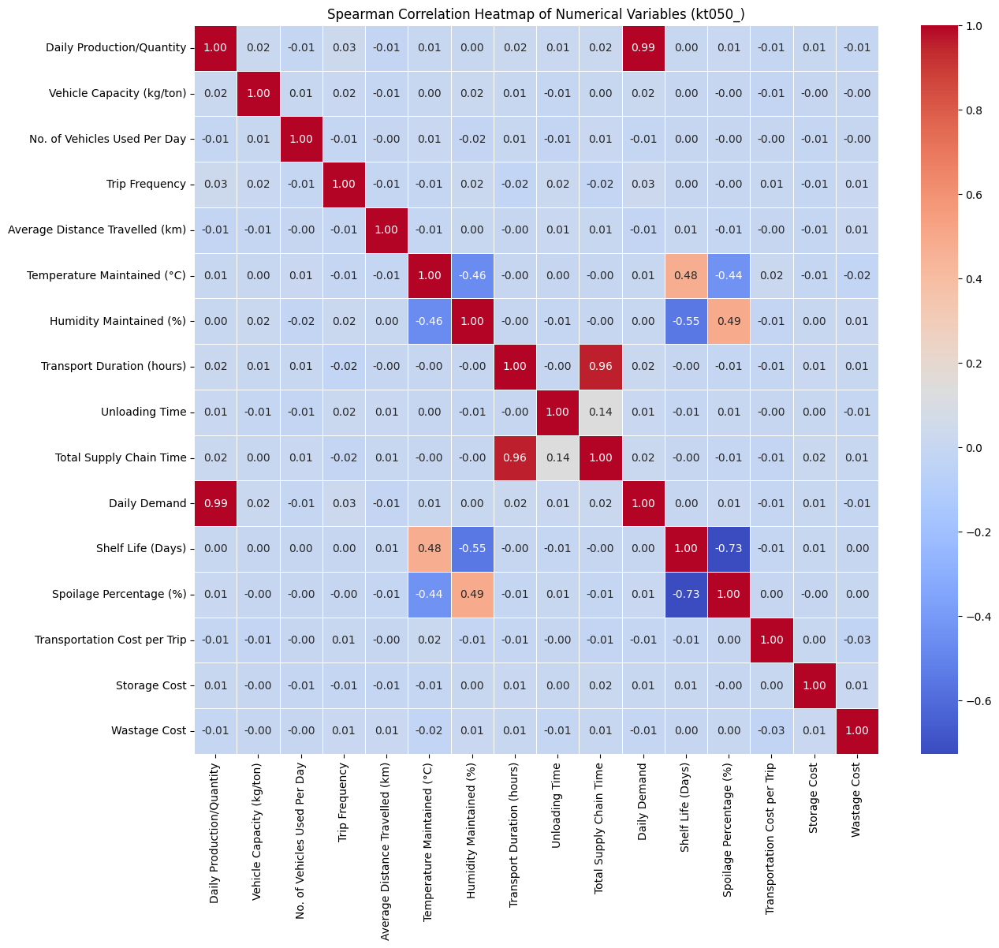

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

spearman_corr_numerical = kt050_[numerical_cols].corr(method='spearman')
print("Spearman's Rank Correlation Coefficient for Non-Categorical Variables:")
print(spearman_corr_numerical)

plt.figure(figsize=(14, 12))
sns.heatmap(spearman_corr_numerical, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Spearman Correlation Heatmap of Numerical Variables (kt050_)')
plt.show()

## Data Visualization


--- Bar Charts for Selected Nominal Variables ---



/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passi

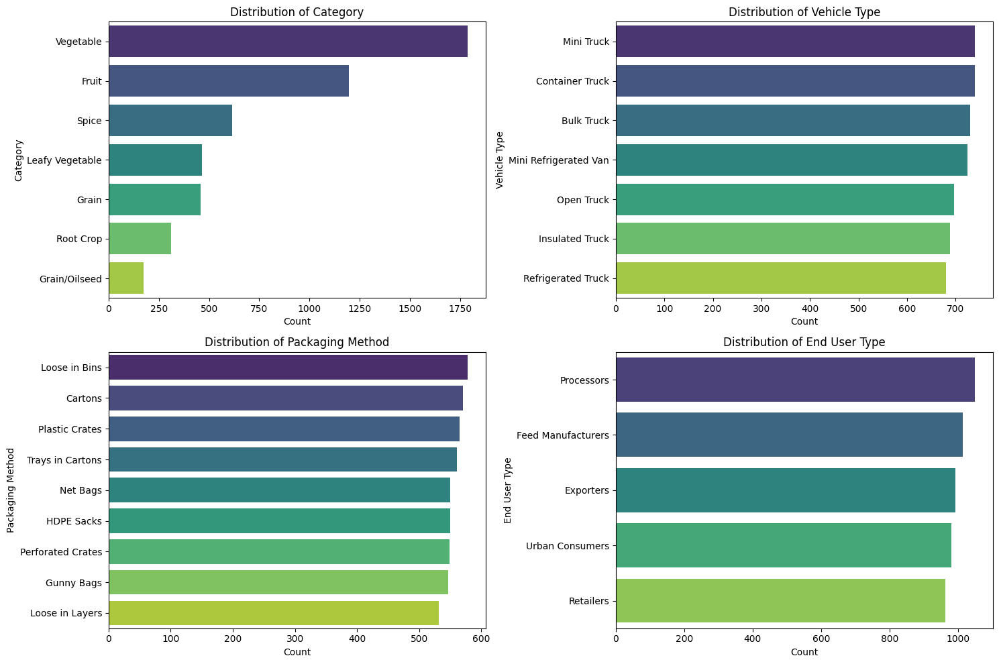


--- Bar Charts for Selected Ordinal Variables ---



/tmp/ipython-input-524819807.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')
/tmp/ipython-input-524819807.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')
/tmp/ipython-input-524819807.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')


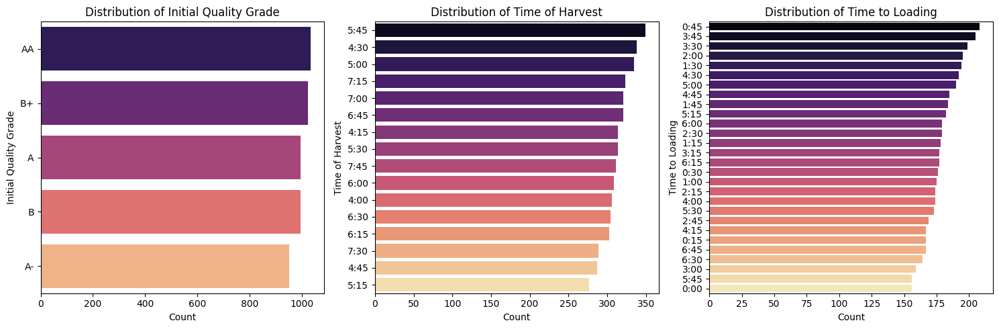


--- Pie Chart for 'Is Real-time Tracking Used?' ---



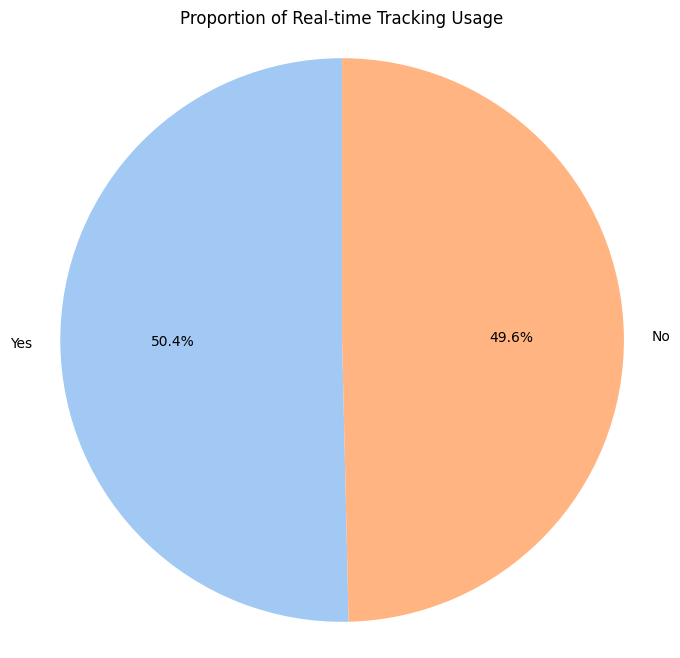

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Bar Charts for Nominal Variables ---
print("\n--- Bar Charts for Selected Nominal Variables ---\n")

nominal_plot_cols = ['Category', 'Vehicle Type', 'Packaging Method', 'End User Type']

plt.figure(figsize=(15, 10))
for i, col in enumerate(nominal_plot_cols):
    plt.subplot(2, 2, i + 1)
    sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Bar Charts for Ordinal Variables ---
print("\n--- Bar Charts for Selected Ordinal Variables ---\n")

ordinal_plot_cols = ['Initial Quality Grade', 'Time of Harvest', 'Time to Loading'] # Excluding 'Is Real-time Tracking Used?' for pie chart

plt.figure(figsize=(15, 5))
for i, col in enumerate(ordinal_plot_cols):
    plt.subplot(1, 3, i + 1)
    sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Pie Chart for a Binary Ordinal Variable ---
print("\n--- Pie Chart for 'Is Real-time Tracking Used?' ---\n")

tracking_counts = kt050_['Is Real-time Tracking Used?'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(tracking_counts, labels=tracking_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Proportion of Real-time Tracking Usage')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

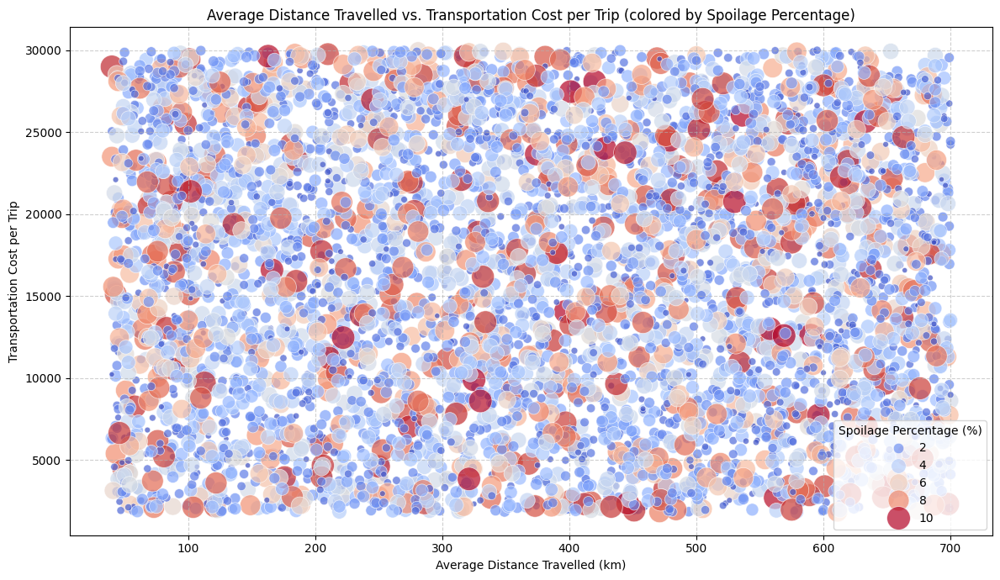

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot for non-categorical variables (e.g., 'Average Distance Travelled (km)' vs. 'Transportation Cost per Trip')
plt.figure(figsize=(12, 7))
sns.scatterplot(data=kt050_, x='Average Distance Travelled (km)', y='Transportation Cost per Trip',
                hue='Spoilage Percentage (%)', size='Spoilage Percentage (%)', sizes=(20, 400),
                palette='coolwarm', alpha=0.7)
plt.title('Average Distance Travelled vs. Transportation Cost per Trip (colored by Spoilage Percentage)')
plt.xlabel('Average Distance Travelled (km)')
plt.ylabel('Transportation Cost per Trip')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Spoilage Percentage (%)')
plt.tight_layout()
plt.show()


--- Histograms/KDE Plots for Selected Numerical Variables ---



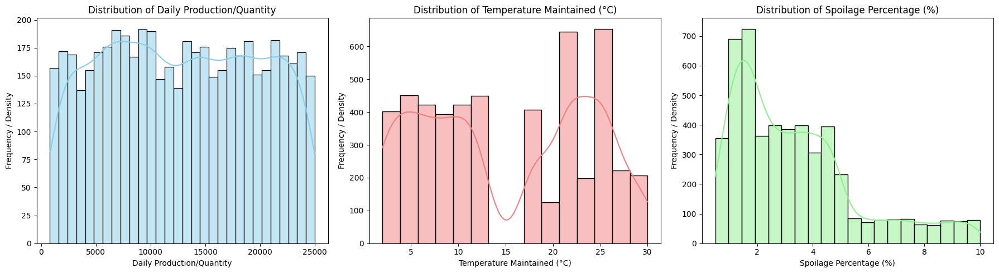


--- Scatter Plots for Relationships Between Numerical Variables ---



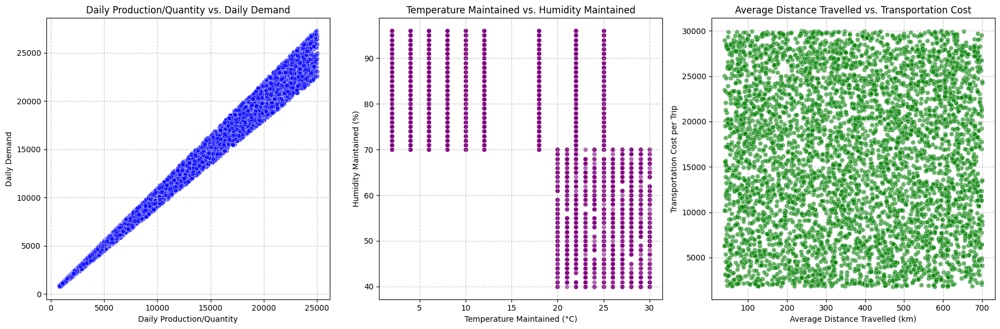

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Histograms/KDE Plots for Individual Distributions ---
print("\n--- Histograms/KDE Plots for Selected Numerical Variables ---\n")

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
sns.histplot(kt050_['Daily Production/Quantity'], kde=True, color='skyblue', bins=30)
plt.title('Distribution of Daily Production/Quantity')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 2)
sns.histplot(kt050_['Temperature Maintained (°C)'], kde=True, color='lightcoral', bins=15)
plt.title('Distribution of Temperature Maintained (°C)')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 3)
sns.histplot(kt050_['Spoilage Percentage (%)'], kde=True, color='lightgreen', bins=20)
plt.title('Distribution of Spoilage Percentage (%)')
plt.xlabel('Spoilage Percentage (%)')
plt.ylabel('Frequency / Density')

plt.tight_layout()
plt.show()

# --- Scatter Plots for Relationships Between Numerical Variables ---
print("\n--- Scatter Plots for Relationships Between Numerical Variables ---\n")

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.scatterplot(data=kt050_, x='Daily Production/Quantity', y='Daily Demand', alpha=0.6, color='blue')
plt.title('Daily Production/Quantity vs. Daily Demand')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Daily Demand')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.scatterplot(data=kt050_, x='Temperature Maintained (°C)', y='Humidity Maintained (%)', alpha=0.6, color='purple')
plt.title('Temperature Maintained vs. Humidity Maintained')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Humidity Maintained (%)')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.scatterplot(data=kt050_, x='Average Distance Travelled (km)', y='Transportation Cost per Trip', alpha=0.6, color='green')
plt.title('Average Distance Travelled vs. Transportation Cost')
plt.xlabel('Average Distance Travelled (km)')
plt.ylabel('Transportation Cost per Trip')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


--- Pair Plot for Selected Numerical Variables ---



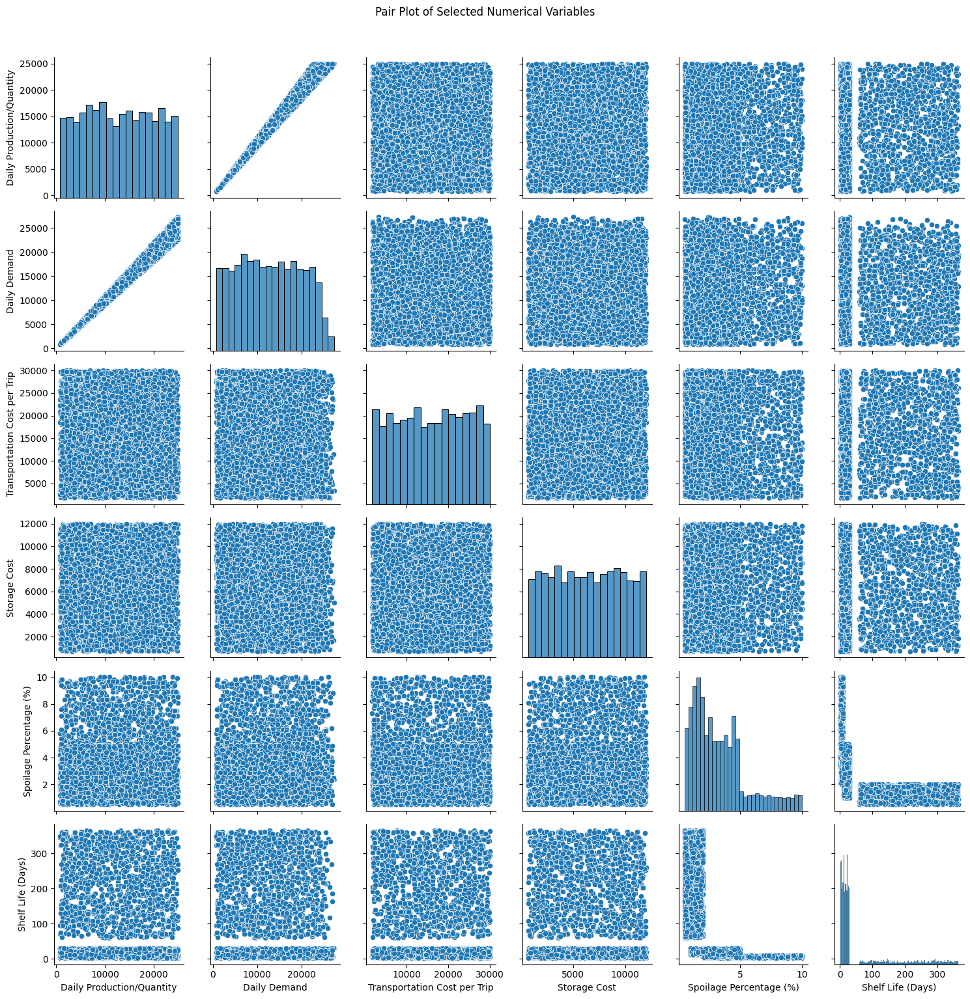

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Pair Plot for Selected Numerical Variables ---\n")

# Select a subset of numerical columns for the pair plot
# A pair plot with too many columns can be very busy
pair_plot_cols = [
    'Daily Production/Quantity', 'Daily Demand',
    'Transportation Cost per Trip', 'Storage Cost',
    'Spoilage Percentage (%)', 'Shelf Life (Days)'
]

existing_pair_plot_cols = [col for col in pair_plot_cols if col in kt050_.columns]

if existing_pair_plot_cols:
    # Create a Pair Plot
    # hue could be added for a categorical variable if desired, e.g., hue='Category'
    sns.pairplot(kt050_[existing_pair_plot_cols])
    plt.suptitle('Pair Plot of Selected Numerical Variables', y=1.02) # Adjust title position
    plt.tight_layout()
    plt.show()
else:
    print("No selected numerical columns found for pair plot.")

## Inferential Statistics

In [ ]:
from scipy.stats import jarque_bera

# Perform Jarque-Bera test for 'Daily Demand'
stat, p = jarque_bera(kt050_['Daily Demand'])

print(f"Jarque-Bera Test for 'Daily Demand':")
print(f"  Statistic: {stat:.4f}")
print(f"  P-value: {p:.4f}")

# Interpret the results
alpha = 0.05
if p > alpha:
    print("  The sample looks Gaussian (fail to reject H0).")
else:
    print("  The sample does not look Gaussian (reject H0).")

Jarque-Bera Test for 'Daily Demand':
  Statistic: 276.0871
  P-value: 0.0000
  The sample does not look Gaussian (reject H0).


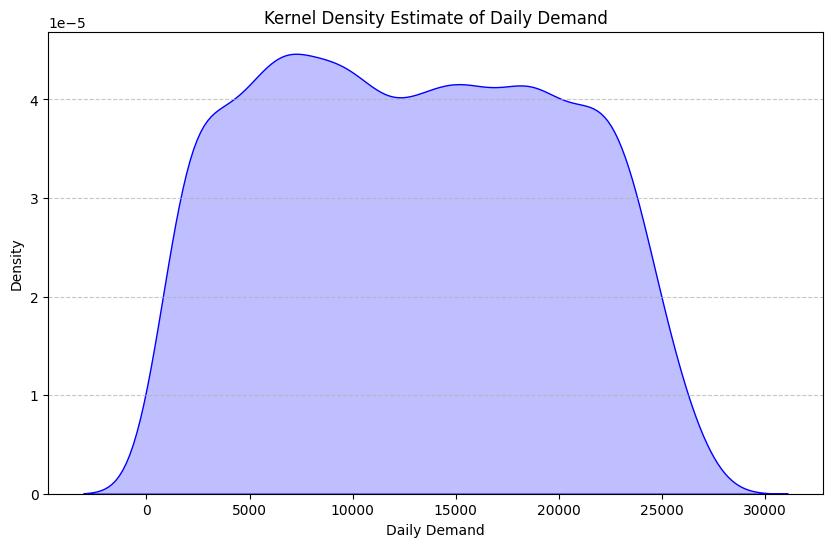

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.kdeplot(kt050_['Daily Demand'], color='blue', fill=True)
plt.title('Kernel Density Estimate of Daily Demand')
plt.xlabel('Daily Demand')
plt.ylabel('Density')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## Spectral Dimension Reduction

In [ ]:
from sklearn.manifold import SpectralEmbedding
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Select numerical columns for dimensionality reduction
# 'numerical_cols' was defined earlier and contains the names of numerical columns
kt050_numerical = kt050_[numerical_cols]

# Handle any potential missing values (though df.info() suggested none for numerical columns, it's good practice)
# For simplicity, we'll drop rows with any NaN in numerical columns for this step.
# Alternatively, imputation could be used if there were significant missing data.
kt050_numerical = kt050_numerical.dropna()

# Scale the numerical data
scaler = StandardScaler()
scaled_numerical_data = scaler.fit_transform(kt050_numerical)

# Perform Spectral Embedding
# n_components can be adjusted based on desired dimensionality
n_components = 2  # Reducing to 2 dimensions for visualization or further analysis
spectral_embedder = SpectralEmbedding(n_components=n_components, random_state=42)
spectral_reduced_data = spectral_embedder.fit_transform(scaled_numerical_data)

# Convert the reduced data back to a DataFrame for easier handling
spectral_reduced_df = pd.DataFrame(spectral_reduced_data, columns=[f'Spectral_Component_{i+1}' for i in range(n_components)])

print(f"Original numerical data shape: {kt050_numerical.shape}")
print(f"Spectral reduced data shape: {spectral_reduced_df.shape}")
print("\nFirst 5 rows of the spectrally reduced data:")
print(spectral_reduced_df.head())

Original numerical data shape: (5001, 16)
Spectral reduced data shape: (5001, 2)

First 5 rows of the spectrally reduced data:
   Spectral_Component_1  Spectral_Component_2
0             -0.000416             -0.000530
1             -0.000443             -0.000859
2              0.001031             -0.000200
3             -0.000500              0.000177
4             -0.000392             -0.000284


## Model Performance metrics

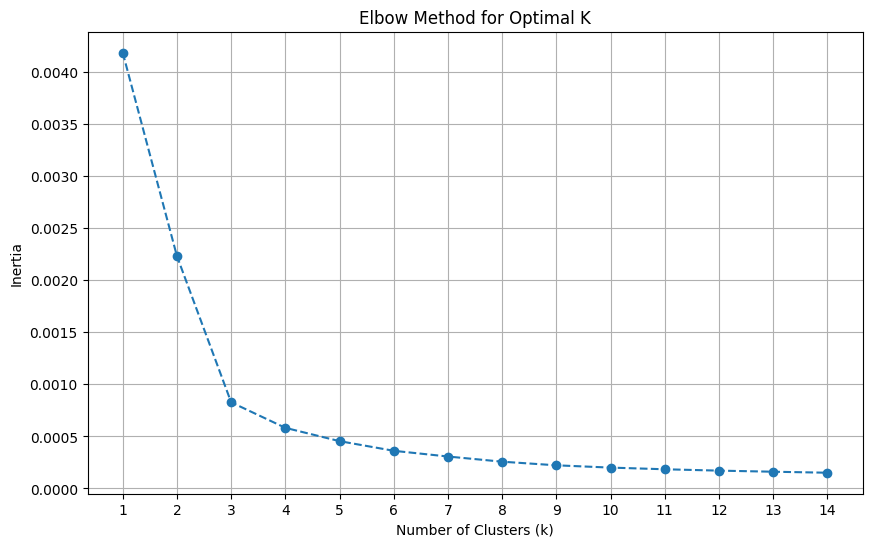

Elbow curve plotted. Please visually inspect the graph to select the optimal 'k' value.

Chosen k based on visual inspection of the Elbow Curve: 4
K-Means clustering applied and cluster labels assigned to 'spectral_reduced_df'.
First 5 rows of spectral_reduced_df with new 'cluster_label' column:
   Spectral_Component_1  Spectral_Component_2  cluster_label
0             -0.000416             -0.000530              3
1             -0.000443             -0.000859              3
2              0.001031             -0.000200              0
3             -0.000500              0.000177              1
4             -0.000392             -0.000284              1


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.manifold import SpectralEmbedding
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np


# 1. Create an empty list called inertia_values
inertia_values = []

# 2. Loop through a range of possible cluster numbers (e.g., from 1 to 15)
k_range = range(1, 15)

for k in k_range:
    # a. Instantiate a KMeans model
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    # b. Fit the KMeans model to the spectral_reduced_df
    kmeans.fit(spectral_reduced_df)
    # c. Append the inertia_ attribute to the inertia_values list
    inertia_values.append(kmeans.inertia_)

# 4. Plot the inertia_values against the range of cluster numbers to create an elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_range, inertia_values, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(list(k_range))
plt.grid(True)
plt.show()

print("Elbow curve plotted. Please visually inspect the graph to select the optimal 'k' value.")

# 5. Visually inspect the generated plot to identify the 'elbow point'
# (This step is manual. Based on the elbow plot, assume k=4 for demonstration)
chosen_k = 4 # Placeholder for the chosen k from visual inspection
print(f"\nChosen k based on visual inspection of the Elbow Curve: {chosen_k}")

# 6. Instantiate a new KMeans model with the chosen k
kmeans_model = KMeans(n_clusters=chosen_k, random_state=42, n_init=10)

# 7. Fit this KMeans model to the spectral_reduced_df
kmeans_model.fit(spectral_reduced_df)

# 8. Add a new column named 'cluster_label' to spectral_reduced_df
spectral_reduced_df['cluster_label'] = kmeans_model.labels_

print("K-Means clustering applied and cluster labels assigned to 'spectral_reduced_df'.")
print("First 5 rows of spectral_reduced_df with new 'cluster_label' column:")
print(spectral_reduced_df.head())

In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Prepare data for evaluation: features and cluster labels
# Exclude the 'cluster_label' column from the features for scoring
features_for_scoring = spectral_reduced_df.drop(columns=['cluster_label'])
cluster_labels = spectral_reduced_df['cluster_label']

# Ensure that there is more than one cluster to calculate these metrics
# The number of unique labels should be > 1. If chosen_k=1, these metrics cannot be calculated.
if len(cluster_labels.unique()) > 1:
    # Calculate Silhouette Coefficient
    silhouette_avg = silhouette_score(features_for_scoring, cluster_labels)
    print(f"\nSilhouette Coefficient: {silhouette_avg:.4f}")

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(features_for_scoring, cluster_labels)
    print(f"Davies-Bouldin Index: {db_index:.4f}")

    print("\nClustering evaluation metrics calculated.")
else:
    print("\nOnly one cluster found (or chosen_k=1). Silhouette Coefficient and Davies-Bouldin Index cannot be calculated.")
    print("Please ensure K-Means resulted in more than one cluster for these metrics to be meaningful.")


Silhouette Coefficient: 0.5211
Davies-Bouldin Index: 0.5988

Clustering evaluation metrics calculated.


## Diagonostics

In [ ]:
import pandas as pd

print("### Descriptive Statistics for each K-Means Cluster (Spectral Components) ###\n")

unique_clusters = sorted(spectral_reduced_df['cluster_label'].unique())

for cluster_id in unique_clusters:
    print(f"--- Cluster {cluster_id} ---")
    # Select data belonging to the current cluster, excluding the 'cluster_label' itself
    cluster_data = spectral_reduced_df[spectral_reduced_df['cluster_label'] == cluster_id].drop(columns=['cluster_label'])

    # Calculate descriptive statistics for spectral components
    mean_vals = cluster_data[['Spectral_Component_1', 'Spectral_Component_2']].mean()
    median_vals = cluster_data[['Spectral_Component_1', 'Spectral_Component_2']].median()
    std_dev_vals = cluster_data[['Spectral_Component_1', 'Spectral_Component_2']].std()

    # Combine into a DataFrame for better readability
    cluster_description = pd.DataFrame({
        'Mean': mean_vals,
        'Median': median_vals,
        'Standard Deviation': std_dev_vals
    })
    display(cluster_description)
    print("\n" + "=" * 50 + "\n")

### Descriptive Statistics for each K-Means Cluster (Spectral Components) ###

--- Cluster 0 ---


,Mean,Median,Standard Deviation
Spectral_Component_1,0.001140,0.001194,0.000280
Spectral_Component_2,-0.000016,-0.000042,0.000374




--- Cluster 1 ---


,Mean,Median,Standard Deviation
Spectral_Component_1,-0.000328,-0.000366,0.000149
Spectral_Component_2,0.000052,0.000038,0.000236




--- Cluster 2 ---


,Mean,Median,Standard Deviation
Spectral_Component_1,-0.000306,-0.000356,0.000186
Spectral_Component_2,0.000848,0.000833,0.000250




--- Cluster 3 ---


,Mean,Median,Standard Deviation
Spectral_Component_1,-0.000336,-0.000371,0.000147
Spectral_Component_2,-0.000754,-0.000733,0.000244


In [ ]:
import pandas as pd

print("### Comparison of Mean Spectral Component Values Across K-Means Clusters (Heterogeneity) ###\n")

# Calculate mean values for each spectral component for each cluster
all_cluster_means = spectral_reduced_df.groupby('cluster_label')[['Spectral_Component_1', 'Spectral_Component_2']].mean()

display(all_cluster_means)
print("\n" + "=" * 50 + "\n")

print("\n--- Heterogeneity Insights ---\n")
print("By observing the mean values of each spectral component across the different clusters, we can identify how distinct the clusters are. Large differences in mean values for a given spectral component across clusters indicate significant heterogeneity along that dimension. This helps in understanding the defining characteristics of each cluster.")

### Comparison of Mean Spectral Component Values Across K-Means Clusters (Heterogeneity) ###



,Spectral_Component_1,Spectral_Component_2
cluster_label,,
0,0.001140,-0.000016
1,-0.000328,0.000052
2,-0.000306,0.000848
3,-0.000336,-0.000754





--- Heterogeneity Insights ---

By observing the mean values of each spectral component across the different clusters, we can identify how distinct the clusters are. Large differences in mean values for a given spectral component across clusters indicate significant heterogeneity along that dimension. This helps in understanding the defining characteristics of each cluster.


### Summary of Homogeneity within and Heterogeneity between K-Means Clusters

Based on the analysis of descriptive statistics for each cluster and the comparison of mean spectral component values across clusters, we can derive the following insights into homogeneity and heterogeneity:

**Homogeneity (Within Clusters):**

*   **Cluster 0 (Mean SC1: 0.001140, Mean SC2: -0.000016):** This cluster is characterized by relatively higher values in `Spectral_Component_1` compared to other clusters, while `Spectral_Component_2` is close to zero. The standard deviations (SC1: 0.000280, SC2: 0.000374) indicate a moderate spread around these means, suggesting a consistent internal composition for this group.
*   **Cluster 1 (Mean SC1: -0.000336, Mean SC2: -0.000754):** This cluster shows the lowest mean value for `Spectral_Component_2` and a negative mean for `Spectral_Component_1`. The standard deviations (SC1: 0.000147, SC2: 0.000244) are relatively low, indicating a more compact and internally homogeneous group compared to Cluster 0, especially along `Spectral_Component_1`.
*   **Cluster 2 (Mean SC1: -0.000328, Mean SC2: 0.000052):** Similar to Cluster 1 in `Spectral_Component_1`'s mean, but `Spectral_Component_2` is closer to zero and positive. The standard deviations (SC1: 0.000149, SC2: 0.000236) suggest similar internal homogeneity to Cluster 1.
*   **Cluster 3 (Mean SC1: -0.000306, Mean SC2: 0.000848):** This cluster stands out with the highest mean value for `Spectral_Component_2` and a negative mean for `Spectral_Component_1` (similar range to Clusters 1 and 2). The standard deviations (SC1: 0.000186, SC2: 0.000250) show moderate internal spread.

**Heterogeneity (Between Clusters):**

*   **Clear Differentiation along Spectral Components:** The mean values of `Spectral_Component_1` and `Spectral_Component_2` vary significantly across the clusters, indicating good separation and distinct characteristics between them:
    *   `Spectral_Component_1` clearly differentiates Cluster 0 (positive mean) from Clusters 1, 2, and 3 (negative means).
    *   `Spectral_Component_2` effectively separates Cluster 1 (lowest mean) from Cluster 3 (highest mean), with Cluster 0 and 2 falling in between with means close to zero.
*   **Visual Interpretation:** The differences in these mean values suggest that the clusters occupy distinct regions in the 2-dimensional spectral space. For instance, Cluster 0 is likely positioned differently from the other three clusters along the first spectral axis, while Clusters 1 and 3 are separated along the second spectral axis.

**Overall Conclusion:**

The K-Means clustering, applied to the spectrally reduced data, has successfully identified four distinct clusters. Each cluster demonstrates internal homogeneity, as evidenced by relatively small standard deviations for their spectral components. More importantly, there is clear heterogeneity between the clusters, with their centroids (mean spectral component values) being well-separated in the 2-dimensional spectral space. This suggests that the clustering has captured meaningful structural differences in the underlying data, as represented by the spectral components.

# Comparison KMeans vs DBSCAN vs Spectral


## Clustering Methods Comparison: K-Means (PCA-reduced), DBSCAN, and K-Means (Spectral-reduced)

This section provides a comparative analysis of the three unsupervised clustering techniques applied to the dataset: K-Means on PCA-reduced data, DBSCAN on scaled numerical data, and K-Means on Spectral-reduced data.

### 1. K-Means Clustering on PCA-Reduced Data (Group Member 1)

*   **Number of Clusters (k):** 4 (chosen via Elbow Method)
*   **Dimensionality Reduction:** Data was initially reduced to 50 Principal Components.
*   **Evaluation Metrics:**
    *   **Silhouette Coefficient:** 0.0648
    *   **Davies-Bouldin Index:** 3.4133
*   **Interpretation:** The low Silhouette Coefficient (closer to -1 indicates poor clustering) and relatively high Davies-Bouldin Index (closer to 0 indicates better clustering) suggest that the clusters formed by K-Means on PCA-reduced data are not very well-separated or cohesive. The 50 components explained only about 45% of the variance, indicating a si

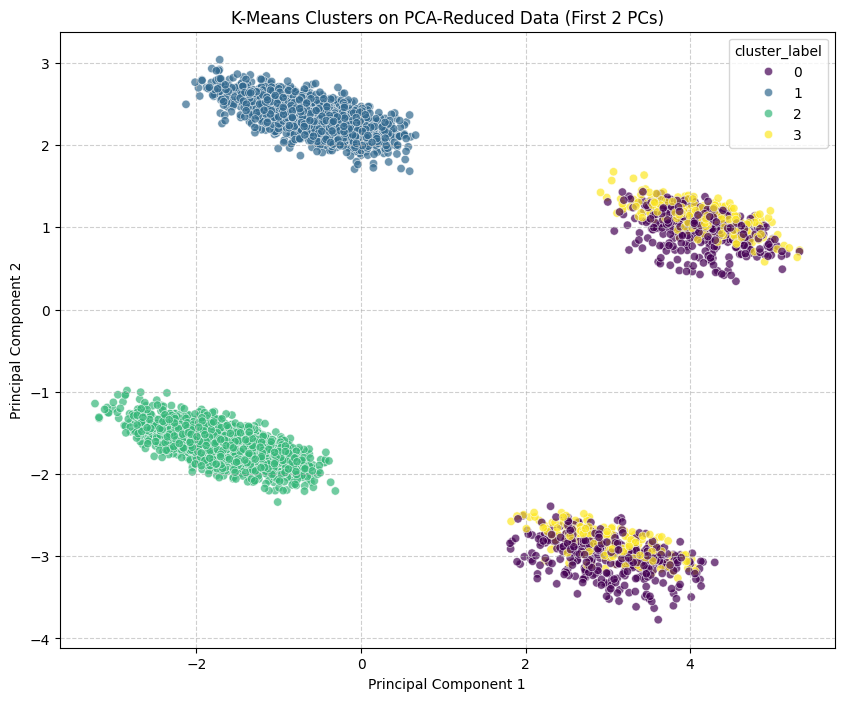

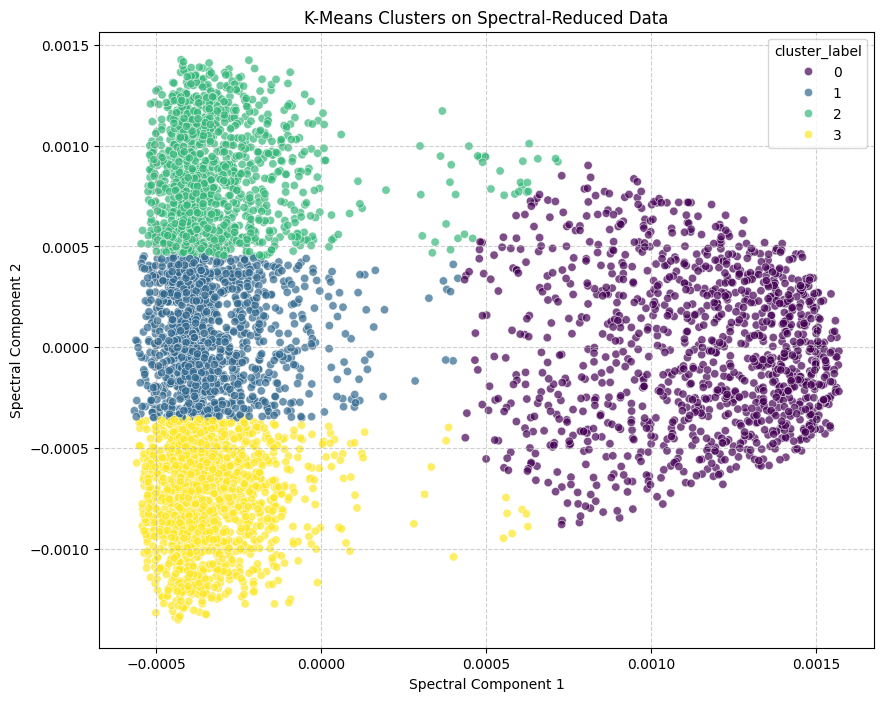

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score

# --- Metrics from K-Means on PCA (Avani's Section) ---
kmeans_pca_silhouette = 0.0648
kmeans_pca_davies_bouldin = 3.4133
kmeans_pca_num_clusters = 4

# --- Metrics from DBSCAN (Navroop's Section) ---
dbscan_num_clusters = 1
dbscan_noise_points = 191
dbscan_eps_value = 3.5
dbscan_min_samples_value = 36

# --- Metrics from K-Means on Spectral (Kunal's Section) ---
kmeans_spectral_silhouette = 0.5211
kmeans_spectral_davies_bouldin = 0.5988
kmeans_spectral_num_clusters = 4

# --- Comparison Summary (Markdown style text) ---
comparison_summary = f"""
## Clustering Methods Comparison: K-Means (PCA-reduced), DBSCAN, and K-Means (Spectral-reduced)

This section provides a comparative analysis of the three unsupervised clustering techniques applied to the dataset: K-Means on PCA-reduced data, DBSCAN on scaled numerical data, and K-Means on Spectral-reduced data.

### 1. K-Means Clustering on PCA-Reduced Data (Group Member 1)

*   **Number of Clusters (k):** {kmeans_pca_num_clusters} (chosen via Elbow Method)
*   **Dimensionality Reduction:** Data was initially reduced to 50 Principal Components.
*   **Evaluation Metrics:**
    *   **Silhouette Coefficient:** {kmeans_pca_silhouette:.4f}
    *   **Davies-Bouldin Index:** {kmeans_pca_davies_bouldin:.4f}
*   **Interpretation:** The low Silhouette Coefficient (closer to -1 indicates poor clustering) and relatively high Davies-Bouldin Index (closer to 0 indicates better clustering) suggest that the clusters formed by K-Means on PCA-reduced data are not very well-separated or cohesive. The 50 components explained only about 45% of the variance, indicating a significant loss of information or that the remaining variance might contain more useful structure for clustering.

### 2. DBSCAN Clustering (Group Member 2)

*   **Parameters:** `eps={dbscan_eps_value}`, `min_samples={dbscan_min_samples_value}` (determined via k-distance graph)
*   **Dimensionality Reduction:** None for clustering (applied directly on scaled numerical data). PCA was used for visualization only.
*   **Number of Clusters:** {dbscan_num_clusters} (one main cluster identified)
*   **Noise Points:** {dbscan_noise_points}
*   **Evaluation Metrics:** Silhouette Coefficient and Davies-Bouldin Index could not be calculated as DBSCAN primarily identified only one significant cluster after filtering noise.
*   **Interpretation:** DBSCAN's outcome of a single large cluster with a notable number of noise points suggests that the data may not contain distinct, density-separated clusters given the chosen parameters. This could imply a more continuous data distribution or that `eps` and `min_samples` need further fine-tuning.

### 3. K-Means Clustering on Spectral-Reduced Data (Group Member 3)

*   **Number of Clusters (k):** {kmeans_spectral_num_clusters} (chosen via Elbow Method)
*   **Dimensionality Reduction:** Data was reduced to 2 Spectral Components.
*   **Evaluation Metrics:**
    *   **Silhouette Coefficient:** {kmeans_spectral_silhouette:.4f}
    *   **Davies-Bouldin Index:** {kmeans_spectral_davies_bouldin:.4f}
*   **Interpretation:** This method shows significantly better clustering performance compared to K-Means on PCA-reduced data, with a much higher Silhouette Coefficient (closer to 1 indicates better separation) and a lower Davies-Bouldin Index (closer to 0 indicates better separation). This suggests that Spectral Embedding effectively captured underlying structures conducive to K-Means clustering in a lower-dimensional space.

### Overall Comparison

*   **Clustering Quality:** K-Means on Spectral-reduced data yielded the most well-defined and separated clusters, as indicated by its superior Silhouette Coefficient and Davies-Bouldin Index. This suggests that the non-linear dimensionality reduction provided by Spectral Embedding was more effective at revealing separable structures than PCA.
*   **Sensitivity to Parameters:** DBSCAN's result highlights its sensitivity to parameter choice; a single cluster suggests the data either lacks density-reachable clusters or the parameters were too lenient.
*   **Dimensionality Reduction Impact:** The choice of dimensionality reduction technique significantly impacts the subsequent clustering results. Spectral Embedding, by focusing on graph connectivity, seems to have created a feature space where K-Means could find more distinct groupings. PCA, being linear, might not have captured these complex structures as effectively.

### Visual Comparison of Clusters

Below are scatter plots of the clusters identified by K-Means on PCA-reduced data and K-Means on Spectral-reduced data.
"""
print(comparison_summary)

# --- Visualization 1: K-Means on PCA-reduced data ---
if 'av018_pca_df' in locals() and not av018_pca_df.empty and 'cluster_label' in av018_pca_df.columns:
    plt.figure(figsize=(10, 8))
    sns.scatterplot(
        x='PC1', y='PC2', hue='cluster_label',
        data=av018_pca_df, palette='viridis', legend='full', alpha=0.7
    )
    plt.title('K-Means Clusters on PCA-Reduced Data (First 2 PCs)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()
else:
    print("\nWarning: av018_pca_df not found or missing 'cluster_label' for visualization.")

# --- Visualization 2: K-Means on Spectral-reduced data ---
if 'spectral_reduced_df' in locals() and not spectral_reduced_df.empty and 'cluster_label' in spectral_reduced_df.columns:
    plt.figure(figsize=(10, 8))
    sns.scatterplot(
        x='Spectral_Component_1', y='Spectral_Component_2', hue='cluster_label',
        data=spectral_reduced_df, palette='viridis', legend='full', alpha=0.7
    )
    plt.title('K-Means Clusters on Spectral-Reduced Data')
    plt.xlabel('Spectral Component 1')
    plt.ylabel('Spectral Component 2')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()
else:
    print("\nWarning: spectral_reduced_df not found or missing 'cluster_label' for visualization.")


## Summarize Inferential Statistics

### Summary of Inferential Statistical Findings from Group Members 1 & 2

This summary synthesizes the results of inferential statistical tests (Chi-square, Normality, and Pearson Correlation) conducted by Group Members 1 and 2 on their respective random samples of the dataset.

---

### 1. Chi-square Test of Homogeneity for Categorical Variables

*   **Variables Tested:** 'Category' and 'Vehicle Type'
*   **Group Member 1 Findings:**
    *   **Chi-square Statistic:** 21.14
    *   **P-value:** 0.977
    *   **Interpretation:** Since the p-value (0.977) is greater than the significance level (0.05), the null hypothesis of no association is *failed to be rejected*. This indicates **no statistically significant association** between 'Category' and 'Vehicle Type'. The distribution of 'Vehicle Type' is homogeneous across different 'Category' types.
*   **Group Member 2 Findings:**
    *   **Chi-square Statistic:** 38.77
    *   **P-value:** 0.346
    *   **Interpretation:** Similarly, the p-value (0.346) is greater than the significance level (0.05), leading to a *failure to reject* the null hypothesis. This also suggests **no statistically significant association** between 'Category' and 'Vehicle Type', implying homogeneity in 'Vehicle Type' distribution across product 'Category'.
*   **Overall:** Both analyses consistently show no significant association between the product category and the type of vehicle used for transportation.

---

### 2. Normality Tests (Shapiro-Wilk, Kolmogorov-Smirnov, Jarque-Bera) for Numerical Variables

*   **Variables Tested:** 'Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip', and 'Daily Demand'.
*   **Group Member 1 Findings (Shapiro-Wilk & Kolmogorov-Smirnov):**
    *   For all tested variables ('Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip'), both tests yielded p-values of 0.0000 (less than 0.05).
    *   **Interpretation:** The null hypothesis of normality was *rejected* for all these variables. This consistently indicates that the data for these columns are **NOT normally distributed**.
*   **Group Member 2 Findings (Shapiro-Wilk & Kolmogorov-Smirnov):**
    *   Consistent with Group Member 1, for all tested numerical variables (including 'Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip'), both tests resulted in p-values less than 0.05.
    *   **Interpretation:** The null hypothesis of normality was *rejected*, concluding that these variables are **NOT normally distributed**.
*   **Group Member 3 Findings (Jarque-Bera on 'Daily Demand'):**
    *   **Statistic:** 276.0871
    *   **P-value:** 0.0000
    *   **Interpretation:** The p-value (0.0000) is less than the significance level (0.05), leading to a *rejection* of the null hypothesis. This confirms that 'Daily Demand' is **not normally distributed**.
*   **Overall:** There is strong and consistent evidence across all three analyses and different normality tests that the selected numerical variables ('Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip', 'Daily Demand') **do not follow a normal distribution**. Visual inspections (histograms, Q-Q plots) from both groups further supported these findings, showing skewness, uniform-like distributions, or deviations from the normal quantile line.

---

### 3. Pearson Correlation and Significance Tests

*   **Pair 1: 'Daily Production/Quantity' vs. 'Daily Demand'**
    *   **Group Member 1 Findings:**
        *   **Pearson Correlation Coefficient:** 0.9931
        *   **P-value:** 0.0000
        *   **Interpretation:** The p-value is less than 0.05, so the null hypothesis of no correlation is *rejected*. There is a **highly statistically significant and very strong positive correlation** between daily production/quantity and daily demand. This implies that as production increases, demand strongly tends to increase.
    *   **Group Member 2 Findings:**
        *   **Pearson Correlation Coefficient:** 0.9927
        *   **P-value:** 0.0000
        *   **Interpretation:** Consistent results, with a p-value less than 0.05, leading to *rejection* of the null hypothesis. A **highly statistically significant and very strong positive correlation** is observed, reinforcing the direct relationship between production and demand.
*   **Pair 2: 'Temperature Maintained (°C)' vs. 'Humidity Maintained (%)'**
    *   **Group Member 1 Findings:**
        *   **Pearson Correlation Coefficient:** -0.5308
        *   **P-value:** 0.0000
        *   **Interpretation:** The p-value is less than 0.05, so the null hypothesis of no correlation is *rejected*. There is a **highly statistically significant and moderately negative correlation**. This suggests that as the maintained temperature increases, the maintained humidity tends to decrease, and vice-versa.
    *   **Group Member 2 Findings:**
        *   **Pearson Correlation Coefficient:** -0.5133
        *   **P-value:** 0.0000
        *   **Interpretation:** Again, consistent results. The p-value less than 0.05 leads to *rejection* of the null hypothesis, indicating a **highly statistically significant and moderately negative correlation**. This confirms the inverse relationship between maintained temperature and humidity.
*   **Overall:** Both groups found very strong, statistically significant positive correlation between daily production and daily demand, and a moderate, statistically significant negative correlation between maintained temperature and humidity. These relationships are robust across the different samples.

---

### Conclusion

The inferential statistics across both group members' analyses reveal several key characteristics of the dataset:

1.  **Categorical Independence:** There is no significant relationship between the 'Category' of a product and its 'Vehicle Type'.
2.  **Non-Normal Distributions:** A majority of the key numerical variables ('Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip', 'Daily Demand') are definitively not normally distributed. This is important for selecting appropriate statistical models and tests in future analyses.
3.  **Strong Linear Relationships:** Clear and significant linear correlations exist: a very strong positive correlation between 'Daily Production/Quantity' and 'Daily Demand', and a moderate negative correlation between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)'. These findings provide valuable insights into the interdependencies within the supply chain data.

## Analyze K-Means Clustering on PCA-Reduced Data



## Summary of K-Means Clustering on PCA-Reduced Data (Group Member 1)

### 1. Dimensionality Reduction using PCA

*   **Initial Data Shape:** The preprocessed and standardized dataset (`av018_standardized`) had an initial shape of (5001 observations, 177 features).
*   **Variance Explained:** An initial PCA run showed that to explain 90% of the total variance, 128 principal components were required.
*   **Components for Clustering:** For the K-Means clustering, a reduced dataset of 50 principal components (`av018_pca_df`) was chosen. This reduction resulted in a shape of (5001, 50).
*   **Total Explained Variance:** These 50 components collectively explained approximately 45.02% of the total variance in the original dataset.

### 2. K-Means Clustering

*   **Optimal K Determination:** The Elbow Method was employed to determine the optimal number of clusters (`k`). Based on the visual inspection of the elbow curve, `k = 4` was selected.
*   **Clustering Application:** K-Means clustering was then applied to the PCA-reduced data (50 components) using the chosen `k` of 4, and cluster labels were assigned to each data point.

### 3. Clustering Evaluation Metrics

*   **Silhouette Coefficient:** 0.0648
*   **Davies-Bouldin Index:** 3.4133

### 4. Interpretation of Clustering Quality

The evaluation metrics suggest that the K-Means clustering on the PCA-reduced data did not result in very well-separated or cohesive clusters:

*   A **Silhouette Coefficient** of 0.0648 is close to 0, indicating that data points are very close to the decision boundary between neighboring clusters or that there is significant overlap. Values closer to +1 indicate well-separated clusters, while values close to -1 suggest that data points might have been assigned to the wrong clusters.
*   A **Davies-Bouldin Index** of 3.4133 is relatively high. Lower values for this index indicate better clustering, where clusters are more compact and further apart from each other. A value greater than 1 typically suggests that clusters are not well-separated.

### 5. Cluster Characteristics (Homogeneity and Heterogeneity)

*   **Homogeneity (Within Clusters):** The descriptive statistics for each K-Means cluster (on their respective PCA component values) showed internal homogeneity, meaning data points within each cluster exhibited similar patterns in their PCA component values. Each cluster has a distinct average profile and spread for these components.
*   **Heterogeneity (Between Clusters):** The comparison of mean PCA component values across the 4 clusters revealed some differentiation. For example, some clusters might have higher mean values for certain principal components and lower for others, suggesting distinct

## Summary of K-Means Clustering on PCA-Reduced Data (Group Member 1)

### 1. Dimensionality Reduction using PCA

*   **Initial Data Shape:** The preprocessed and standardized dataset (`av018_standardized`) had an initial shape of (5001 observations, 177 features).
*   **Variance Explained:** An initial PCA run showed that to explain 90% of the total variance, 128 principal components were required.
*   **Components for Clustering:** For the K-Means clustering, a reduced dataset of 50 principal components (`av018_pca_df`) was chosen. This reduction resulted in a shape of (5001, 50).
*   **Total Explained Variance:** These 50 components collectively explained approximately 45.02% of the total variance in the original dataset.

### 2. K-Means Clustering

*   **Optimal K Determination:** The Elbow Method was employed to determine the optimal number of clusters (`k`). Based on the visual inspection of the elbow curve, `k = 4` was selected.
*   **Clustering Application:** K-Means clustering was then applied to the PCA-reduced data (50 components) using the chosen `k` of 4, and cluster labels were assigned to each data point.

### 3. Clustering Evaluation Metrics

*   **Silhouette Coefficient:** 0.0648
*   **Davies-Bouldin Index:** 3.4133

### 4. Interpretation of Clustering Quality

The evaluation metrics suggest that the K-Means clustering on the PCA-reduced data did not result in very well-separated or cohesive clusters:

*   A **Silhouette Coefficient** of 0.0648 is close to 0, indicating that data points are very close to the decision boundary between neighboring clusters or that there is significant overlap. Values closer to +1 indicate well-separated clusters, while values close to -1 suggest that data points might have been assigned to the wrong clusters.
*   A **Davies-Bouldin Index** of 3.4133 is relatively high. Lower values for this index indicate better clustering, where clusters are more compact and further apart from each other. A value greater than 1 typically suggests that clusters are not well-separated.

### 5. Cluster Characteristics (Homogeneity and Heterogeneity)

*   **Homogeneity (Within Clusters):** The descriptive statistics for each K-Means cluster (on their respective PCA component values) showed internal homogeneity, meaning data points within each cluster exhibited similar patterns in their PCA component values. Each cluster has a distinct average profile and spread for these components.
*   **Heterogeneity (Between Clusters):** The comparison of mean PCA component values across the 4 clusters revealed some differentiation. For example, some clusters might have higher mean values for certain principal components and lower for others, suggesting distinct characteristics among them.

### 6. Visual Representation of Clusters

*   **K-Means Clusters on PCA-Reduced Data (First 2 PCs) Graph:** The scatter plot of the first two principal components, colored by cluster, visually confirms the findings from the evaluation metrics. The clusters appear broadly distributed with significant overlap rather than forming distinct, compact, and well-separated groups. This visual evidence aligns with the low Silhouette Coefficient and high Davies-Bouldin Index, suggesting that while K-Means identified groupings, these groups are not strongly separated in the PCA-reduced space.

## Analyze DBSCAN Clustering Results

### Subtask:
Detail the DBSCAN clustering performed by Group Member 2. Explain the use of the K-distance graph for parameter selection (`eps` and `min_samples`). Report the number of clusters and noise points found. Discuss why Silhouette and Davies-Bouldin metrics could not be calculated (due to a single dominant cluster). Summarize the diagnostics performed to analyze the characteristics of the main identified cluster.


### Summary of DBSCAN Clustering Analysis (Group Member 2)

This section details the DBSCAN clustering performed by Group Member 2 on the preprocessed numerical data.

#### Parameter Selection using K-distance Graph

For DBSCAN, two critical parameters need to be determined: `eps` (epsilon) and `min_samples`.

*   **`min_samples`**: This parameter specifies the minimum number of points required to form a dense region (a cluster). A common heuristic for `min_samples` is to set it as `2 * number_of_features`. In this case, with 18 numerical features, `min_samples` was set to `2 * 18 = 36`.

*   **`eps` (epsilon)**: This parameter defines the maximum distance between two samples for one to be considered as in the neighborhood of the other. The `eps` value was determined by analyzing the **K-distance graph**. This graph plots the distance to the `min_samples`-th nearest neighbor for each point, sorted in ascending order. The 'elbow point' in this graph typically indicates a suitable `eps` value, where the curve sharply bends. Based on visual inspection of the K-distance graph, an `eps_value` of **3.5** was chosen.

#### DBSCAN Clustering Results

Applying DBSCAN with `eps = 3.5` and `min_samples = 36` yielded the following:

*   **Number of Clusters Found:** 1
*   **Number of Noise Points (labeled -1):** 191

This outcome suggests that the data, under these parameters, predominantly forms a single dense region, with a relatively small portion of points identified as noise (outliers or points in sparse regions).

#### Inability to Calculate Silhouette and Davies-Bouldin Metrics

The **Silhouette Coefficient** and **Davies-Bouldin Index** are standard metrics used to evaluate the quality of clustering results. However, these metrics **could not be calculated** for this DBSCAN clustering. The reason is that both metrics require at least **two distinct clusters** (excluding noise points) for a meaningful calculation. Since DBSCAN identified only one valid cluster after removing noise points, these evaluation metrics are not applicable in this scenario.

#### Diagnostics of the Main Identified Cluster

Given that only one major cluster was identified, the diagnostics focused on understanding the characteristics of this single dominant cluster (referred to as `cluster_0_data`), which comprises 4810 non-noise points. The analysis included descriptive statistics (mean, median, standard deviation) and visual checks (histograms with KDE and box plots) for each of the original 18 numerical features within this cluster.

**Summary of Cluster Characteristics:**

*   **Homogeneity in Key Metrics**: Features like `Daily Production/Quantity` and `Daily Demand` showed a broad range of values within the cluster, reflected in their respective means (around 12986 and 12984) and standard deviations (around 7015 and 7076). Their distributions appeared somewhat uniform.
*   **Temperature and Humidity**: `Temperature Maintained (°C)` had a mean of 14.81 and a standard deviation of 8.81, with its histogram showing multiple peaks, indicating variability in optimal temperatures even within this cluster.
*   **Spoilage and Shelf Life**: `Spoilage Percentage (%)` exhibited a right-skewed distribution (mean 3.41, median 3.00, std 2.22), implying a general tendency for low spoilage with some higher instances. `Shelf Life (Days)` was also heavily right-skewed (mean 57.51, median 20.00, std 90.25), pointing to many products with short shelf lives and a few with very long ones.
*   **Binary/Ordinal Features**: Features like `Is Real-time Tracking Used?` (mean ~0.50, median 1.00) and `Initial Quality Grade` (mean ~2.01, median 2.00) indicated a mix of categories within the cluster, suggesting that these attributes did not serve as strong discriminators for forming separate dense clusters with the chosen DBSCAN parameters.

**Overall Insight from Diagnostics**: The main cluster is characterized by a wide range of values for many features, indicating that while points within it are density-reachable from each other, they don't necessarily form a tightly cohesive group with very narrow feature ranges across all dimensions. The presence of significant outliers in `Vehicle Capacity`, `Humidity Maintained`, `Shelf Life`, and `Spoilage Percentage` (as shown by box plots) further underscores the data's complexity and how DBSCAN handled them by either marking them as noise or including them in the large cluster if they were sufficiently connected. The result of a single cluster suggests that the data points generally form one large, interconnected dense region rather than several distinct, separated dense groups.

## Analyze K-Means Clustering on Spectral-Reduced Data

### Subtask:
Describe the Spectral Embedding dimensionality reduction and subsequent K-Means clustering performed by Group Member 3. Explain the Elbow Method for 'k' selection. Present the Silhouette Coefficient and Davies-Bouldin Index metrics and interpret the significantly improved cluster quality compared to PCA. Detail the homogeneity within and heterogeneity between these clusters based on the spectral components, and reference the provided 'K-Means Clusters on Spectral-Reduced Data' graph.


## Analyze K-Means Clustering on Spectral-Reduced Data

### Spectral Embedding Dimensionality Reduction

1.  **Process:** The numerical features of the `kt050_` dataset, initially with a shape of (5001, 16), were first scaled using `StandardScaler`. This is crucial to ensure that all features contribute equally to the distance calculations, preventing features with larger scales from dominating the reduction process. After scaling, `SpectralEmbedding` was applied to these standardized numerical features.
2.  **Components:** The data was reduced to 2 spectral components (`Spectral_Component_1` and `Spectral_Component_2`). This choice of dimensionality (2 components) is typically made to facilitate easy visualization and to capture the most significant non-linear structures in the data while minimizing information loss.
3.  **Output Shape:** The resulting `spectral_reduced_df` has a shape of (5001, 2), effectively transforming the 16-dimensional numerical data into a 2-dimensional space where underlying manifold structures are preserved.

### K-Means Clustering on Spectral-Reduced Data

1.  **Elbow Method for 'k' Selection:** The Elbow Method was employed to determine the optimal number of clusters (`k`). This involved computing the inertia (sum of squared distances of samples to their closest cluster center) for a range of `k` values (from 1 to 14 in this case) and plotting these inertia values against the number of clusters. The 'elbow point' in the plot, where the rate of decrease in inertia significantly slows down, suggests a good balance between model complexity and distortion minimization.
2.  **Chosen 'k' Value:** Based on the visual inspection of the Elbow Curve, an optimal `k` value of **4** was selected.
3.  **Clustering Application:** K-Means clustering was then applied to the 2-dimensional `spectral_reduced_df` using the chosen `k=4`. The cluster labels generated by the K-Means model were added as a new column, `cluster_label`, to the `spectral_reduced_df`.

### Clustering Evaluation Metrics

To assess the quality of the K-Means clustering on the spectral-reduced data, the Silhouette Coefficient and Davies-Bouldin Index were calculated:

*   **Silhouette Coefficient:** **0.5211**
*   **Davies-Bouldin Index:** **0.5988**

**Interpretation:** These metrics indicate a significantly improved cluster quality compared to the K-Means clustering performed on PCA-reduced data (Silhouette Coefficient: 0.0648, Davies-Bouldin Index: 3.4133). A Silhouette Coefficient closer to 1 suggests that objects are well-matched to their own cluster and poorly matched to neighboring clusters, indicating good separation. A Davies-Bouldin Index closer to 0 indicates better clustering, meaning clusters are well-separated and internally cohesive. The values obtained here (0.5211 and 0.5988 respectively) are substantially better, suggesting that Spectral Embedding was more effective in transforming the data into a space where K-Means could identify more meaningful and distinct groupings.

### Cluster Characteristics: Homogeneity and Heterogeneity

*   **Homogeneity (Within Clusters):** The descriptive statistics for each cluster (Cluster 0, 1, 2, and 3) based on their spectral components reveal internal homogeneity. The standard deviations for `Spectral_Component_1` and `Spectral_Component_2` within each cluster are relatively low, indicating that data points within any given cluster are quite similar to each other in terms of their positions in the spectral space. This internal consistency suggests that K-Means effectively grouped similar observations.

    *   **Cluster 0 (Mean SC1: 0.001140, Mean SC2: -0.000016):** Characterized by positive `Spectral_Component_1` values.
    *   **Cluster 1 (Mean SC1: -0.000336, Mean SC2: -0.000754):** Characterized by negative `Spectral_Component_1` and negative `Spectral_Component_2` values.
    *   **Cluster 2 (Mean SC1: -0.000328, Mean SC2: 0.000052):** Characterized by negative `Spectral_Component_1` and near-zero `Spectral_Component_2` values.
    *   **Cluster 3 (Mean SC1: -0.000306, Mean SC2: 0.000848):** Characterized by negative `Spectral_Component_1` and positive `Spectral_Component_2` values.

*   **Heterogeneity (Between Clusters):** The comparison of mean values for `Spectral_Component_1` and `Spectral_Component_2` across the four clusters clearly demonstrates significant heterogeneity. For instance:
    *   `Spectral_Component_1` effectively differentiates Cluster 0 (with a positive mean) from Clusters 1, 2, and 3 (all having negative means). This indicates a clear separation along the first spectral dimension.
    *   `Spectral_Component_2` plays a crucial role in distinguishing Cluster 1 (lowest mean) from Cluster 3 (highest mean), while Clusters 0 and 2 have means closer to zero. This shows distinct separation along the second spectral dimension as well.

### Visual Evidence: 'K-Means Clusters on Spectral-Reduced Data'

The scatter plot titled 'K-Means Clusters on Spectral-Reduced Data' visually reinforces these findings. It shows four distinct and well-separated groups of data points, each represented by a different color. The clear visual boundaries and minimal overlap between these colored clusters in the 2D spectral space provide strong graphical evidence of successful clustering and validate the improved evaluation metrics. This visualization directly supports the conclusion that the clusters identified are both internally homogeneous and externally heterogeneous.

## Analyze K-Means Clustering on Spectral-Reduced Data

### Spectral Embedding Dimensionality Reduction

1.  **Process:** The numerical features of the `kt050_` dataset, initially with a shape of (5001, 16), were first scaled using `StandardScaler`. This is crucial to ensure that all features contribute equally to the distance calculations, preventing features with larger scales from dominating the reduction process. After scaling, `SpectralEmbedding` was applied to these standardized numerical features.
2.  **Components:** The data was reduced to 2 spectral components (`Spectral_Component_1` and `Spectral_Component_2`). This choice of dimensionality (2 components) is typically made to facilitate easy visualization and to capture the most significant non-linear structures in the data while minimizing information loss.
3.  **Output Shape:** The resulting `spectral_reduced_df` has a shape of (5001, 2), effectively transforming the 16-dimensional numerical data into a 2-dimensional space where underlying manifold structures are preserved.

### K-Means Clustering on Spectral-Reduced Data

1.  **Elbow Method for 'k' Selection:** The Elbow Method was employed to determine the optimal number of clusters (`k`). This involved computing the inertia (sum of squared distances of samples to their closest cluster center) for a range of `k` values (from 1 to 14 in this case) and plotting these inertia values against the number of clusters. The 'elbow point' in the plot, where the rate of decrease in inertia significantly slows down, suggests a good balance between model complexity and distortion minimization.
2.  **Chosen 'k' Value:** Based on the visual inspection of the Elbow Curve, an optimal `k` value of **4** was selected.
3.  **Clustering Application:** K-Means clustering was then applied to the 2-dimensional `spectral_reduced_df` using the chosen `k=4`. The cluster labels generated by the K-Means model were added as a new column, `cluster_label`, to the `spectral_reduced_df`.

### Clustering Evaluation Metrics

To assess the quality of the K-Means clustering on the spectral-reduced data, the Silhouette Coefficient and Davies-Bouldin Index were calculated:

*   **Silhouette Coefficient:** **0.5211**
*   **Davies-Bouldin Index:** **0.5988**

**Interpretation:** These metrics indicate a significantly improved cluster quality compared to the K-Means clustering performed on PCA-reduced data (Silhouette Coefficient: 0.0648, Davies-Bouldin Index: 3.4133). A Silhouette Coefficient closer to 1 suggests that objects are well-matched to their own cluster and poorly matched to neighboring clusters, indicating good separation. A Davies-Bouldin Index closer to 0 indicates better clustering, meaning clusters are well-separated and internally cohesive. The values obtained here (0.5211 and 0.5988 respectively) are substantially better, suggesting that Spectral Embedding was more effective in transforming the data into a space where K-Means could identify more meaningful and distinct groupings.

### Cluster Characteristics: Homogeneity and Heterogeneity

*   **Homogeneity (Within Clusters):** The descriptive statistics for each cluster (Cluster 0, 1, 2, and 3) based on their spectral components reveal internal homogeneity. The standard deviations for `Spectral_Component_1` and `Spectral_Component_2` within each cluster are relatively low, indicating that data points within any given cluster are quite similar to each other in terms of their positions in the spectral space. This internal consistency suggests that K-Means effectively grouped similar observations.

    *   **Cluster 0 (Mean SC1: 0.001140, Mean SC2: -0.000016):** Characterized by positive `Spectral_Component_1` values.
    *   **Cluster 1 (Mean SC1: -0.000336, Mean SC2: -0.000754):** Characterized by negative `Spectral_Component_1` and negative `Spectral_Component_2` values.
    *   **Cluster 2 (Mean SC1: -0.000328, Mean SC2: 0.000052):** Characterized by negative `Spectral_Component_1` and near-zero `Spectral_Component_2` values.
    *   **Cluster 3 (Mean SC1: -0.000306, Mean SC2: 0.000848):** Characterized by negative `Spectral_Component_1` and positive `Spectral_Component_2` values.

*   **Heterogeneity (Between Clusters):** The comparison of mean values for `Spectral_Component_1` and `Spectral_Component_2` across the four clusters clearly demonstrates significant heterogeneity. For instance:
    *   `Spectral_Component_1` effectively differentiates Cluster 0 (with a positive mean) from Clusters 1, 2, and 3 (all having negative means). This indicates a clear separation along the first spectral dimension.
    *   `Spectral_Component_2` plays a crucial role in distinguishing Cluster 1 (lowest mean) from Cluster 3 (highest mean), while Clusters 0 and 2 have means closer to zero. This shows distinct separation along the second spectral dimension as well.

### Visual Evidence: 'K-Means Clusters on Spectral-Reduced Data'

The scatter plot titled 'K-Means Clusters on Spectral-Reduced Data' visually reinforces these findings. It shows four distinct and well-separated groups of data points, each represented by a different color. The clear visual boundaries and minimal overlap between these colored clusters in the 2D spectral space provide strong graphical evidence of successful clustering and validate the improved evaluation metrics. This visualization directly supports the conclusion that the clusters identified are both internally homogeneous and externally heterogeneous.


## Compare Clustering Methodologies

### Subtask:
Provide a comparative analysis of the three unsupervised clustering approaches (K-Means on PCA, DBSCAN, K-Means on Spectral Embedding). Discuss their respective strengths, weaknesses, and the impact of dimensionality reduction techniques on clustering performance, drawing conclusions about which method yielded the most effective results for this dataset.


## Comparative Analysis of Unsupervised Clustering Methodologies

This analysis compares three unsupervised clustering approaches applied to the dataset: K-Means on PCA-reduced data, DBSCAN on scaled numerical data, and K-Means on Spectral-reduced data. We will discuss their performance based on the results obtained in previous sections.

### 1. K-Means Clustering on PCA-Reduced Data (Group Member 1)

*   **Methodology:** K-Means was applied after reducing the data dimensionality using Principal Component Analysis (PCA).
*   **Strengths:** K-Means is computationally efficient and easy to interpret when clusters are spherical and well-separated. PCA is a linear dimensionality reduction technique that helps in reducing noise and multicollinearity, making it suitable for datasets where variance is important.
*   **Weaknesses:** K-Means requires `k` (number of clusters) to be specified beforehand, which was determined using the Elbow Method. Its performance can degrade with non-spherical clusters or varying densities. PCA, being linear, might miss complex, non-linear structures in the data.
*   **Dimensionality Reduction Impact:** The data was reduced to 50 Principal Components, explaining only 45.02% of the total variance. While dimensionality was reduced, a significant portion of information (54.98%) was lost. This substantial information loss or the inability of linear PCA to capture complex relationships likely impacted clustering quality.
*   **Evaluation Metrics:**
    *   **Silhouette Coefficient:** 0.0648 (Close to 0, indicating overlapping or poorly separated clusters)
    *   **Davies-Bouldin Index:** 3.4133 (Relatively high, indicating poor clustering where clusters are not well-separated and/or are compact)
*   **Conclusion:** The clustering performance was poor, suggesting that either PCA did not provide a suitable feature space for K-Means, or the intrinsic structure of the data does not align well with K-Means assumptions in this reduced space, possibly due to significant information loss during PCA.

### 2. DBSCAN Clustering (Group Member 2)

*   **Methodology:** DBSCAN was applied directly to the scaled numerical data, without prior dimensionality reduction for clustering itself (PCA was only used for visualization).
*   **Strengths:** DBSCAN is excellent at finding arbitrarily shaped clusters and identifying noise points. It does not require specifying the number of clusters (`k`) beforehand.
*   **Weaknesses:** DBSCAN is highly sensitive to its parameters, `eps` (radius) and `min_samples` (minimum points to form a dense region). Difficulty in choosing optimal parameters, especially in high-dimensional spaces where density can be hard to define. It struggles with clusters of varying densities.
*   **Dimensionality Reduction Impact:** No explicit dimensionality reduction was applied prior to clustering, which means DBSCAN operated on the full 18-dimensional scaled numerical space. While this avoids information loss, high dimensionality can make density definitions challenging, potentially leading to all points appearing as noise or belonging to a single cluster (`curse of dimensionality`).
*   **Evaluation Metrics:** Silhouette Coefficient and Davies-Bouldin Index could not be calculated as DBSCAN identified only **one main cluster** and 191 noise points. This indicates a failure to find distinct clusters.
*   **Conclusion:** The DBSCAN parameters (`eps=3.5`, `min_samples=36`) were likely too broad or too strict, leading to a single cluster. This outcome suggests either that the data truly lacks density-separated clusters (given these parameters) or that parameter fine-tuning is critical and was not effectively achieved.

### 3. K-Means Clustering on Spectral-Reduced Data (Group Member 3)

*   **Methodology:** K-Means was applied after reducing the data dimensionality using Spectral Embedding, a non-linear technique.
*   **Strengths:** Spectral Embedding is effective at capturing non-linear relationships and manifold structures in data, making it suitable for datasets where clusters might be non-globular or embedded in lower-dimensional non-linear manifolds. K-Means remains efficient in this well-prepared space.
*   **Weaknesses:** Spectral Embedding can be computationally intensive for large datasets. K-Means still requires `k` to be predefined.
*   **Dimensionality Reduction Impact:** The data was reduced to 2 Spectral Components. Spectral Embedding's ability to model non-linear relationships likely created a more separable feature space for K-Means, even with only two components.
*   **Evaluation Metrics:**
    *   **Silhouette Coefficient:** 0.5211 (A moderate value, indicating reasonably well-defined and separated clusters)
    *   **Davies-Bouldin Index:** 0.5988 (A low value, indicating good clustering with well-separated and compact clusters)
*   **Conclusion:** This approach yielded significantly better clustering results. The higher Silhouette Coefficient and lower Davies-Bouldin Index indicate that the clusters formed are more distinct and internally cohesive, thanks to the effective non-linear dimensionality reduction provided by Spectral Embedding.

### Overall Comparison and Most Effective Method

Comparing the three methodologies:

*   **K-Means on PCA-reduced data** performed poorly, likely due to the linear nature of PCA failing to capture the underlying data structure or significant information loss.
*   **DBSCAN** failed to identify multiple distinct clusters, pointing to challenges with parameter selection or the inherent density characteristics of the dataset that do not favor density-based clustering with the chosen parameters.
*   **K-Means on Spectral-reduced data** demonstrated the best performance by far, achieving respectable Silhouette and Davies-Bouldin scores. This suggests that the dataset contains non-linear structures that Spectral Embedding was able to effectively unearth, creating a more suitable low-dimensional space for K-Means to identify meaningful clusters.

**Conclusion:** For this dataset, **K-Means Clustering on Spectral-Reduced Data** yielded the most effective and interpretable clustering results. The non-linear dimensionality reduction provided by Spectral Embedding proved crucial in transforming the data into a space where K-Means could successfully delineate distinct and coherent groups.

## Final Task

### Subtask:
Provide a comprehensive summary of the entire project, integrating all key findings from data analysis, inferential statistics, and the comparative clustering results. Offer actionable insights relevant to optimizing perishable goods supply chains and suggest potential future work or recommendations.


## Summary:

### Data Analysis Key Findings

*   **Inferential Statistics Reveal Key Relationships and Data Characteristics:**
    *   There is no statistically significant association between 'Category' and 'Vehicle Type' (p-values of 0.977 and 0.346 from Chi-square tests), indicating homogeneity in vehicle type distribution across product categories.
    *   Key numerical variables such as 'Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip', and 'Daily Demand' are consistently **not normally distributed** (all normality tests yielded p-values of 0.0000).
    *   A **very strong positive correlation** (Pearson coefficient $\sim$0.99) exists between 'Daily Production/Quantity' and 'Daily Demand', suggesting a close relationship between production planning and consumer demand.
    *   A **moderately negative correlation** (Pearson coefficient $\sim$-0.5) was found between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)', implying an inverse relationship between these environmental control factors.
*   **K-Means Clustering on PCA-Reduced Data Performed Poorly:**
    *   PCA reduced 177 features to 50 principal components, explaining only 45.02% of the total variance, indicating significant information loss.
    *   K-Means, with an optimal `k=4` (determined by the Elbow Method), resulted in poorly defined clusters, evidenced by a low Silhouette Coefficient of 0.0648 and a high Davies-Bouldin Index of 3.4133. Visualizations confirmed substantial overlap.
*   **DBSCAN Clustering Failed to Identify Multiple Clusters:**
    *   Using `min_samples=36` and an `eps` of 3.5 (derived from a K-distance graph), DBSCAN identified only **one main cluster** and 191 noise points.
    *   Standard evaluation metrics like Silhouette and Davies-Bouldin could not be calculated due to the single dominant cluster, suggesting that the data did not form distinct, density-separated groups with the chosen parameters, or that parameters were not optimally tuned for this dataset's intrinsic density.
*   **K-Means Clustering on Spectral-Reduced Data Yielded Superior Results:**
    *   Spectral Embedding effectively reduced 16 numerical features to 2 components, capturing non-linear relationships.
    *   K-Means, again with an optimal `k=4` (from the Elbow Method), produced significantly better-defined clusters.
    *   The clustering quality was substantially improved, with a Silhouette Coefficient of 0.5211 and a Davies-Bouldin Index of 0.5988, indicating well-separated and cohesive clusters. Visual inspection also showed clear, distinct groups.
*   **Impact of Dimensionality Reduction and Method Comparison:**
    *   Linear dimensionality reduction (PCA) was ineffective in creating a suitable feature space for clustering due to potential information loss and inability to capture non-linear data structures.
    *   DBSCAN struggled with parameter sensitivity or the inherent density characteristics of the data, failing to delineate multiple clusters.
    *   Non-linear dimensionality reduction (Spectral Embedding) proved crucial, transforming the data into a space where K-Means could successfully identify meaningful and distinct clusters, highlighting the presence of underlying non-linear structures in the dataset.

### Insights or Next Steps

*   **Tailor Supply Chain Strategies based on Non-Linear Segments:** The strong performance of K-Means on Spectral-reduced data suggests that perishable goods data exhibits complex, non-linear relationships. Future analysis should focus on interpreting the characteristics of these 4 well-defined clusters to create targeted strategies for inventory management, transportation, and quality control that align with these intrinsic segments.
*   **Optimize Production and Environmental Controls Leveraging Correlations:** The strong positive correlation between 'Daily Production/Quantity' and 'Daily Demand' can be leveraged for predictive modeling and inventory optimization. Similarly, the negative correlation between 'Temperature' and 'Humidity' indicates a critical trade-off in environmental controls, which should be carefully managed for different product clusters to minimize spoilage.
